In [249]:
"""
Plot to show fitness over generations
"""

import matplotlib.pyplot as plt

def plot(results, param, fitness_type, jitter):
    
    plt.figure(figsize=(12, 10))
    plt.title(f"Comparing {param}", fontsize=22)
    plt.xlabel("Generation", fontsize=20)
    plt.ylabel(f"{fitness_type}", fontsize=20)
    
    param_values = []
    color_map = {}
    color_legend = {}

    for result in results:

        if result[param] not in param_values:
            param_values.append(result[param])
        
        best_fitness = result[fitness_type]
        generations = range(len(best_fitness))
        
        if jitter:
            jitter_amount = random.uniform(-jitter, jitter)
            best_fitness_j = [f + jitter_amount for f in best_fitness]
        else:
            best_fitness_j = best_fitness

        if result[param] == param_values[0]:
            colour = "blue"
        else:
            colour = "green"
            
        if colour not in color_legend:
                if callable(result[param]):
                    color_legend[colour] = f"{param} = {result[param].__name__}"
                else:
                    color_legend[colour] = f"{param} = {result[param]}"

        plt.plot(generations, best_fitness_j, color=colour)

    legend_handles = [plt.Line2D([0], [0], color=color, label=label) for color, label in color_legend.items()]
    plt.legend(handles=legend_handles, loc="best", fontsize=18)
    
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
        
    plt.grid(True)
    plt.show()


In [195]:
"""
Plot to show how strategy of any memory length makes a choice
"""

import networkx as nx

def binary_tree_plot(strategy):
    
    leaves = strategy[1:]
    num_leaf_nodes = len(leaves)
    tree_depth = int(math.log2(num_leaf_nodes))
    
    edge_labels = {}
    node_labels = {}
    node_colours = {}

    G = nx.DiGraph()

    node_count = 1
    G.add_node(node_count)
    node_labels[node_count] = ""
    node_colours[node_count] = "lightblue"
    node_count += 1
    
    for branch in range(1, tree_depth):
        
        for i in range(2**branch):
            
            G.add_node(node_count)
            
            if (node_count % 2): # if odd
                node_labels[node_count] = ""
            else:
                node_labels[node_count] = ""
            node_colours[node_count] = "lightblue"
            node_count += 1
      
    leaf_nodes = []
    for leaf in leaves:
        G.add_node(node_count)
        if leaf: # if one
            node_labels[node_count] = "C"
            node_colours[node_count] = "springgreen"
        else:
            node_labels[node_count] = "D"
            node_colours[node_count] = "indianred"
        leaf_nodes.append(node_count)
        node_count += 1

            
    for node in range(1, 2**tree_depth):
        if node < 2**(tree_depth-1):
            G.add_edge(node, 2*node)
            edge_labels[(node, 2*node)] = "D"
            G.add_edge(node, 2*node + 1)
            edge_labels[(node, 2*node + 1)] = "C"
        else:
            G.add_edge(node, 2*node)
            G.add_edge(node, 2*node + 1)
            edge_labels[(node, 2*node)] = "D"
            edge_labels[(node, 2*node + 1)] = "C"

    pos = {}
    x, y = 12, 8
    pos[1] = (x, y)
    
    width = 2*x
    for level in range(1, tree_depth + 1):
        y-= 2
        for i in range(2**level):
            node = (2**level) + i
            increment = width/(2**level+1)
            x = (i+1) * increment
            pos[node] = (x, y)
    
    #print((width-increment), y)
    pos[2**(tree_depth+2)] = ((width-increment), y)

    plt.figure(figsize=(12, 8))
    node_sizes = [1600 if node in leaf_nodes else 400 for node in G.nodes()]

    nx.draw(
        G,
        pos,
        labels=node_labels,
        node_color=[node_colours[node] for node in G.nodes()],
        node_size=node_sizes,
        with_labels=True,
        arrows=True
    )

    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=20)
    plt.show()
    

In [157]:
"""
Defining Standard Strategies
"""

always_cooperates = [1, 1, 1]
                     
always_defects = [0, 0, 0]

tit_for_tat = [1, 0, 1]

# Others..?

fixed_strategies = [always_cooperates, always_defects, tit_for_tat]

In [158]:
"""
Fitness function
"""

payoff_matrix = [[(3, 3), (0, 5)],
                 [(5, 0), (1, 1)]]

def fitness(prisoner, n):
    
    opponents = random.sample(fixed_strategies, len(fixed_strategies))
    
    sum_payoff = 0
    
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    return expected_payoff 


In [159]:
"""
Different fitness functions
"""

def fitness_c(prisoner, n): # more occurance of cooperative opponents
    
    opponents = []
    
    opponents.append(fixed_strategies[1])
    opponents.append(fixed_strategies[2])
    
    for i in range(3):
        opponents.append(fixed_strategies[0])
            
    sum_payoff = 0
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    
    return expected_payoff 

def fitness_d(prisoner, n): # more occurance of defective opponents
    
    opponents = []
    
    opponents.append(fixed_strategies[0])
    opponents.append(fixed_strategies[2])
    
    for i in range(3):
        opponents.append(fixed_strategies[1])
            
    sum_payoff = 0
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    
    return expected_payoff 

def fitness_t(prisoner, n): # more occurance of tit for tat opponents
    
    opponents = []
    
    opponents.append(fixed_strategies[1])
    opponents.append(fixed_strategies[2])
    
    for i in range(3):
        opponents.append(fixed_strategies[0])
            
    sum_payoff = 0
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    
    return expected_payoff 


In [160]:
"""
Random population initialisation
"""

import random

random.seed(214)

def random_pop(n, memory_length): # makes random prisoner strategies of specified memory length (with duplicate individuals)
    
    pop = []
    indices = list(range(1 + 2**memory_length))
    
    for individual in range(n):
        num_cooperations = random.randint(0, (1 + 2**memory_length))
        cooperation_indices = random.sample(indices, num_cooperations)
        pop.append([1 if index in cooperation_indices else 0 for index in indices])

    return pop


In [161]:
"""
Selection
"""

def tournament_selection(pop, n=20, k=2, tournament_size=4, fitness_function=fitness):
    
    selection = []
    
    for individual in range(k):
        candidates = random.sample(pop, tournament_size)
        best = max(candidates, key=lambda candidate: fitness_function(candidate, n))
        selection.append(best)
        
    return tuple(selection)


In [162]:
"""
Defining memory n strategies
"""

def strat(prisoner, seqSelf, seqOpp, memory_length): # return 1 for cooperate OR 0 for defect
    
    game_length = len(seqSelf)
    
    if game_length < memory_length: 
        
        if game_length == 0: # what to do on the first move
            return prisoner[0] # predefined first move

        else: # what to do before game is the length of the memory of the agents
            choice_remainders = list(range(2**(memory_length - game_length)))

            count = 0
            base = 1
            for i in range(game_length):
                base += (seqOpp[i] * (2**(memory_length - game_length)))
                count += 1

            choices = [base + remainder for remainder in choice_remainders]
            total_cooperations = sum(prisoner[choice] for choice in choices)

            if total_cooperations < 2**(memory_length - game_length - 1):
                return 0
            else:
                return 1

    else:
        count = 0
        move_index = 1
        while count < memory_length:
            move_index += (seqOpp[-memory_length + count] * (2**(memory_length - count - 1)))
            count += 1
        return prisoner[move_index]


In [163]:
"""
Iterated prisoner dilemma
"""

import math

def iterated_dilemma(prisonerA, prisonerB, n):
    
    memoryA, memoryB = int(math.log2(len(prisonerA) - 1)), int(math.log2(len(prisonerB) - 1)) # memory length of each prisoner
    seqA, seqB = [], [] # sequence of moves for each prisoner
    payoffA, payoffB = 0, 0 # payoff for each prisoner

    for i in range(n): # number of iteration of the dilemma
        
        # move for each prisoner
        moveA = strat(prisonerA, seqA, seqB, memoryA)
        moveB = strat(prisonerB, seqB, seqA, memoryB)
        
        # adds the move to the sequence of previous moves for each prisoner
        seqA.append(moveA)
        seqB.append(moveB)
        
        # calculates once-off pay-off for each prisoner based on move
        if moveA and moveB:
            scoreA, scoreB =  payoff_matrix[0][0]
        elif moveA and not moveB:
            scoreA, scoreB =  payoff_matrix[0][1]
        elif not moveA and moveB:
            scoreA, scoreB =  payoff_matrix[1][0]
        elif not moveA and not moveB:
            scoreA, scoreB =  payoff_matrix[1][1]
        
        # adds once-off pay-off to total pay-off for each prisoner
        payoffA += scoreA
        payoffB += scoreB
        
    return payoffA, payoffB


In [164]:
"""
Crossover operators
"""

def two_point_crossover(parent1, parent2):
    
    n = len(parent1)
    subset_length = (n-1)//4
    
    start_index = random.randint(1, n-subset_length)
    end_index = start_index + subset_length
    
    subset1a, subset1b, subset1c = parent1[:start_index], parent1[start_index:end_index], parent1[end_index:]
    subset2a, subset2b, subset2c = parent2[:start_index], parent2[start_index:end_index], parent2[end_index:]
    
    child1, child2 = [], []
    
    child1.extend(subset1a)
    child1.extend(subset2b) 
    child1.extend(subset1c)

    child2.extend(subset2a)
    child2.extend(subset1b)
    child2.extend(subset2c)
                
    return child1, child2

def mid_point_crossover(parent1, parent2):
    
    n = len(parent1)
    split_index = (n+1)//2
    
    subset1a, subset1b = parent1[:split_index], parent1[split_index:]
    subset2a, subset2b = parent2[:split_index], parent2[split_index:]
    
    child1, child2 = [], []
    
    child1.extend(subset1a)
    child1.extend(subset2b) 

    child2.extend(subset2a)
    child2.extend(subset1b)
                
    return child1, child2


In [165]:
"""
Mutation Operators
"""

def reverse_sequence_mutation(prisoner):
    
    n = len(prisoner)
    
    start_index = random.randint(0, n-2)
    end_index = random.randint(start_index, n-1)

    subset = prisoner[start_index:end_index]
    reverse_subset = subset[::-1]
    
    mutation = prisoner[:start_index] + reverse_subset + prisoner[end_index:]

    return mutation

def inverse_mutation(prisoner):
    
    n = len(prisoner)
    
    start_index = random.randint(0, n-2)
    end_index = random.randint(start_index, n-1)

    subset = prisoner[start_index:end_index]
    inverse_subset = [(choice + 1) % 2 for choice in subset]

    mutation = prisoner[:start_index] + inverse_subset + prisoner[end_index:]

    return mutation


In [210]:
"""
Running the genetic algorithm given hyperparameter values
"""

import time

def run_genetic_algorithm(population_size, num_iterations, memory_length, num_generations, crossover_function,
                          mutation_function, mutation_rate, fitness_function):
    
    # features to track
    gen_count = 0
    gen_counts = []
    gen_best_fitnesses = []
    gen_mean_fitnesses = []
    gen_min_fitnesses = []
    gen_times = []
    best_strategy = always_cooperates
    
    pop = random_pop(population_size, memory_length) # initialises population
    best_strategy = pop[0]
    best_fitness = fitness_function(best_strategy, num_iterations)
        
    no_improvement_count = 0 # counter to stop the code if we get 5 generations without improvement
    prev_best_fitness = float('inf')
    prev_mean_fitness = float('inf')

    for generation in range(num_generations):
        
        start_time = time.time() # starts timer
        
        fitnesses = [fitness_function(prisoner, num_iterations) for prisoner in pop] # calculates individuals fitnesses
        new_pop = []

        while len(new_pop) < population_size: # assigns new individuals to the population for next generation
            
            parent1, parent2 = tournament_selection(pop, num_iterations, 2, 4) # tournament selection for choosing parents
            
            # applying crossover operator to create children
            child1, child2 = crossover_function(parent1, parent2)
                
            # random chance of mutation
            if random.random() < mutation_rate:
                child1 = mutation_function(child1)
                    
            # independent random chance of the second child mutating        
            if random.random() < mutation_rate:
                child2 = mutation_function(child2)

            new_pop.append(child1)
            new_pop.append(child2)
        
        pop = new_pop # assigns the new generation to be the current generation
            
        # calculating results for the current generation
        gen_count = gen_count + 1
        gen_best_fitness = max(fitnesses)
        gen_mean_fitness = sum(fitnesses) / population_size
        gen_min_fitness = min(fitnesses)
        gen_time = time.time() - start_time # ends timer
        
        # updates best strategy if new best is found
        if gen_best_fitness > best_fitness:
            best_fitness = gen_best_fitness
            best_strategy = pop[fitnesses.index(gen_best_fitness)]
        
        # adds results
        gen_counts.append(gen_count)
        gen_best_fitnesses.append(gen_best_fitness)
        gen_mean_fitnesses.append(gen_mean_fitness)
        gen_min_fitnesses.append(gen_min_fitness)
        gen_times.append(gen_time)
        
        # if theres no improvement of the best generation fitness
        if gen_best_fitness <= prev_best_fitness:
            no_improvement_count = no_improvement_count + 1
        else:
            no_improvement_count = 0
        
        # stops the evolution algorithm if no improvement in 5 generations
        if no_improvement_count >= 10:
            break

        prev_best_fitness = gen_best_fitness
        prev_mean_fitness = gen_mean_fitness
    
    # dictionary for results
    implementation_data = {
        "gen_counts": gen_counts,
        "gen_best_fitnesses": gen_best_fitnesses,
        "gen_mean_fitnesses": gen_mean_fitnesses,
        "gen_min_fitnesses": gen_min_fitnesses,
        "gen_compute_time": gen_times
    }
        
    return implementation_data, best_strategy


In [211]:
"""
DEFINING HYPERPARAMETERS TO BE USED
"""

population_sizes = [60, 120]
memory_lengths = [3, 4]
crossover_operators = [two_point_crossover, mid_point_crossover]
mutation_operators = [reverse_sequence_mutation, inverse_mutation]
mutation_rates = [0.1, 0.25]


In [212]:
"""
GRID SEARCH ALL HYPERPARAMETER COMBINATIONS
""" 

results = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 1, 0, 1, 0, 1, 0, 0] 
Fitness = 2.808333333333333 
Time Taken =  3 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 1, 1, 0, 0, 0, 0] 
Fitness = 2.683333333333333 
Time Taken =  3 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [1, 0, 1, 0, 1, 1, 0, 1, 0] 
Fitness = 2.791666666666667 
Time Taken =  4 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F8991

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 2.8666666666666667 
Time Taken =  11 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0] 
Fitness = 2.775 
Time Taken =  11 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 2.775 
Time Taken =  10 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 1, 

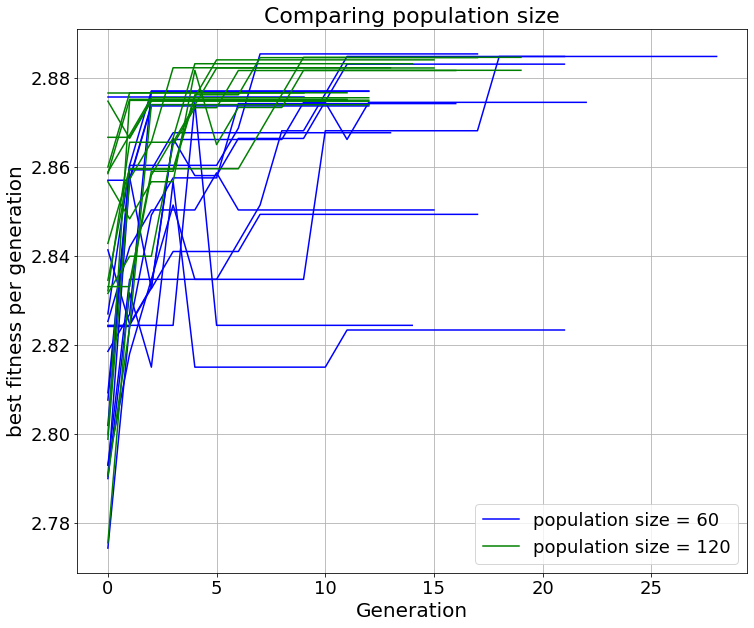

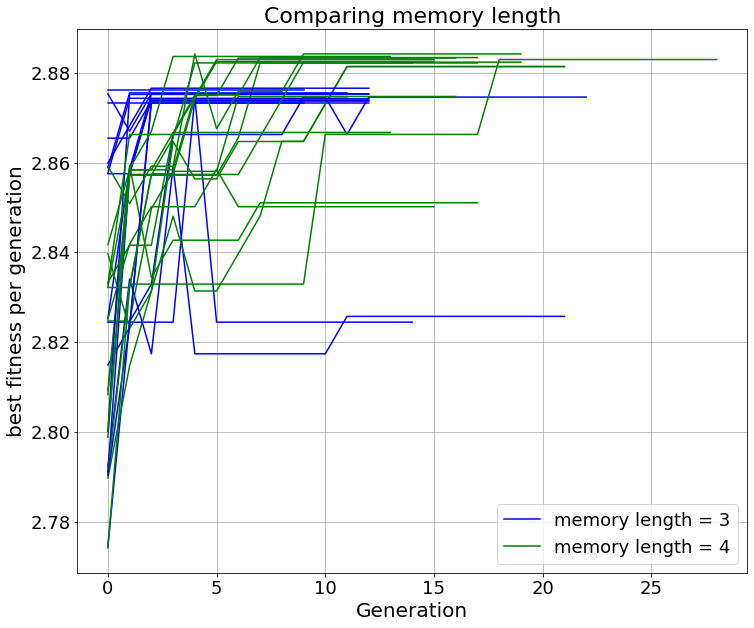

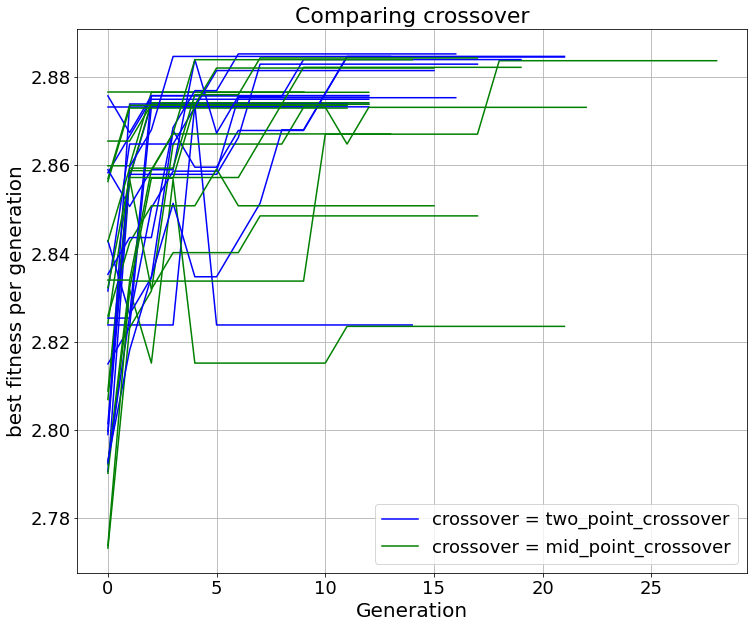

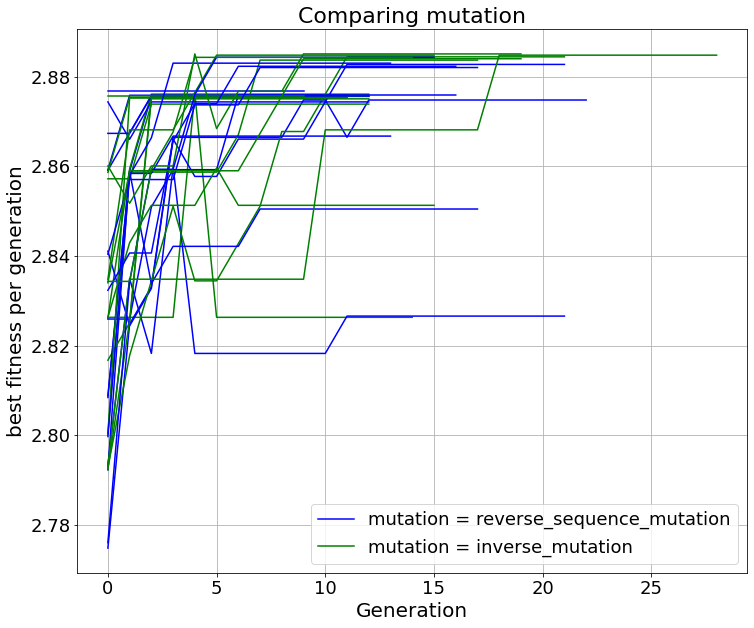

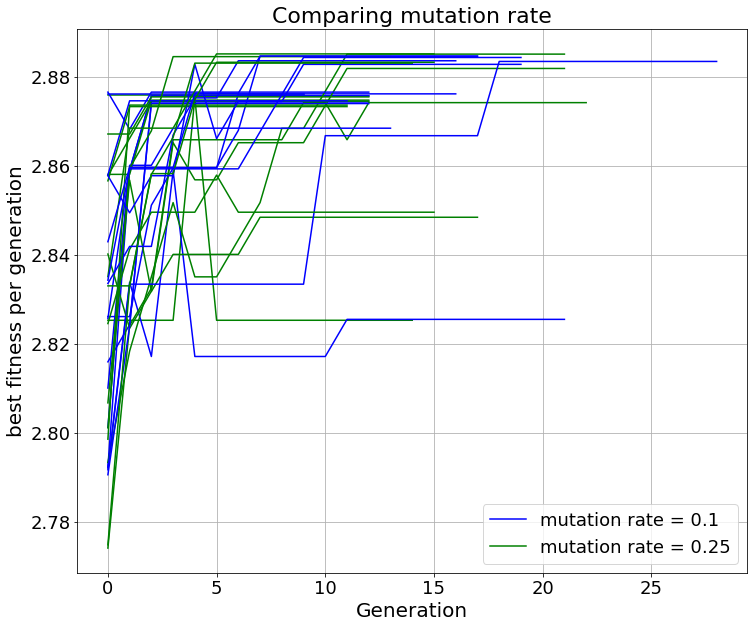

In [251]:
"""
Plotting best population fitness over generations
""" 

plot(results, 'population size', 'best fitness per generation', 0.002)
plot(results, 'memory length', 'best fitness per generation', 0.002)
plot(results, 'crossover', 'best fitness per generation', 0.002)
plot(results, 'mutation', 'best fitness per generation', 0.002)
plot(results, 'mutation rate', 'best fitness per generation', 0.002)

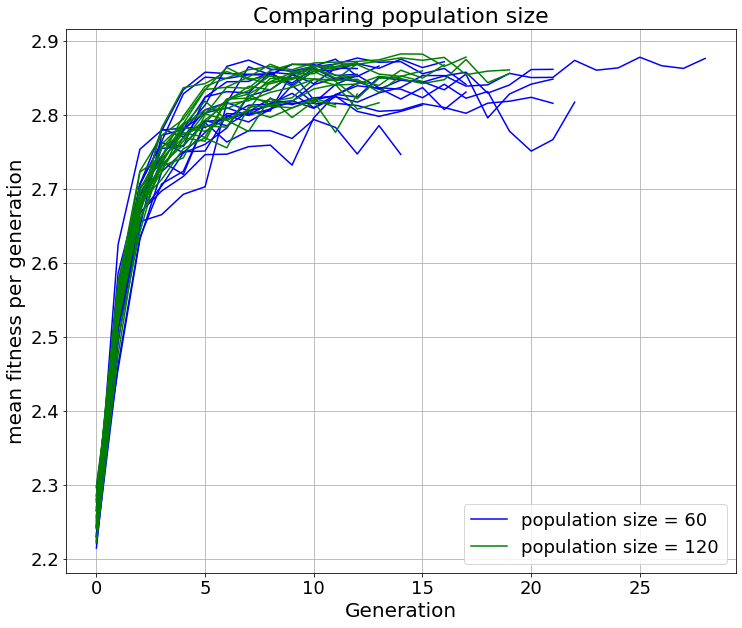

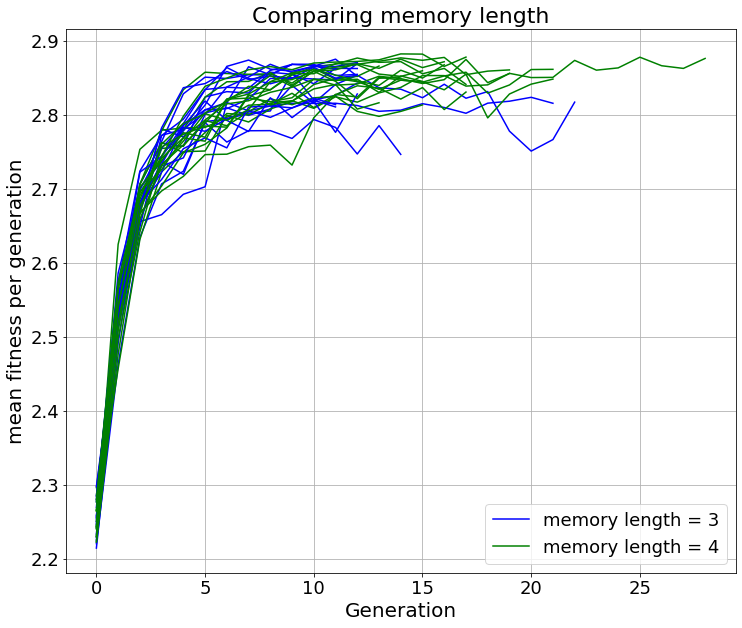

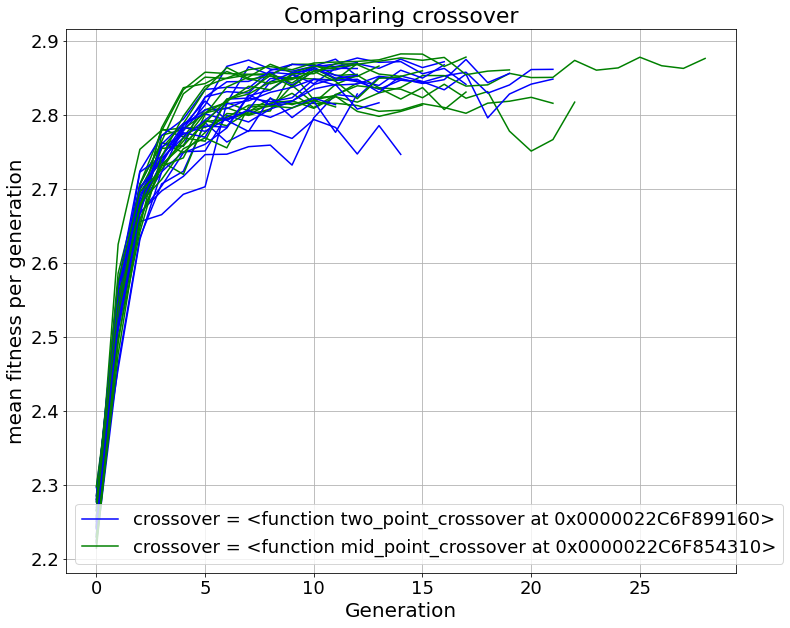

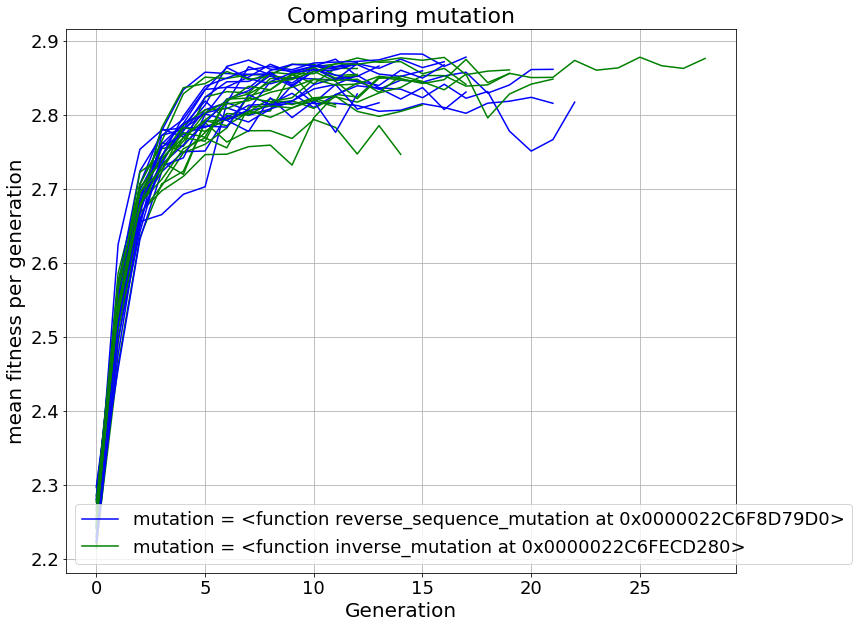

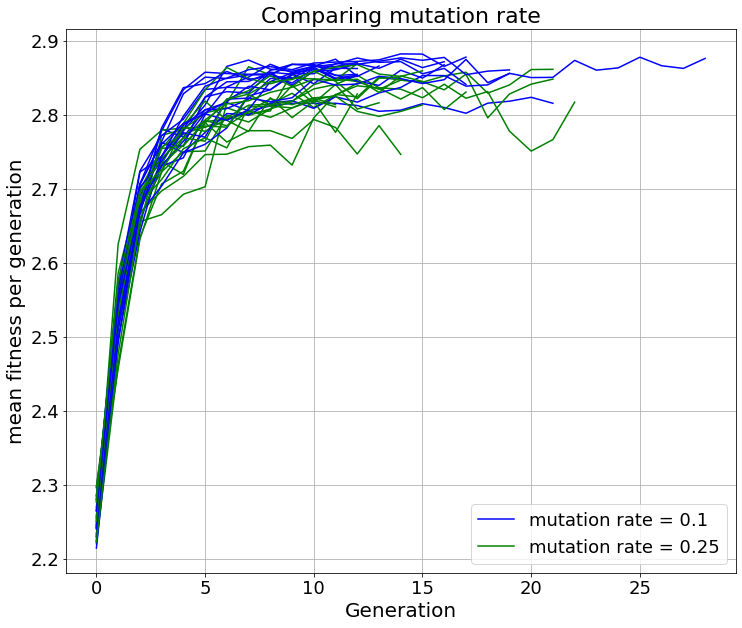

In [214]:
"""
Plotting mean population fitness over generations
""" 

plot(results, 'population size', 'mean fitness per generation', 0)
plot(results, 'memory length', 'mean fitness per generation', 0)
plot(results, 'crossover', 'mean fitness per generation', 0)
plot(results, 'mutation', 'mean fitness per generation', 0)
plot(results, 'mutation rate', 'mean fitness per generation', 0)

Best Strategy = [0, 0, 1, 0, 1, 0, 1, 0, 0] 
Fitness = 2.808333333333333


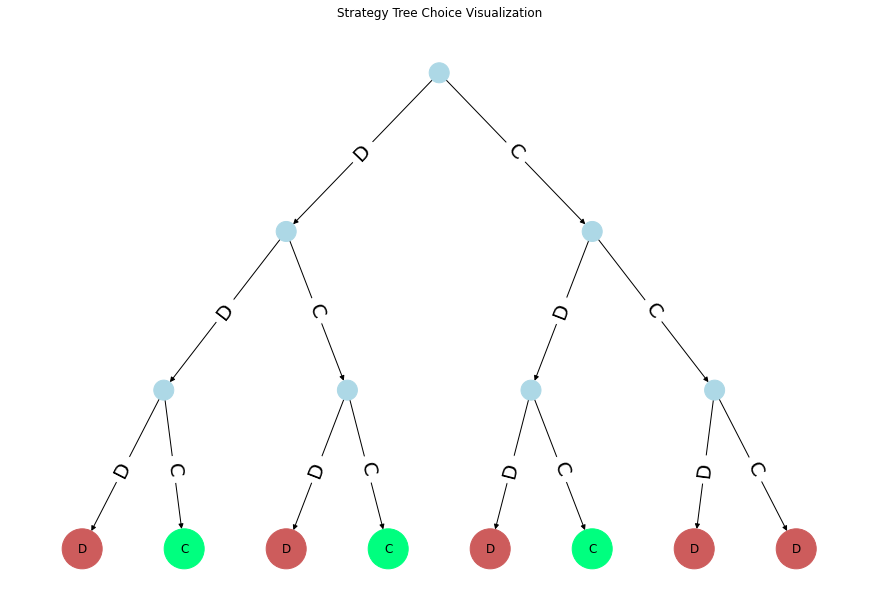

Best Strategy = [0, 0, 0, 1, 1, 0, 0, 0, 0] 
Fitness = 2.683333333333333


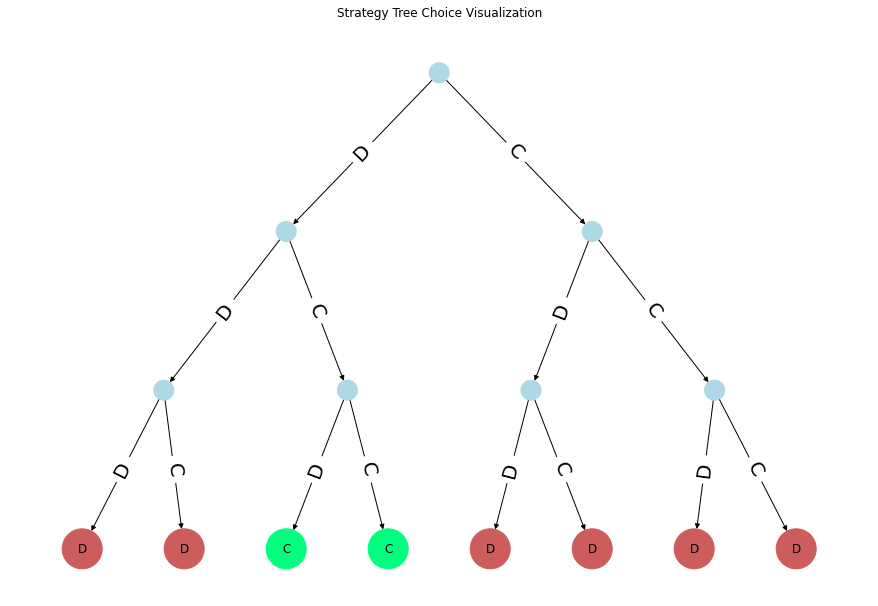

Best Strategy = [1, 0, 1, 0, 1, 1, 0, 1, 0] 
Fitness = 2.791666666666667


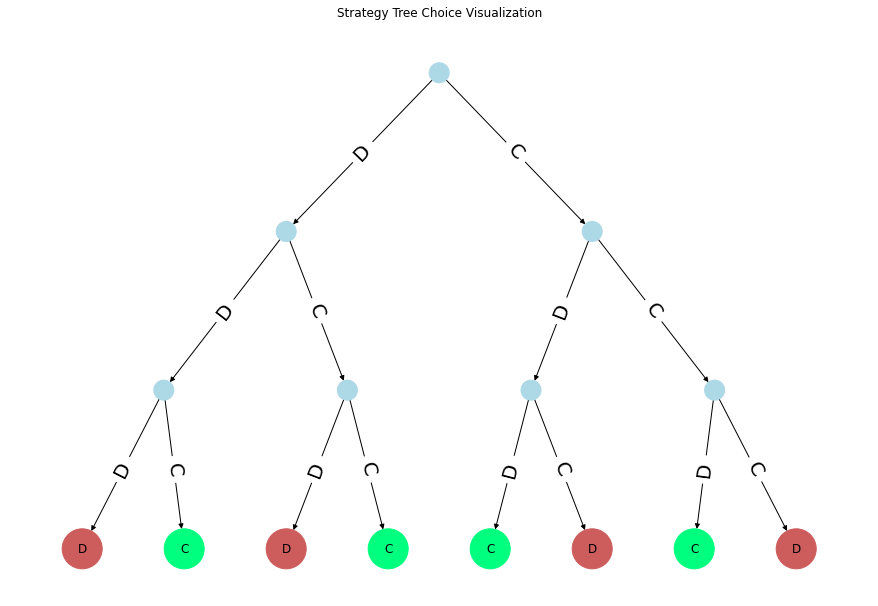

Best Strategy = [1, 0, 0, 0, 1, 1, 1, 1, 0] 
Fitness = 2.825


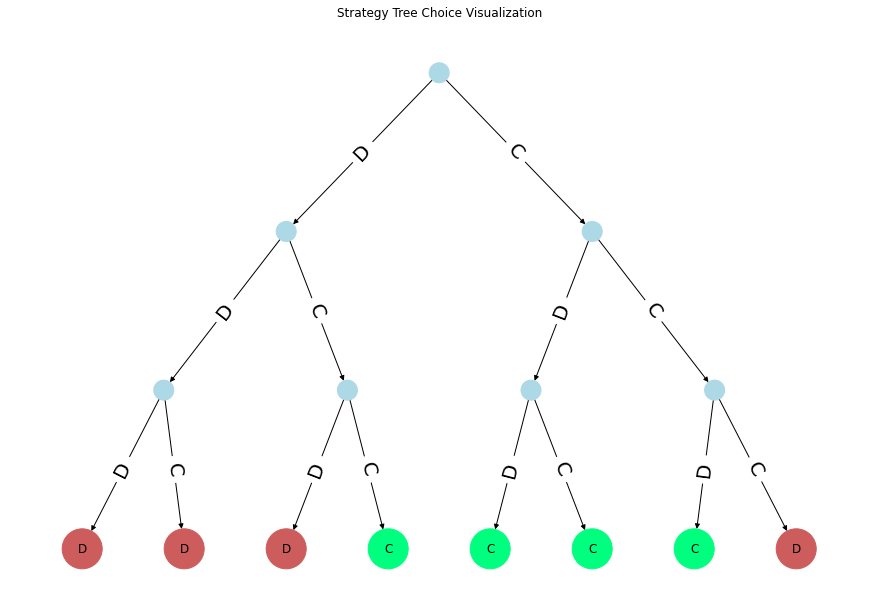

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 2.8


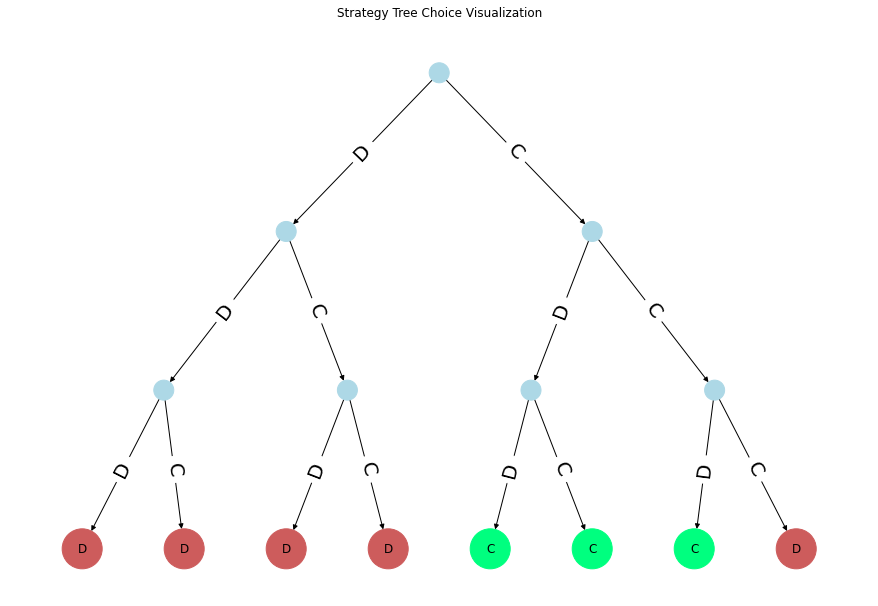

Best Strategy = [0, 0, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 2.7333333333333334


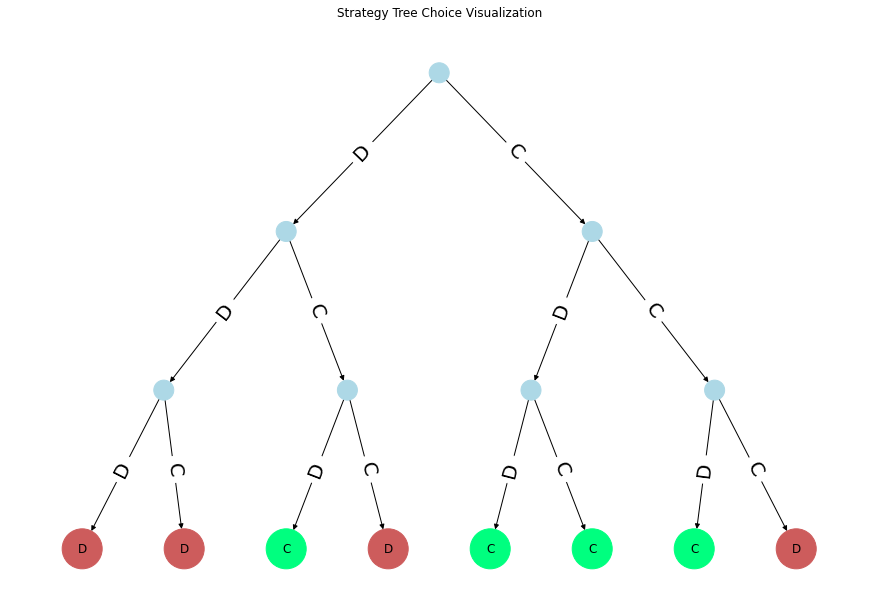

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875


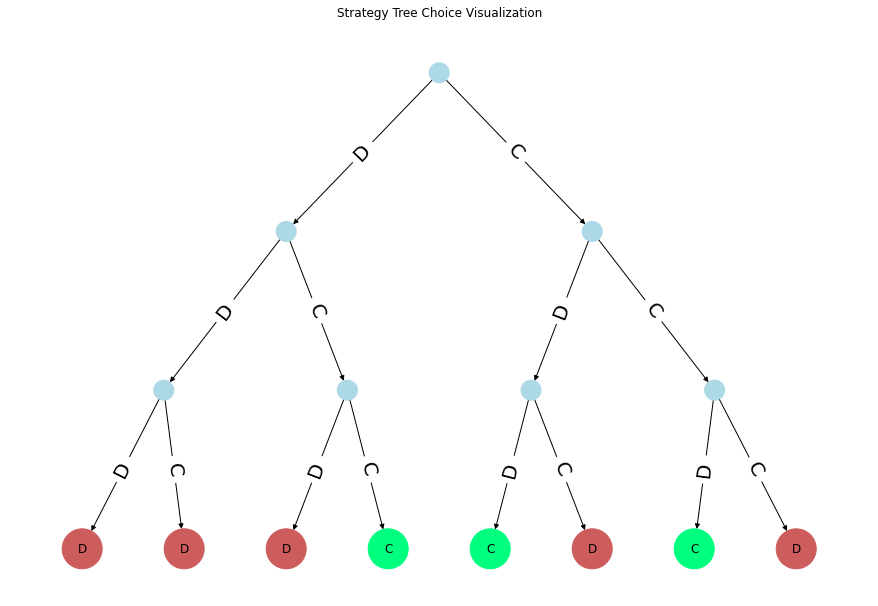

Best Strategy = [0, 0, 1, 0, 1, 1, 1, 1, 0] 
Fitness = 2.791666666666667


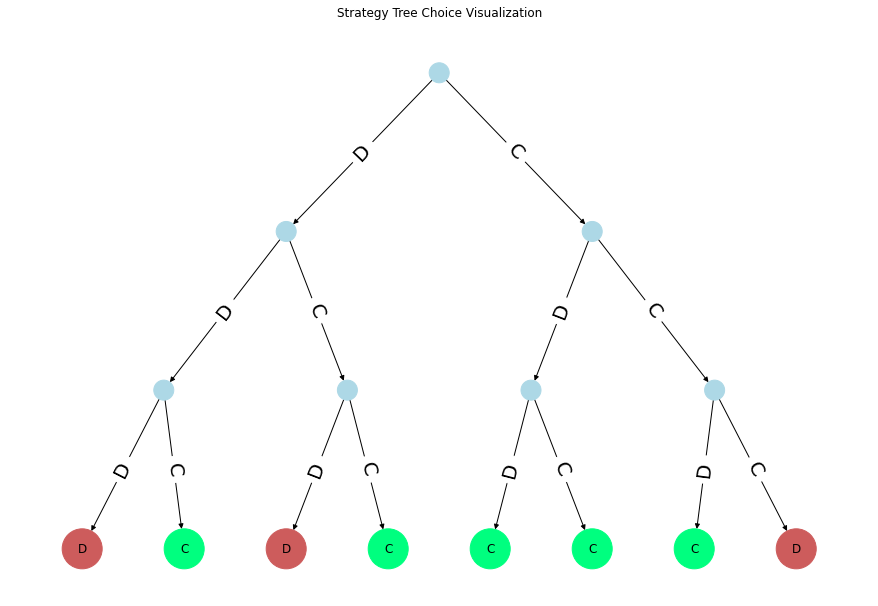

Best Strategy = [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0] 
Fitness = 2.8666666666666667


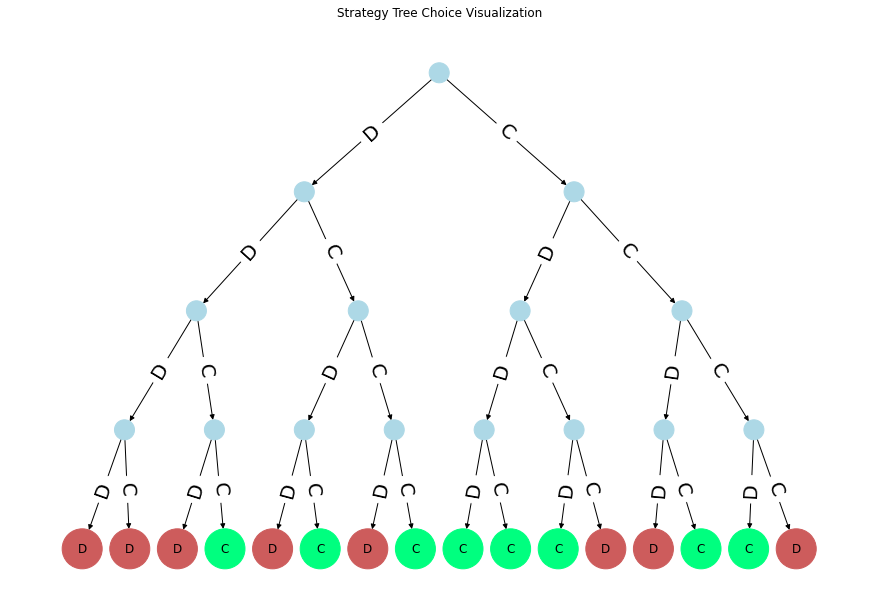

Best Strategy = [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 2.8666666666666667


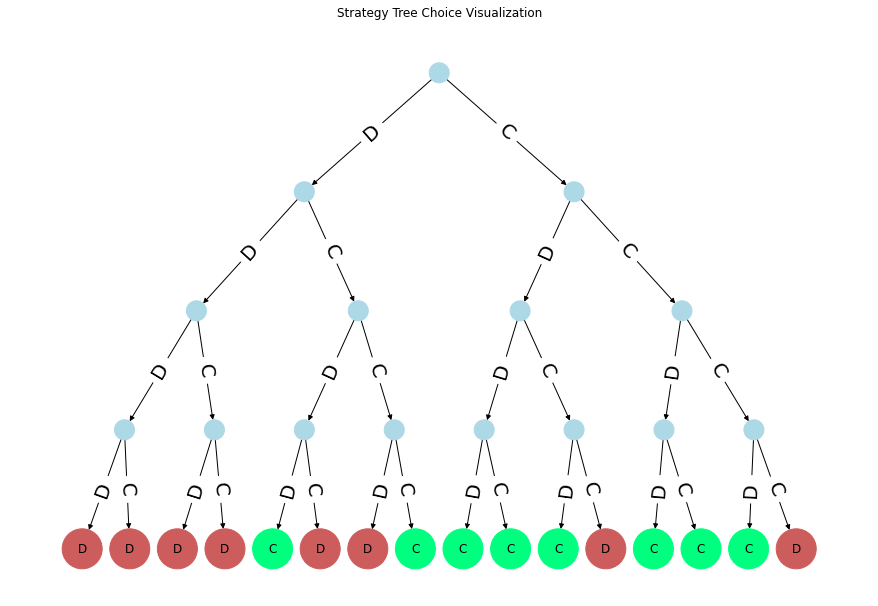

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 2.8833333333333333


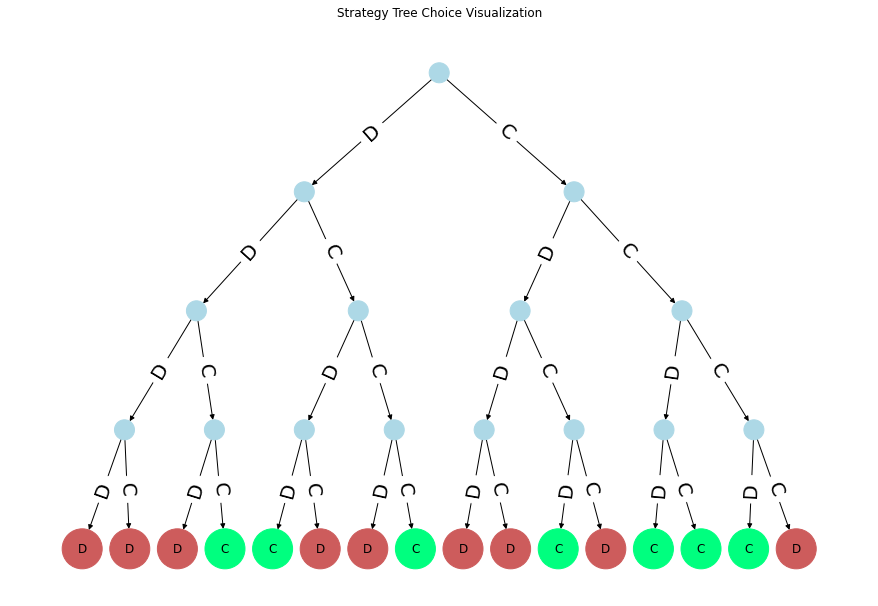

Best Strategy = [0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0] 
Fitness = 2.8666666666666667


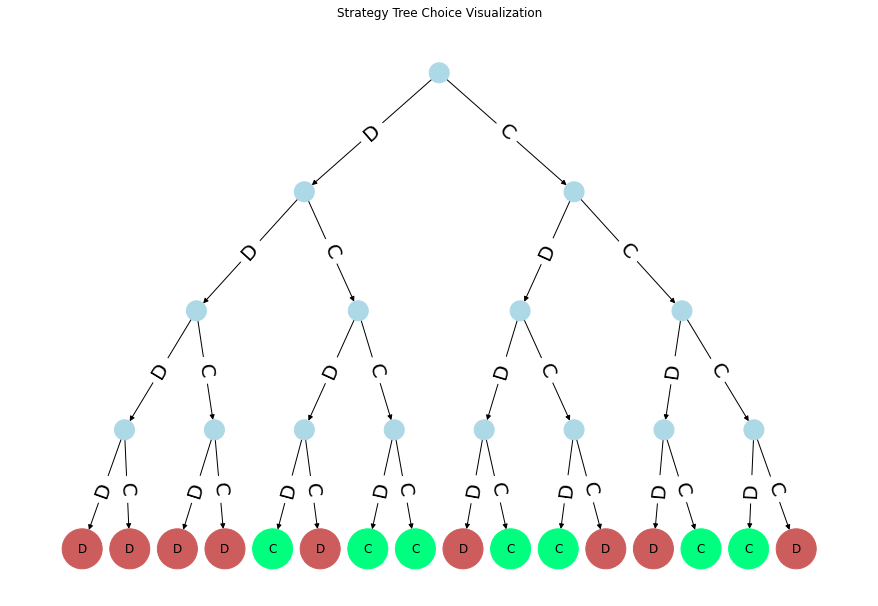

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 2.8583333333333334


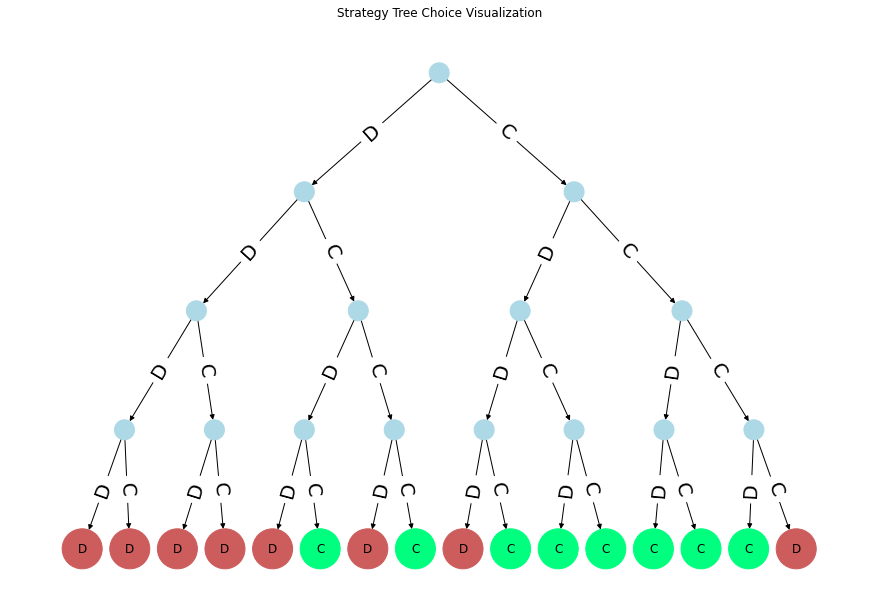

Best Strategy = [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0] 
Fitness = 2.533333333333333


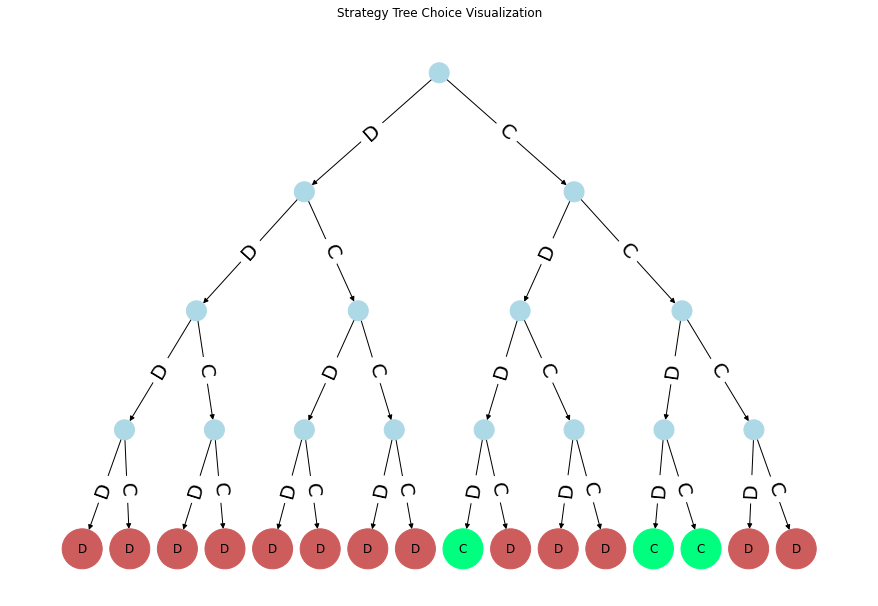

Best Strategy = [0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 2.8666666666666667


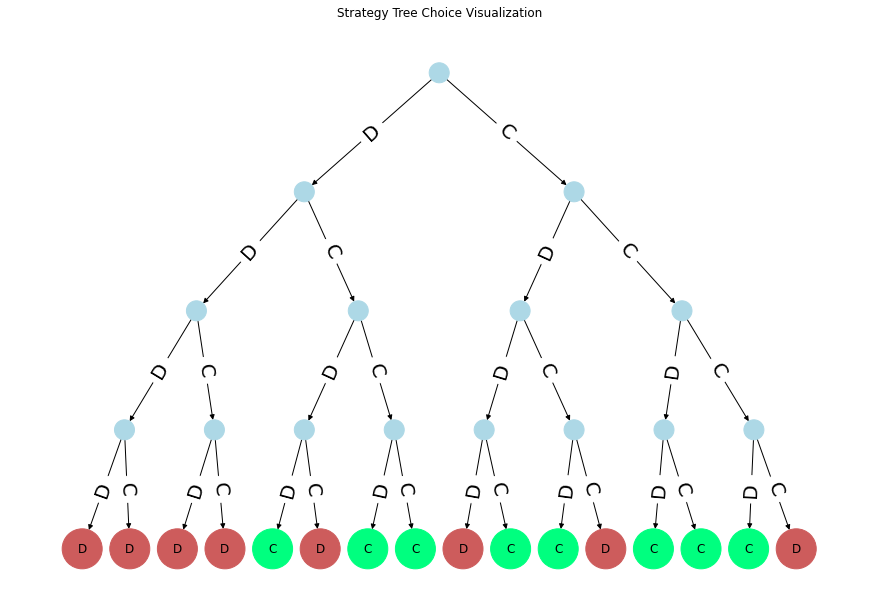

Best Strategy = [0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0] 
Fitness = 2.816666666666667


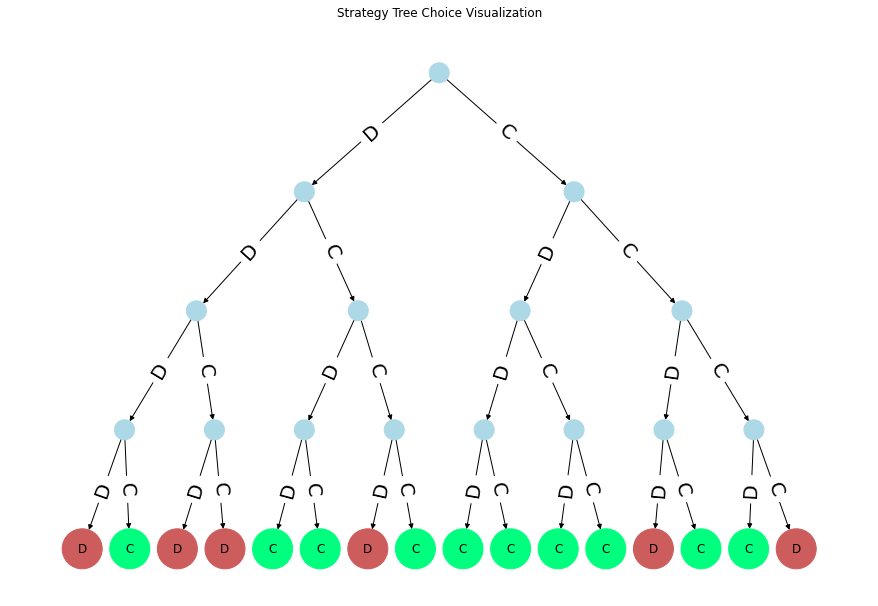

Best Strategy = [1, 0, 0, 0, 1, 0, 0, 1, 0] 
Fitness = 2.3833333333333333


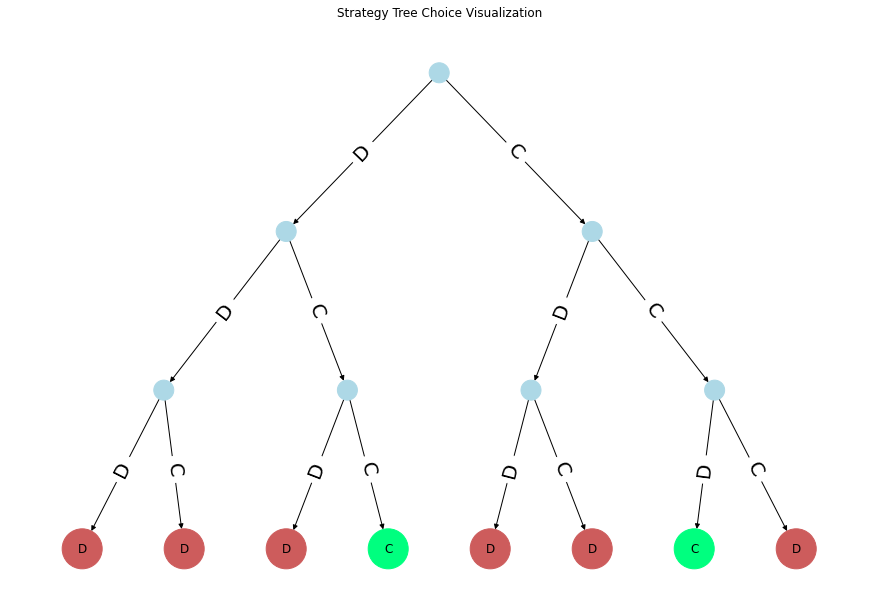

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 1, 0] 
Fitness = 2.8583333333333334


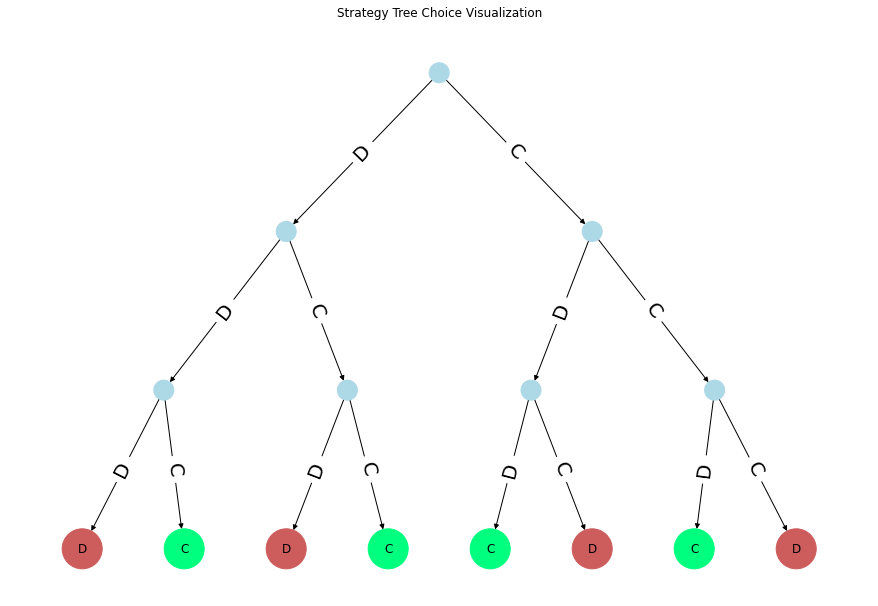

Best Strategy = [1, 0, 0, 0, 1, 1, 1, 0, 0] 
Fitness = 2.583333333333333


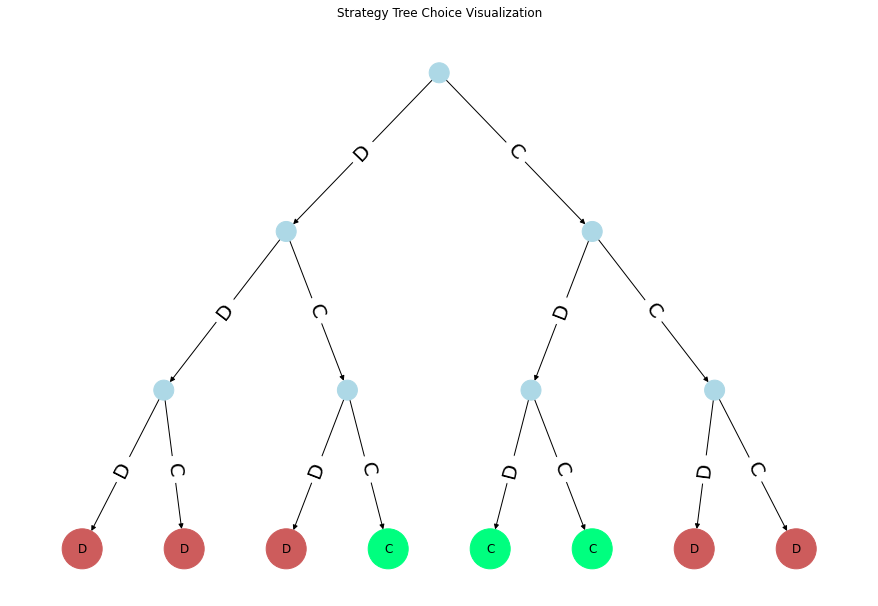

Best Strategy = [0, 0, 1, 0, 1, 0, 1, 1, 0] 
Fitness = 2.783333333333333


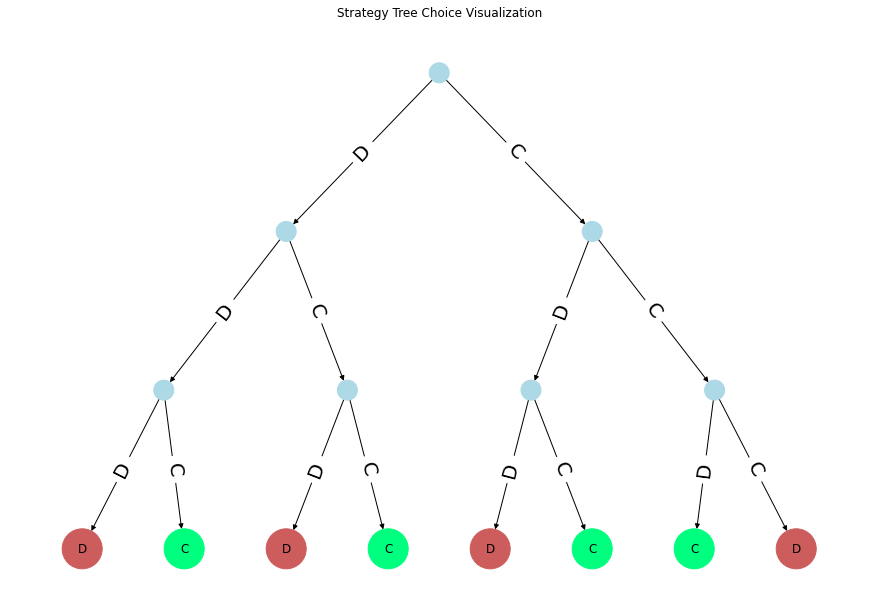

Best Strategy = [0, 0, 0, 1, 0, 1, 0, 1, 0] 
Fitness = 2.75


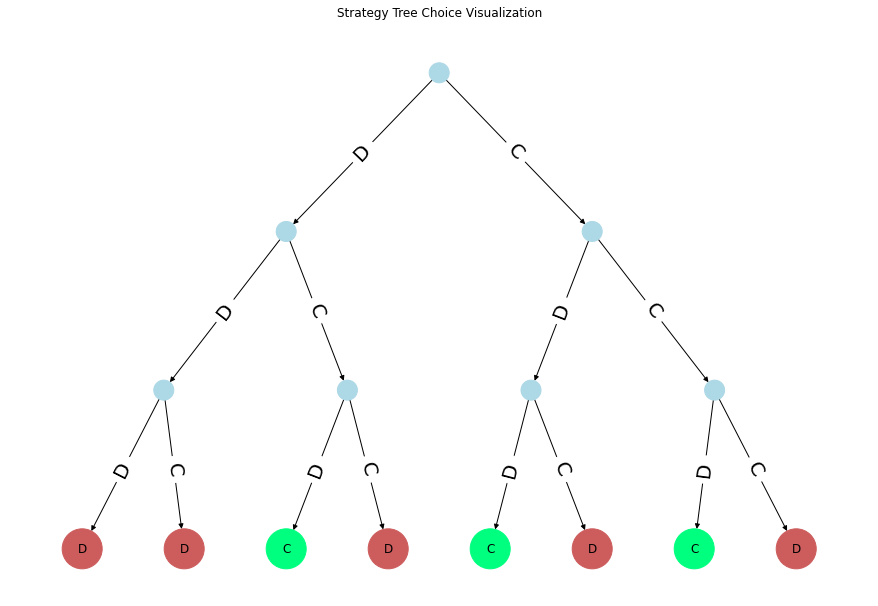

Best Strategy = [0, 0, 0, 1, 0, 1, 0, 1, 0] 
Fitness = 2.75


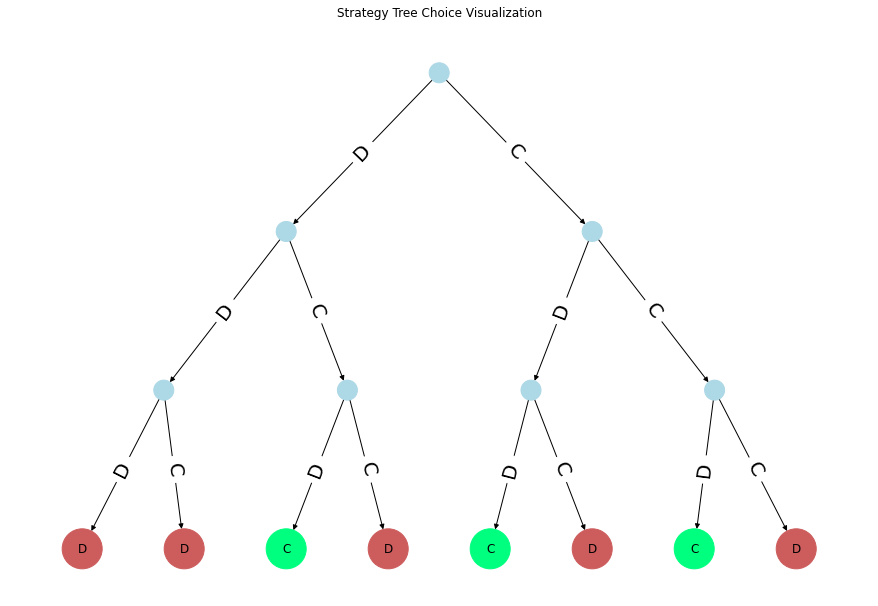

Best Strategy = [0, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 2.875


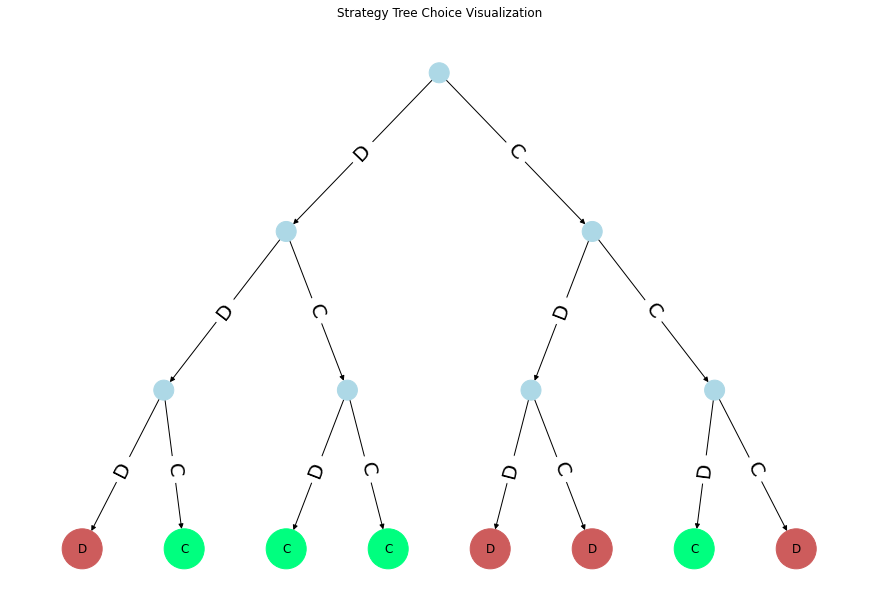

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 2.8


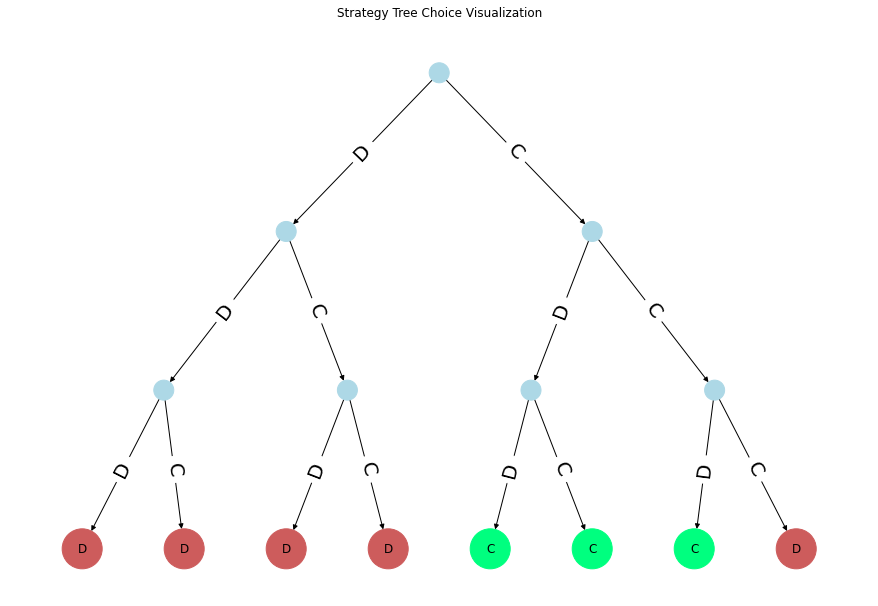

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0] 
Fitness = 2.725


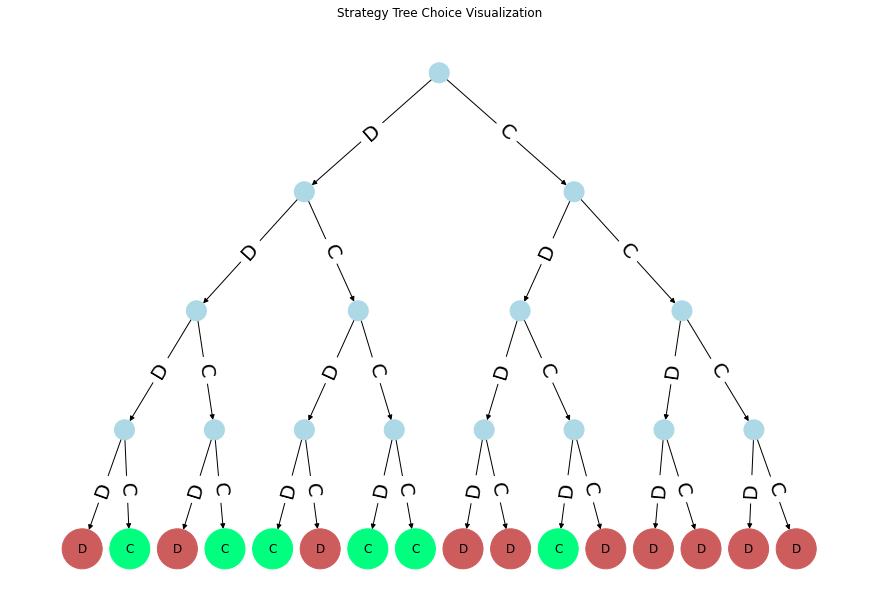

Best Strategy = [1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 2.791666666666667


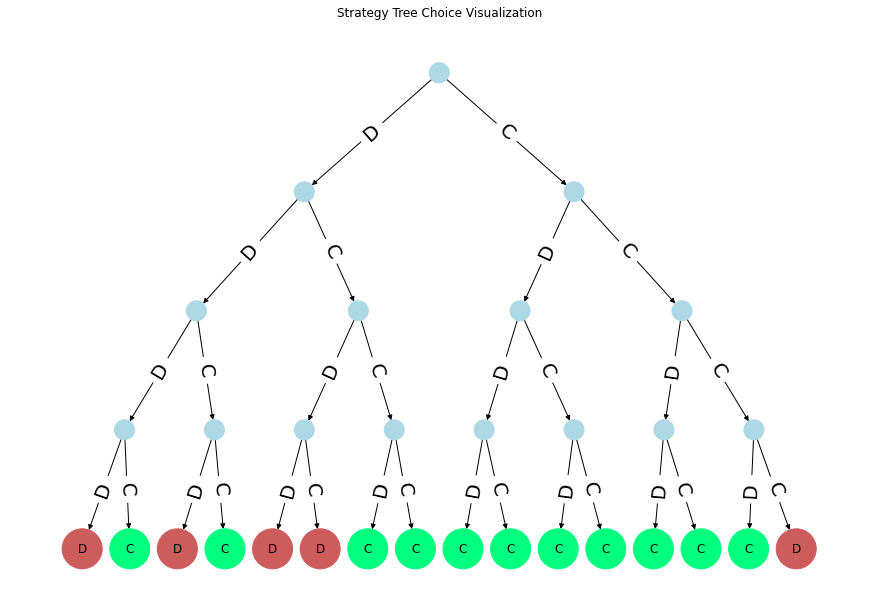

Best Strategy = [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 2.85


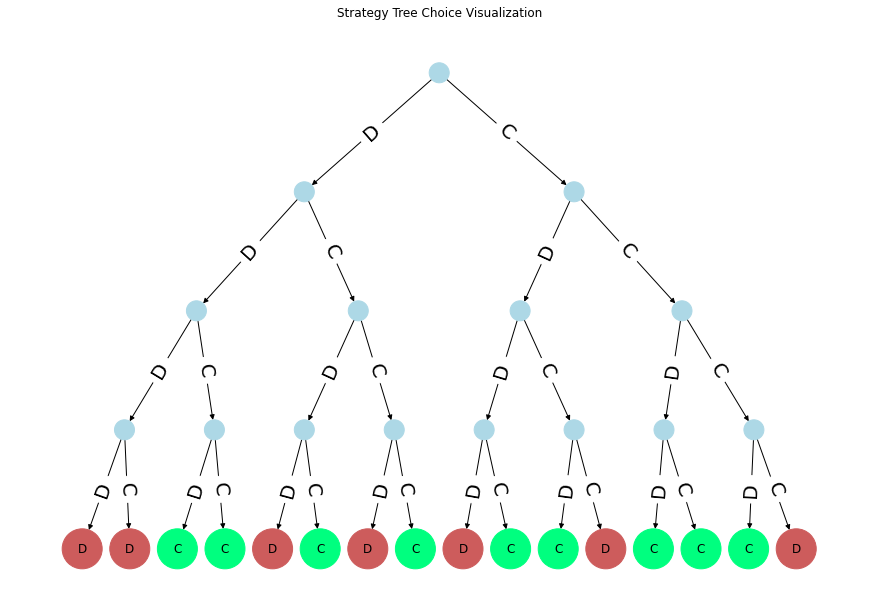

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 2.8666666666666667


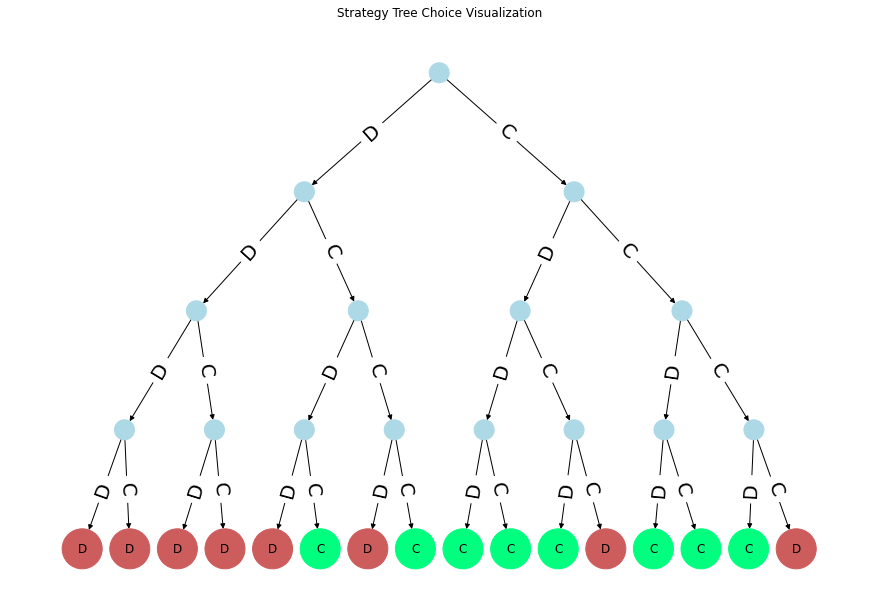

Best Strategy = [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0] 
Fitness = 2.775


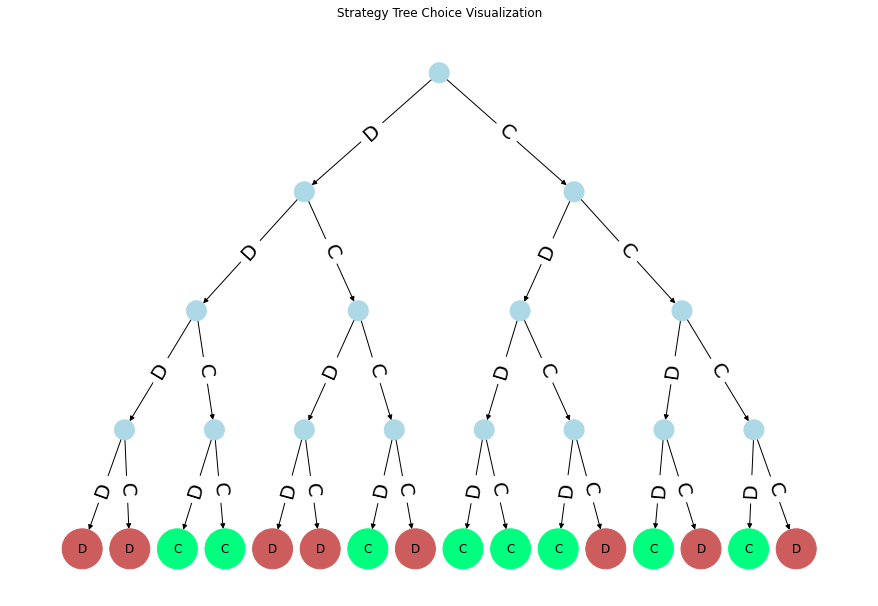

Best Strategy = [0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 2.775


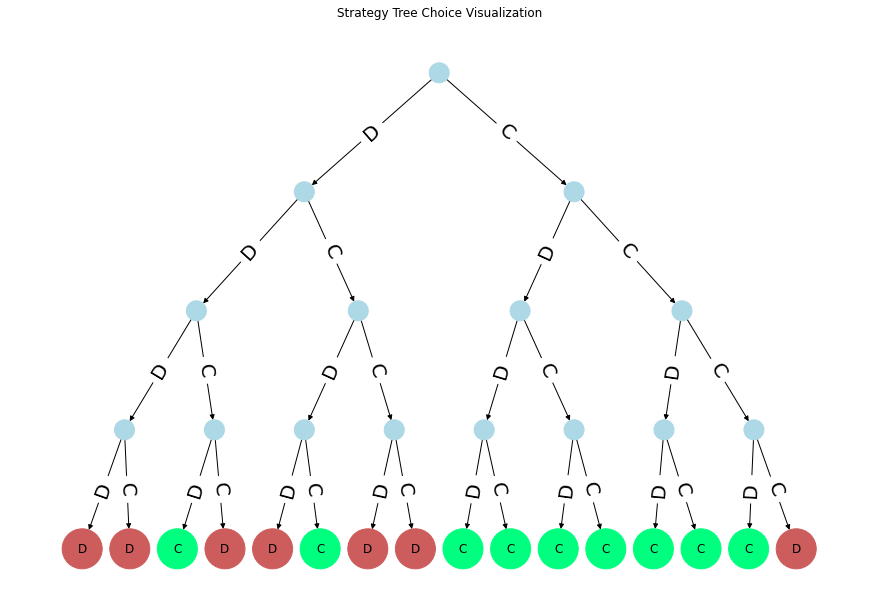

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0] 
Fitness = 2.7416666666666667


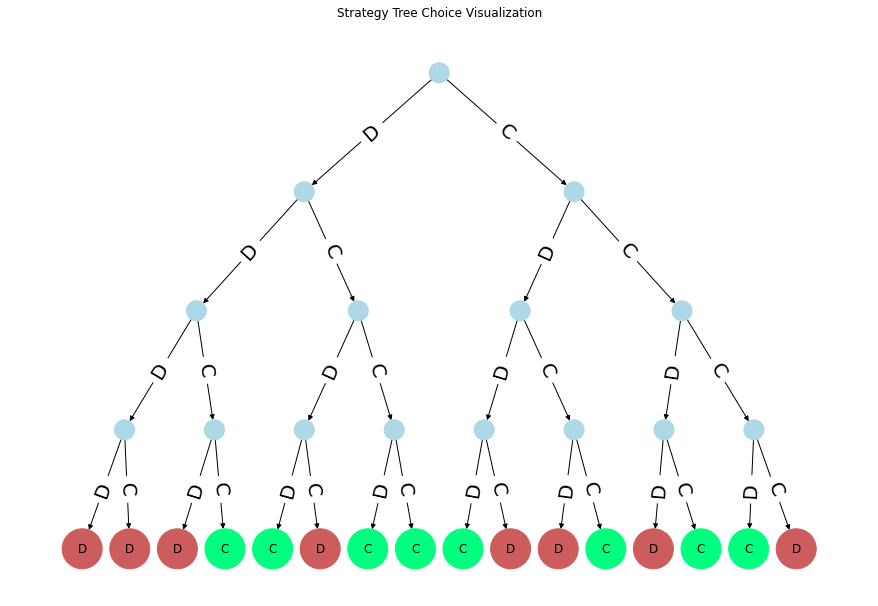

Best Strategy = [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0] 
Fitness = 2.833333333333333


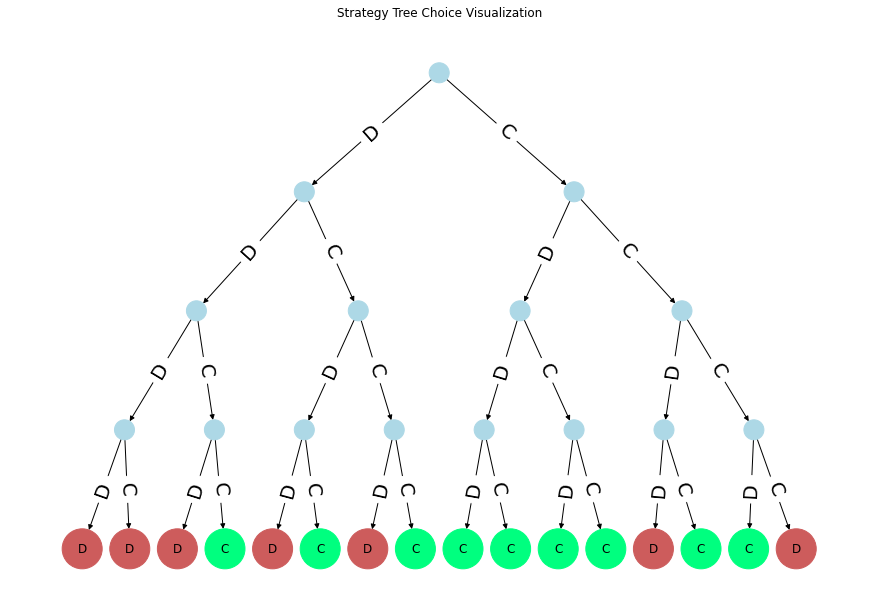

In [235]:
for best_result in results:
    best_strategy = best_result['strategy']
    print("Best Strategy =", best_strategy, "\nFitness =", fitness(best_strategy, 40))
    binary_tree_plot(best_strategy)

In [216]:
"""
COOPERATIVE POPULATION

GRID SEARCH ALL HYPERPARAMETER COMBINATIONS 
""" 

results_c = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness_c)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness_c(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results_c.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685 
Time Taken =  4 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [1, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.6350000000000002 
Time Taken =  4 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 1, 1, 0] 
Fitness = 3.655 
Time Taken =  5 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator 

Best Strategy = [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0] 
Fitness = 3.71 
Time Taken =  14 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 3.65 
Time Taken =  19 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0] 
Fitness = 3.53 
Time Taken =  8 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0,

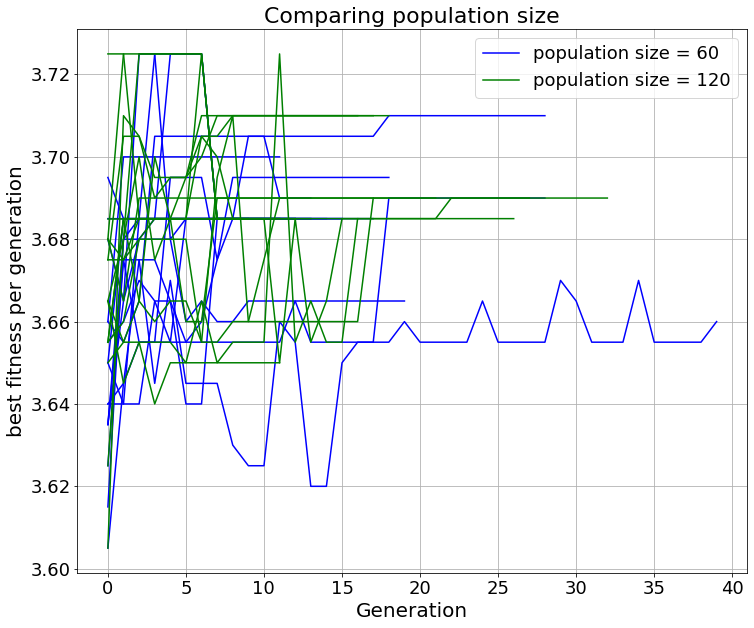

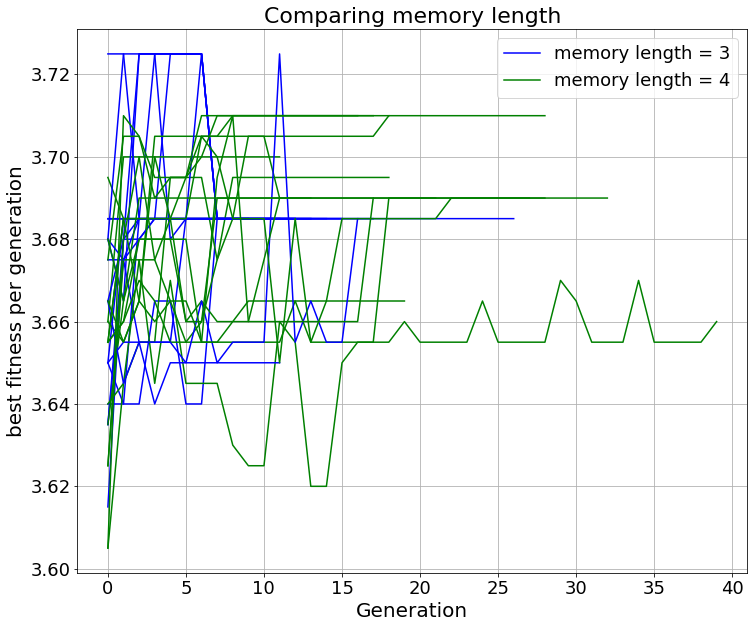

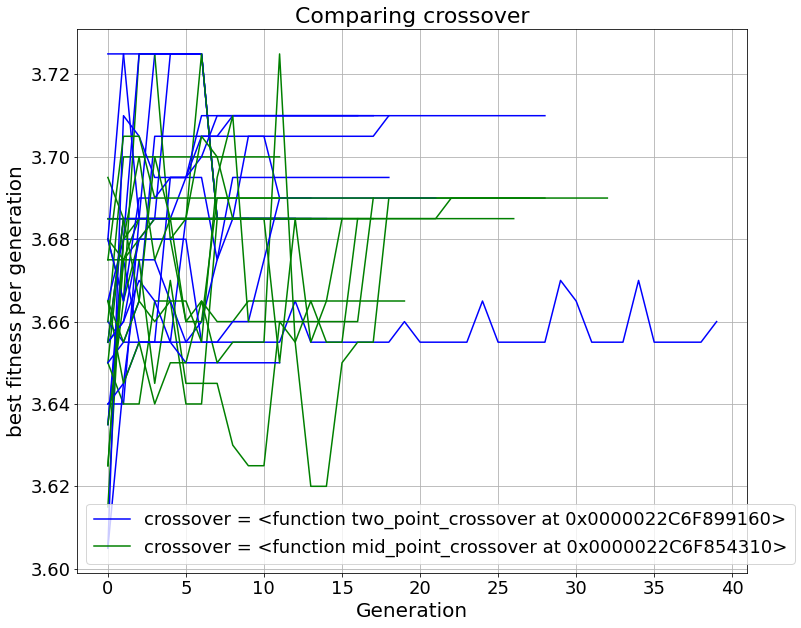

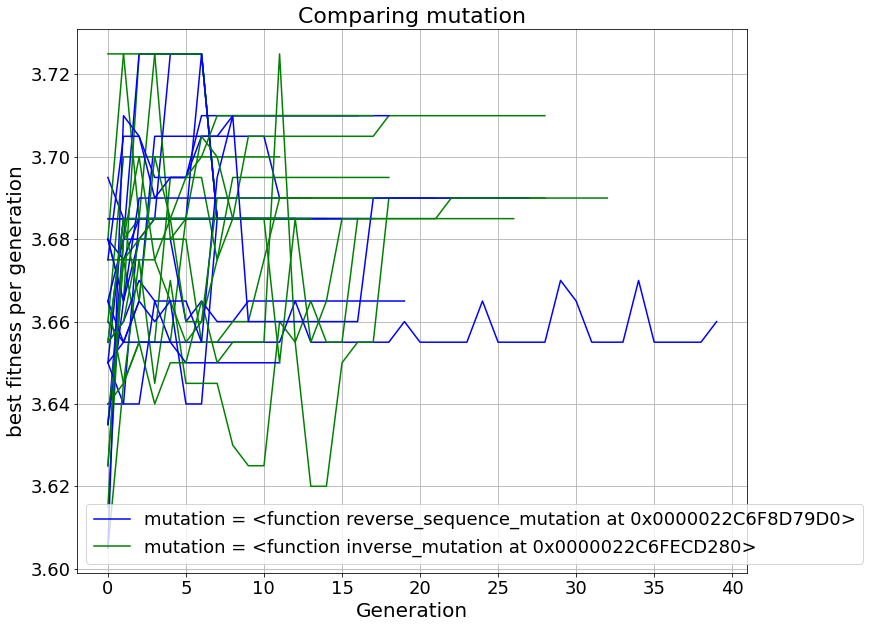

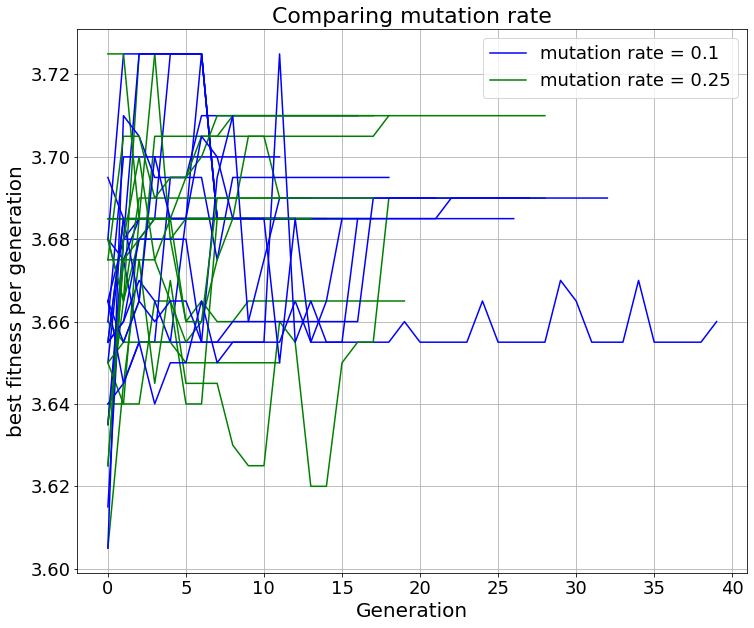

In [217]:
"""
Plotting best population fitness over generations for cooperative population
""" 

plot(results_c, 'population size', 'best fitness per generation', 0)
plot(results_c, 'memory length', 'best fitness per generation', 0)
plot(results_c, 'crossover', 'best fitness per generation', 0)
plot(results_c, 'mutation', 'best fitness per generation', 0)
plot(results_c, 'mutation rate', 'best fitness per generation', 0)

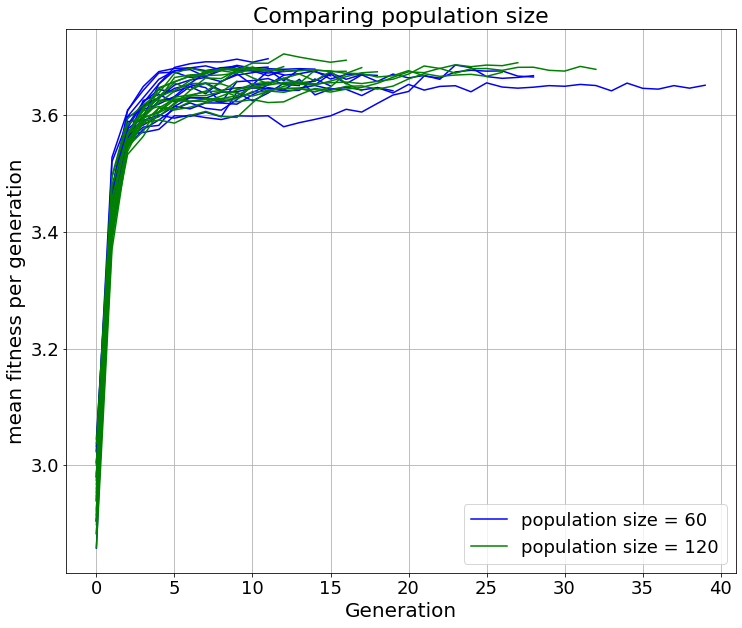

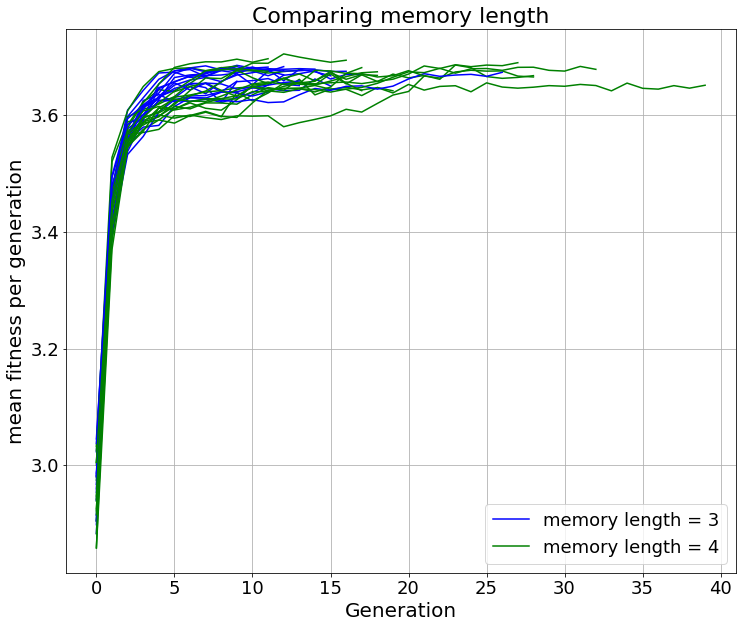

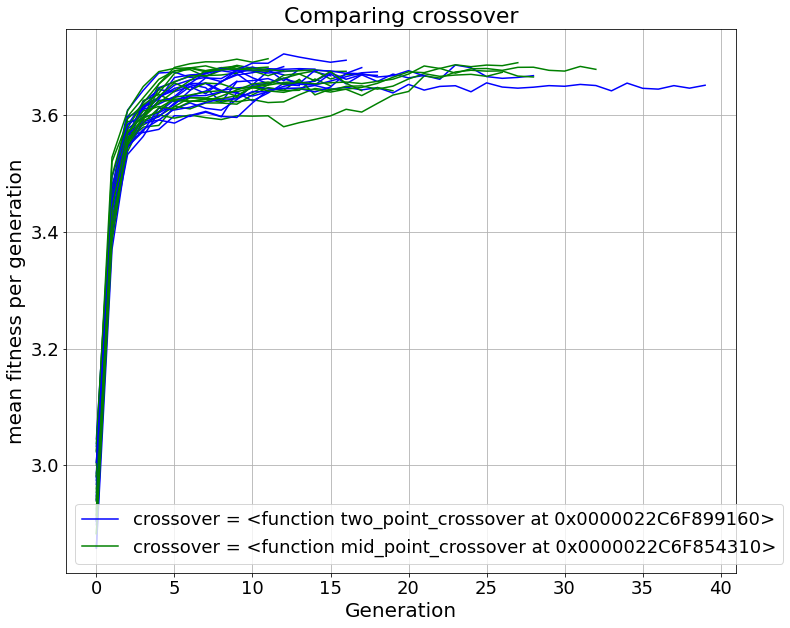

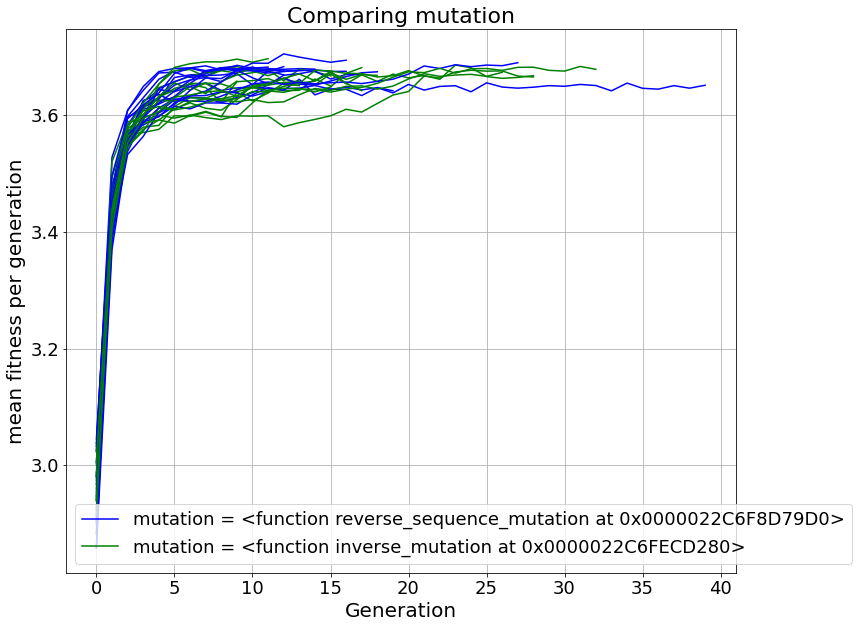

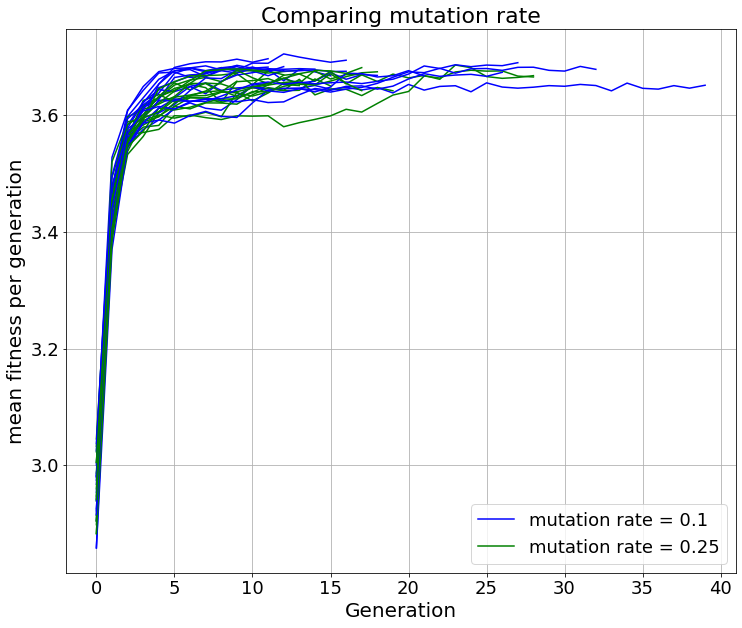

In [218]:
"""
Plotting mean population fitness over generations for cooperative population
""" 

plot(results_c, 'population size', 'mean fitness per generation', 0)
plot(results_c, 'memory length', 'mean fitness per generation', 0)
plot(results_c, 'crossover', 'mean fitness per generation', 0)
plot(results_c, 'mutation', 'mean fitness per generation', 0)
plot(results_c, 'mutation rate', 'mean fitness per generation', 0)

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685


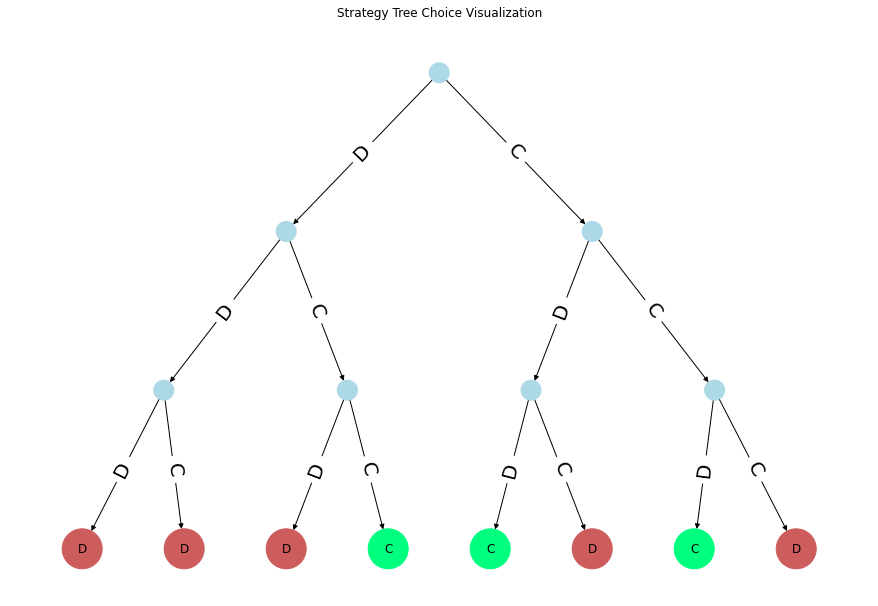

Best Strategy = [1, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.6350000000000002


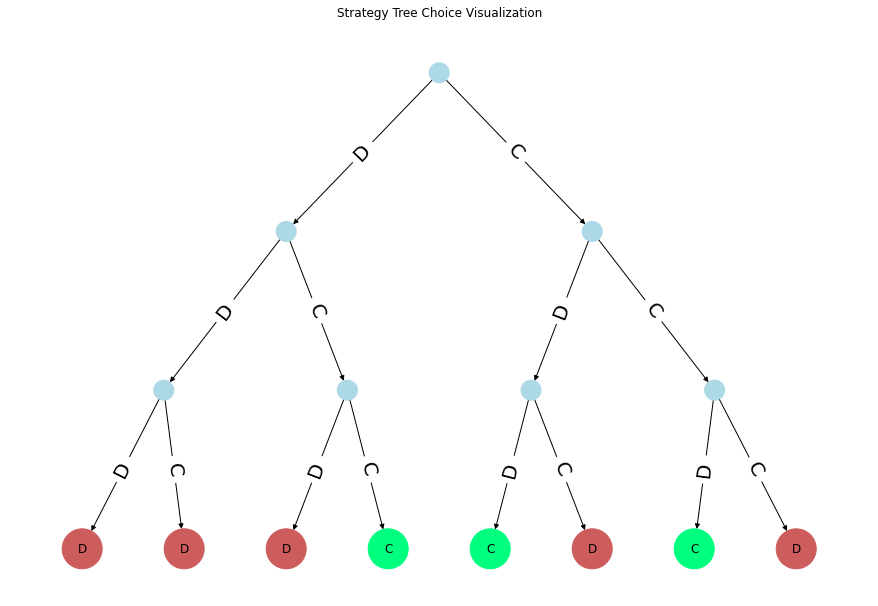

Best Strategy = [0, 0, 0, 0, 1, 1, 1, 1, 0] 
Fitness = 3.655


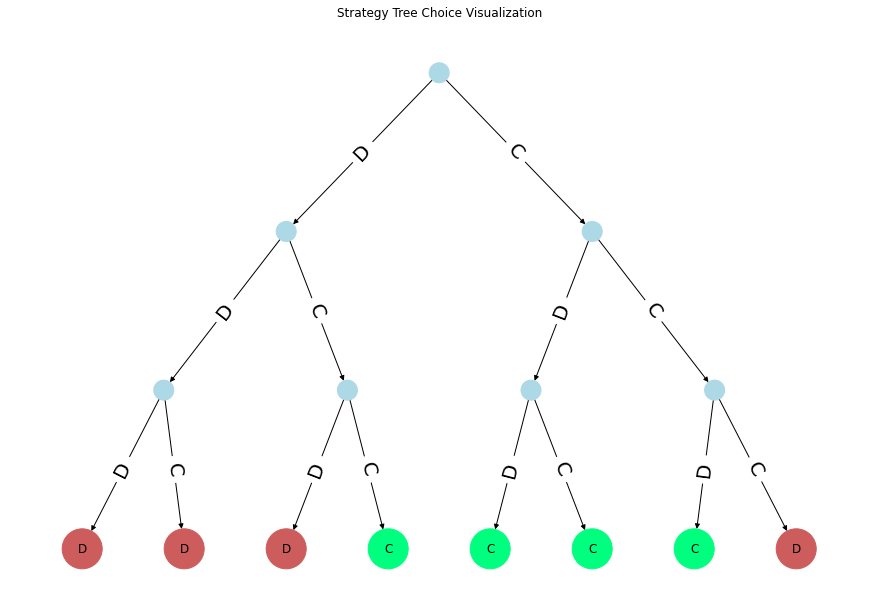

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685


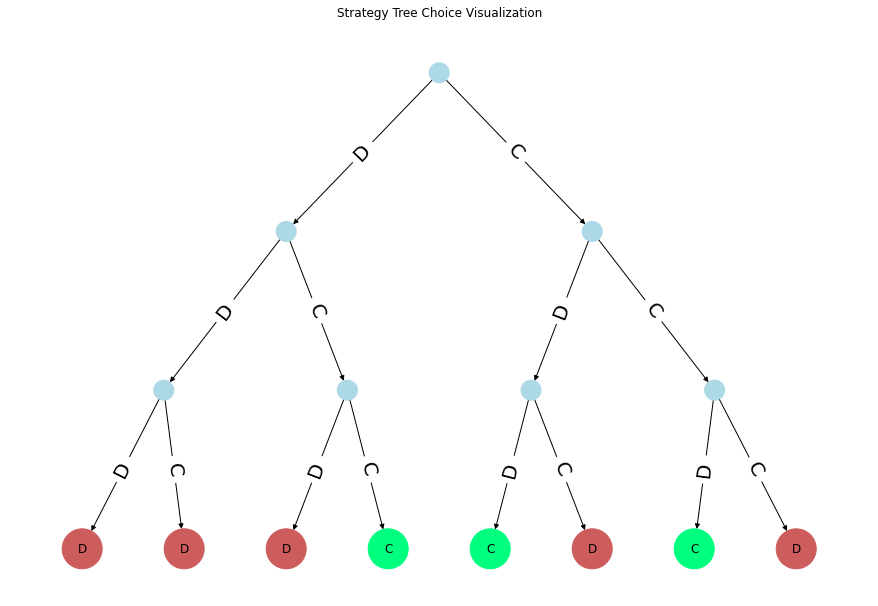

Best Strategy = [0, 0, 0, 1, 1, 1, 0, 1, 0] 
Fitness = 3.6799999999999997


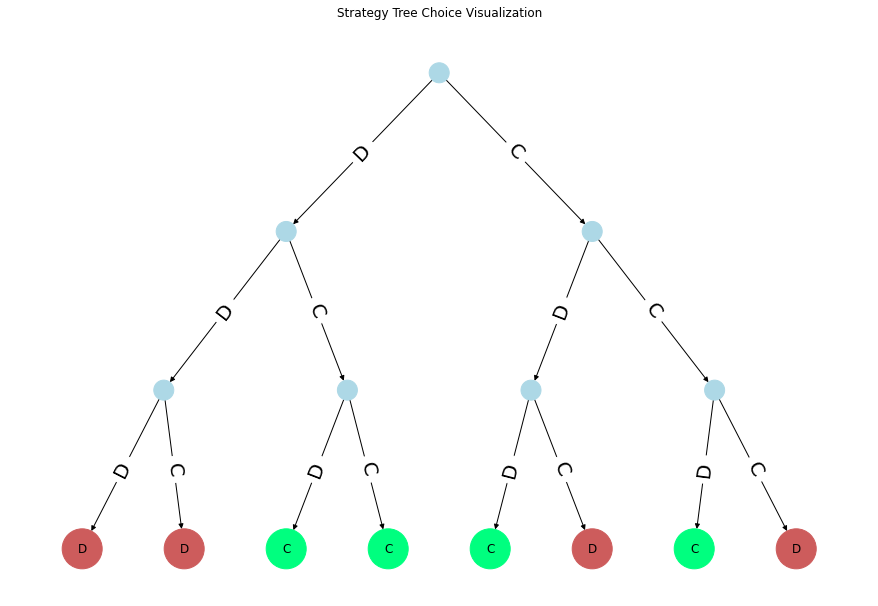

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 3.6399999999999997


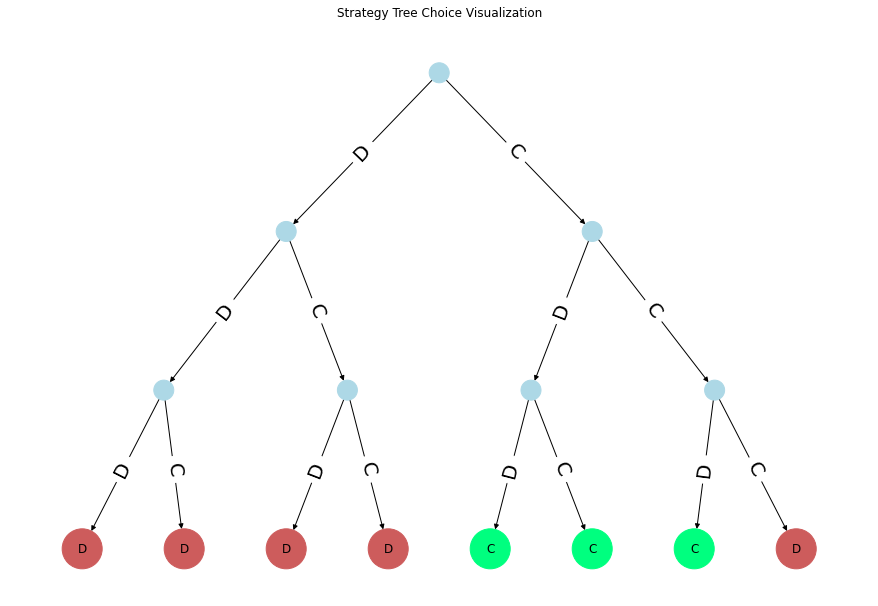

Best Strategy = [0, 0, 0, 1, 0, 1, 0, 1, 0] 
Fitness = 3.6100000000000003


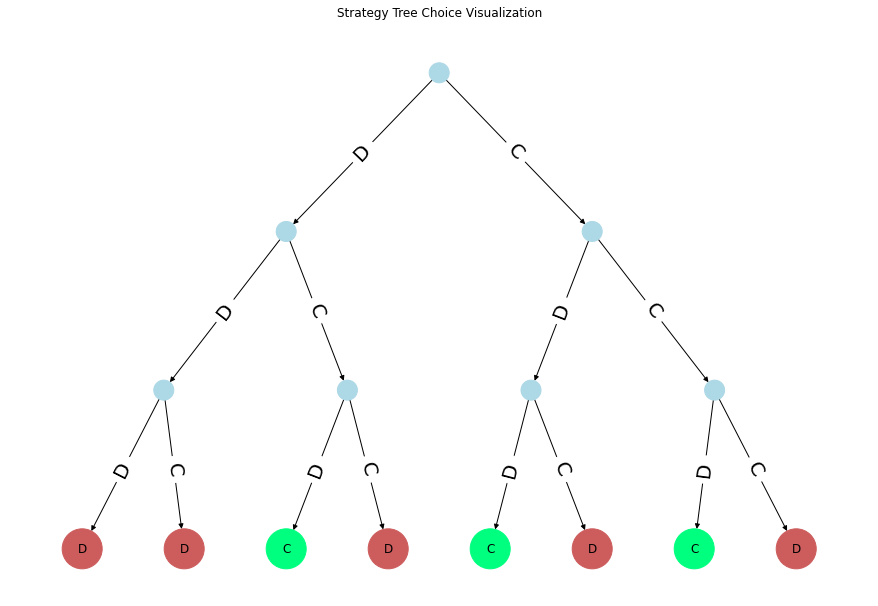

Best Strategy = [1, 0, 1, 0, 0, 0, 1, 0, 0] 
Fitness = 3.6450000000000005


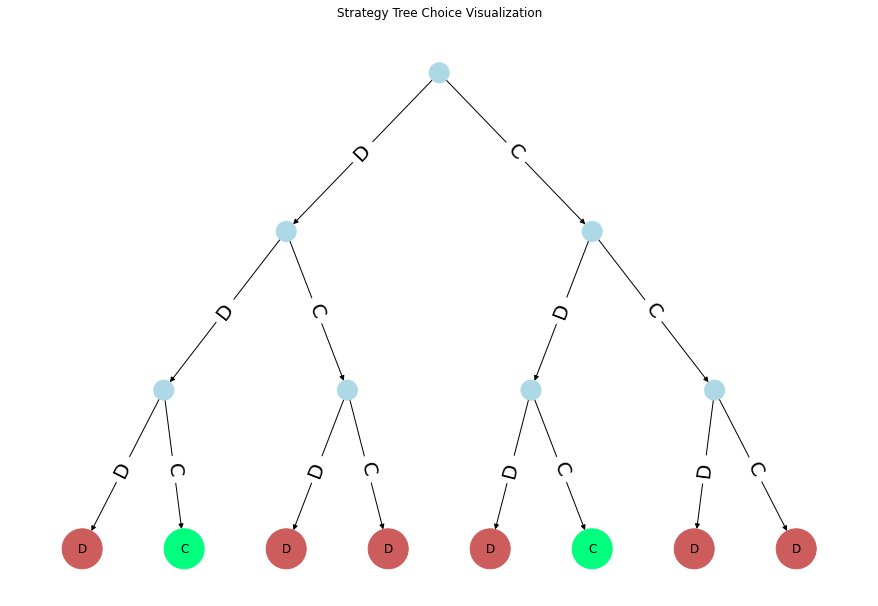

Best Strategy = [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 3.62


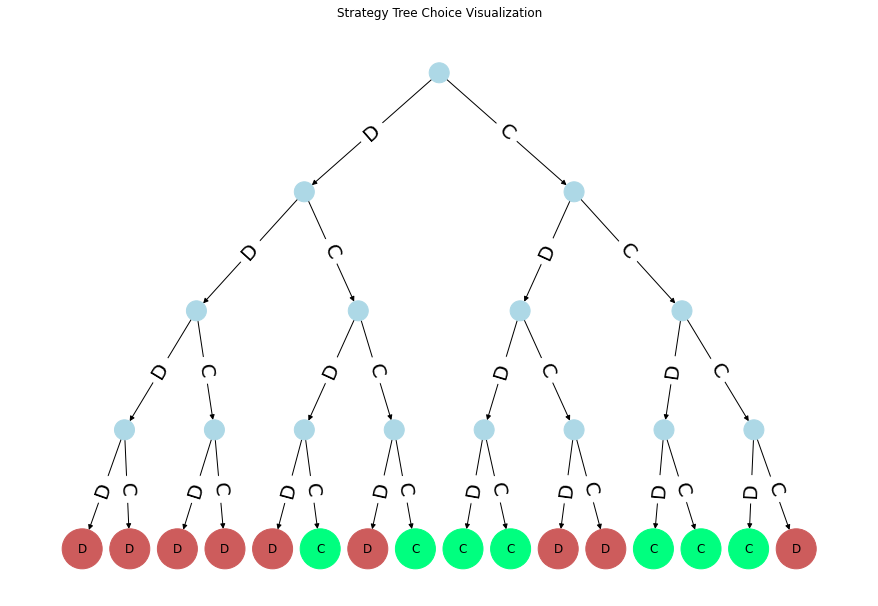

Best Strategy = [1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 3.655


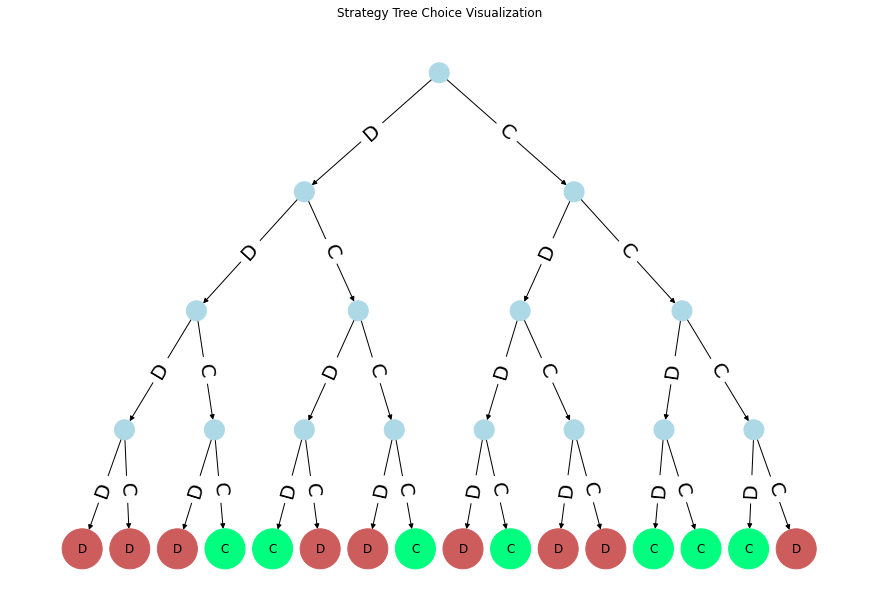

Best Strategy = [0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0] 
Fitness = 3.6149999999999998


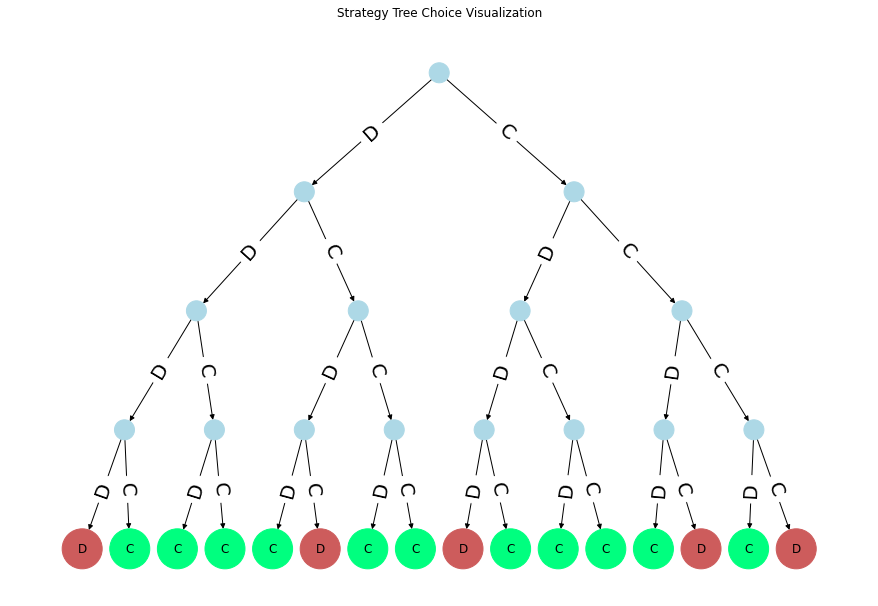

Best Strategy = [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 3.7049999999999996


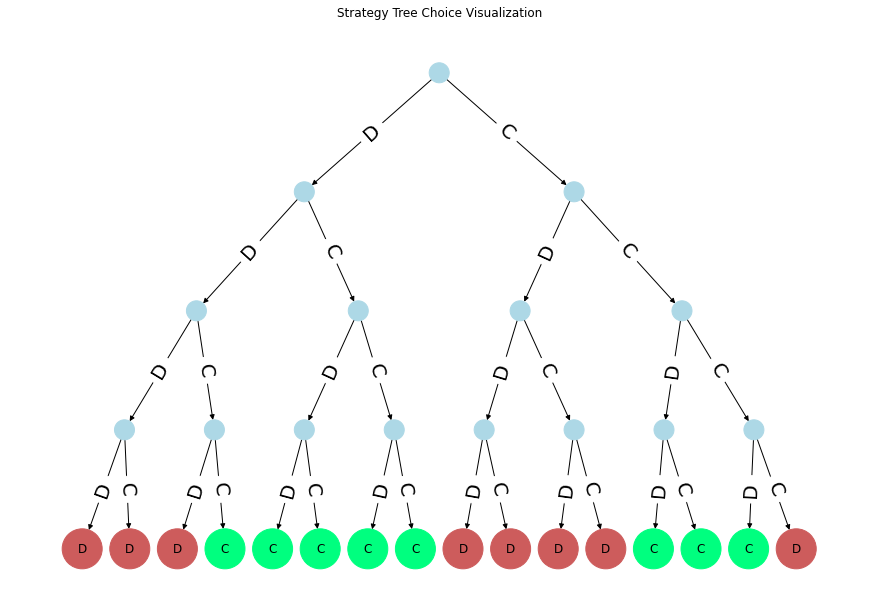

Best Strategy = [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 3.6100000000000003


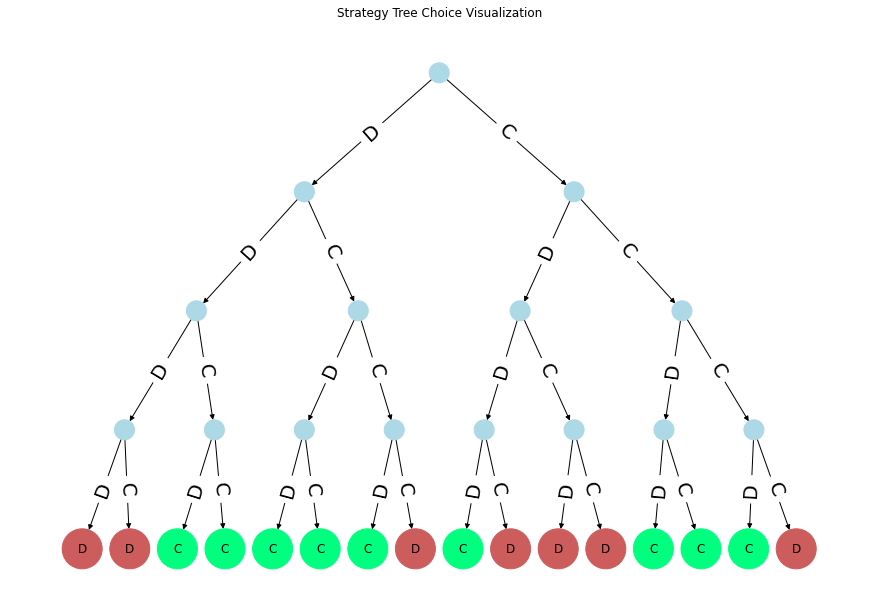

Best Strategy = [1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0] 
Fitness = 3.5799999999999996


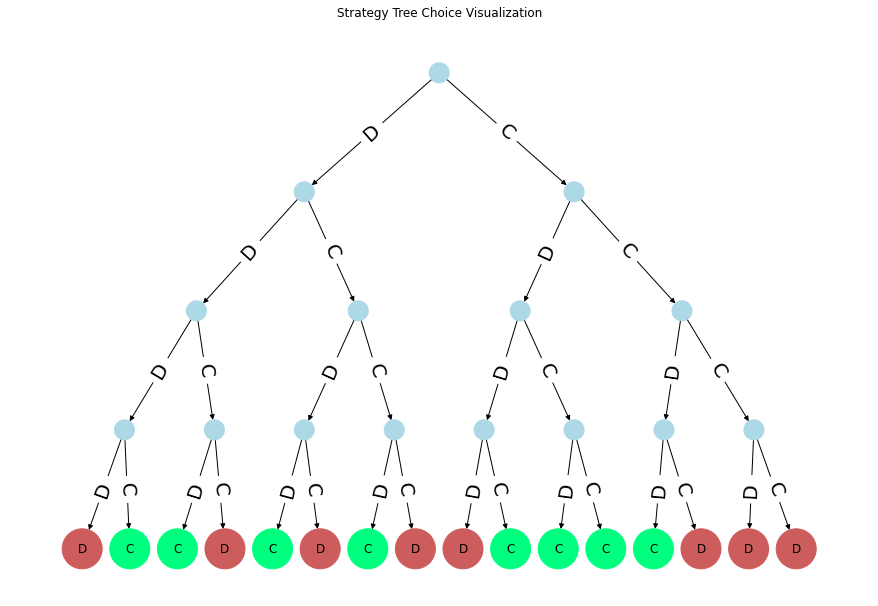

Best Strategy = [1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0] 
Fitness = 3.435


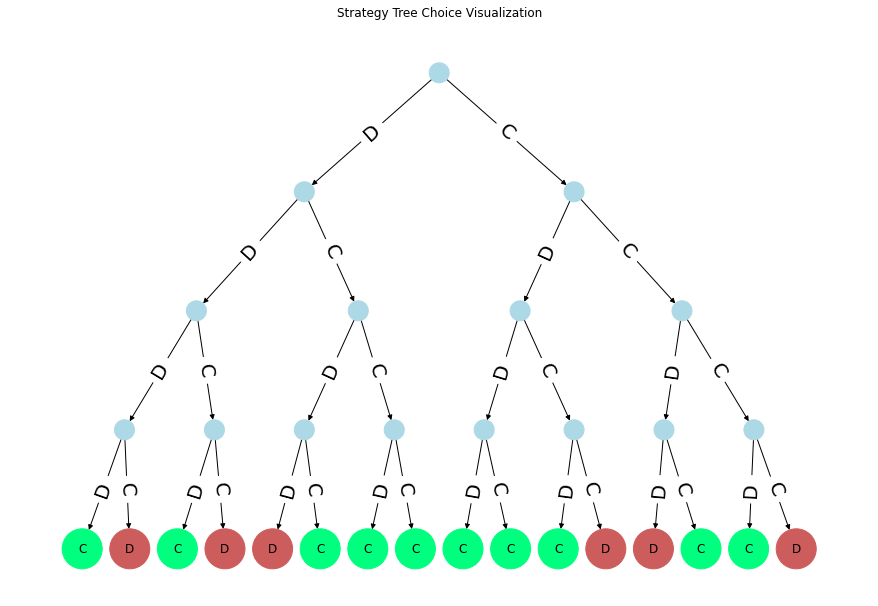

Best Strategy = [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 3.655


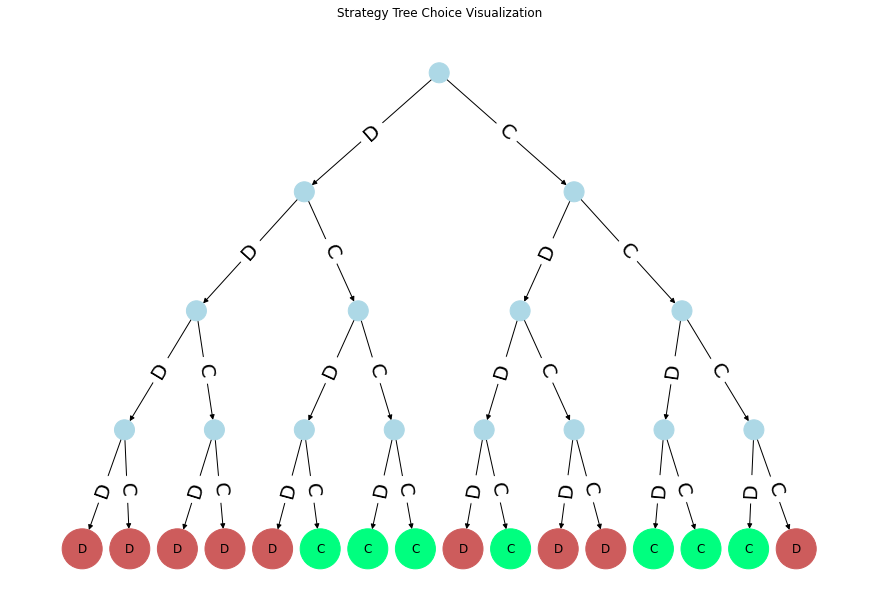

Best Strategy = [0, 0, 1, 1, 1, 1, 0, 1, 0] 
Fitness = 3.675


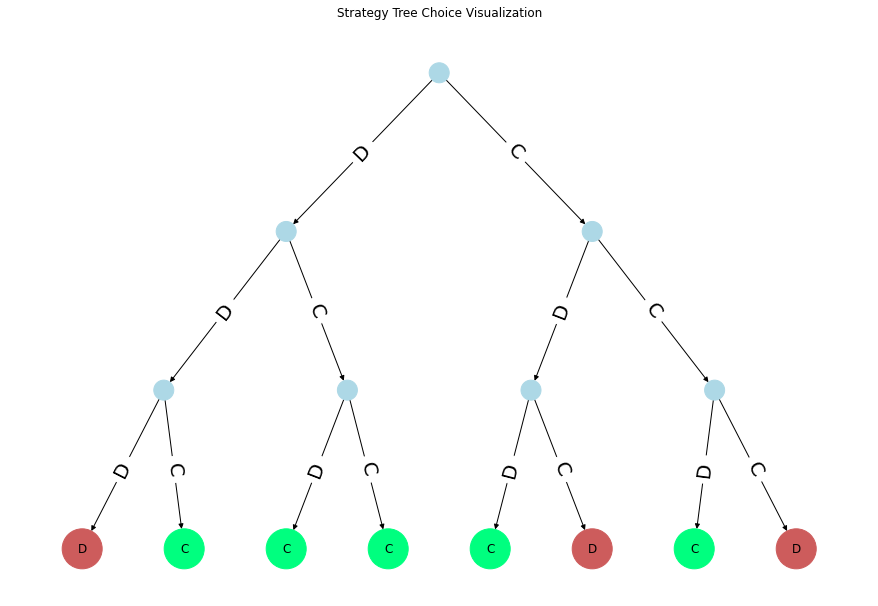

Best Strategy = [1, 0, 0, 0, 0, 0, 1, 0, 0] 
Fitness = 3.65


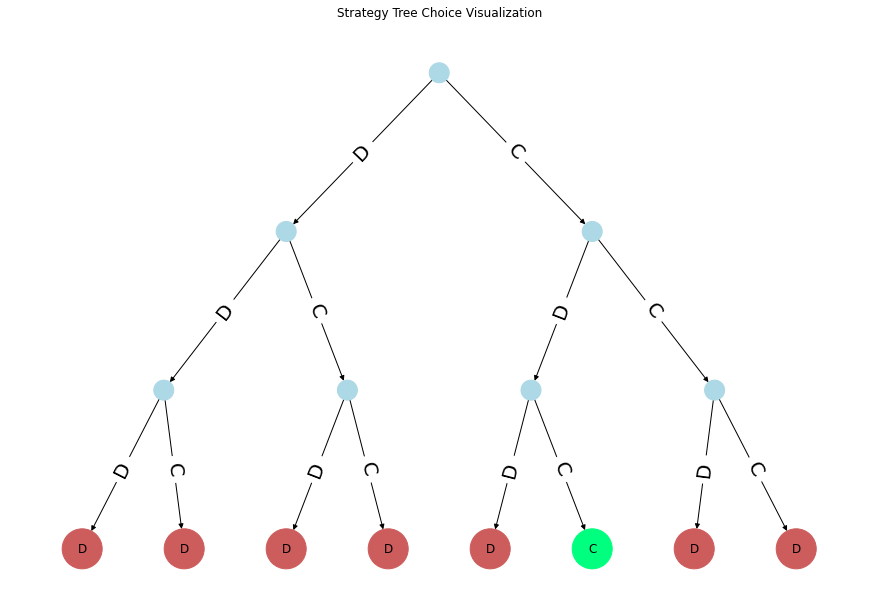

Best Strategy = [0, 0, 0, 0, 1, 0, 1, 0, 0] 
Fitness = 3.405


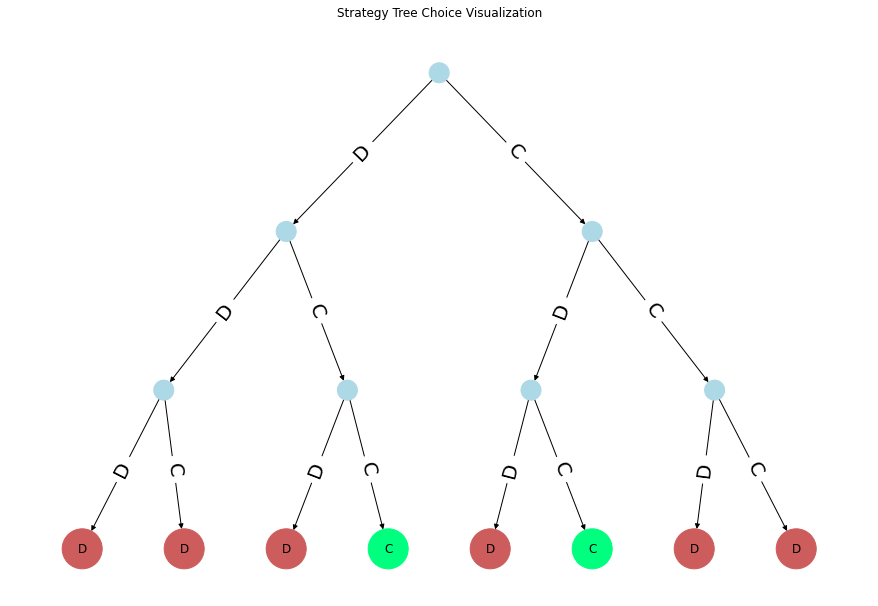

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685


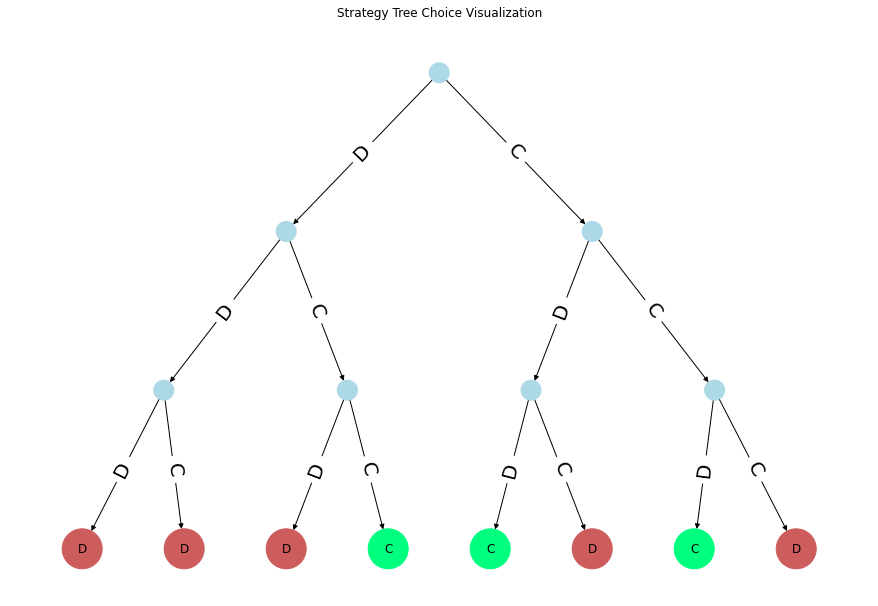

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685


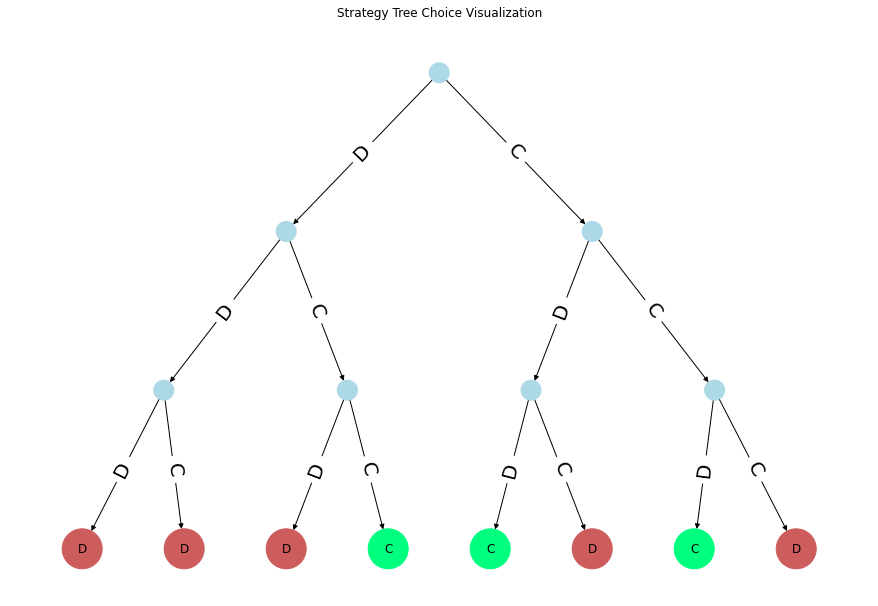

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685


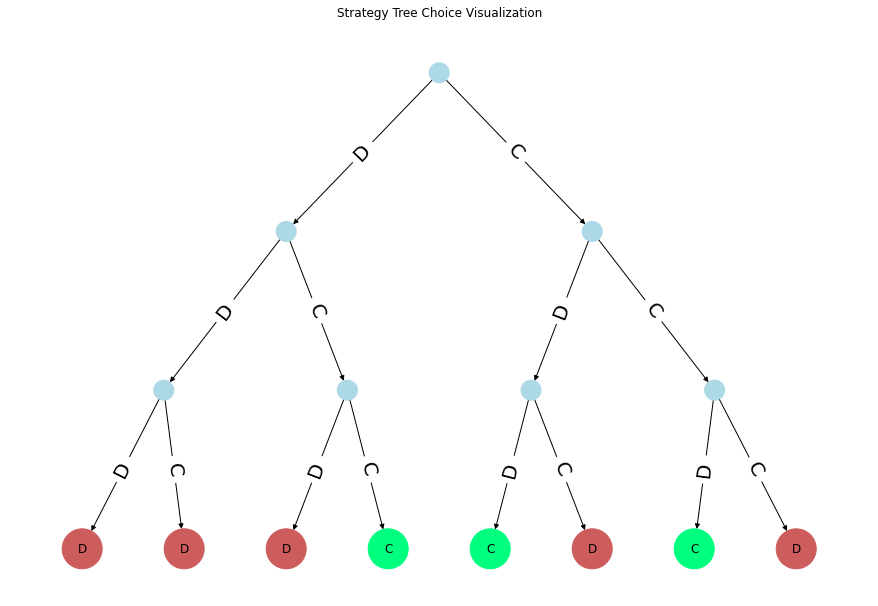

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 3.6399999999999997


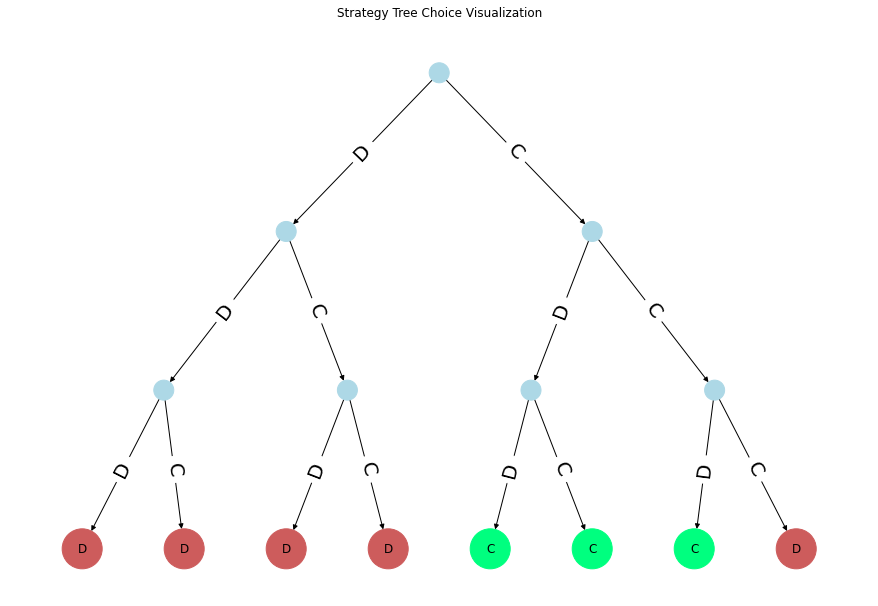

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 1, 0] 
Fitness = 3.675


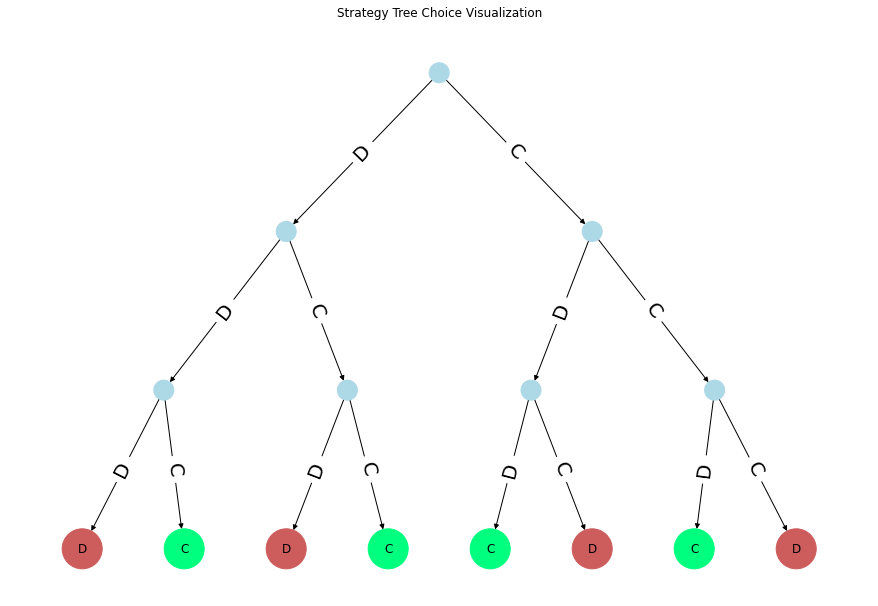

Best Strategy = [0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0] 
Fitness = 3.6149999999999998


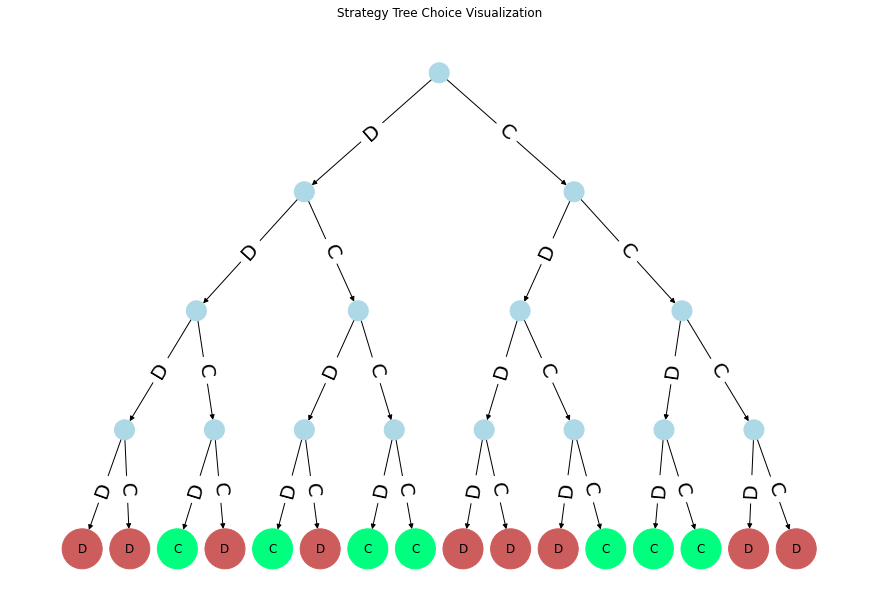

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 3.7049999999999996


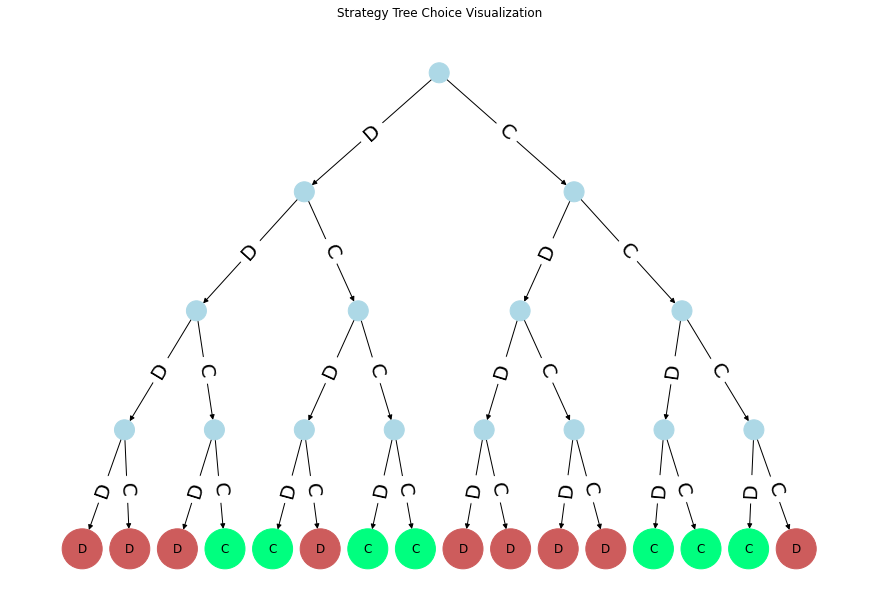

Best Strategy = [0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 3.655


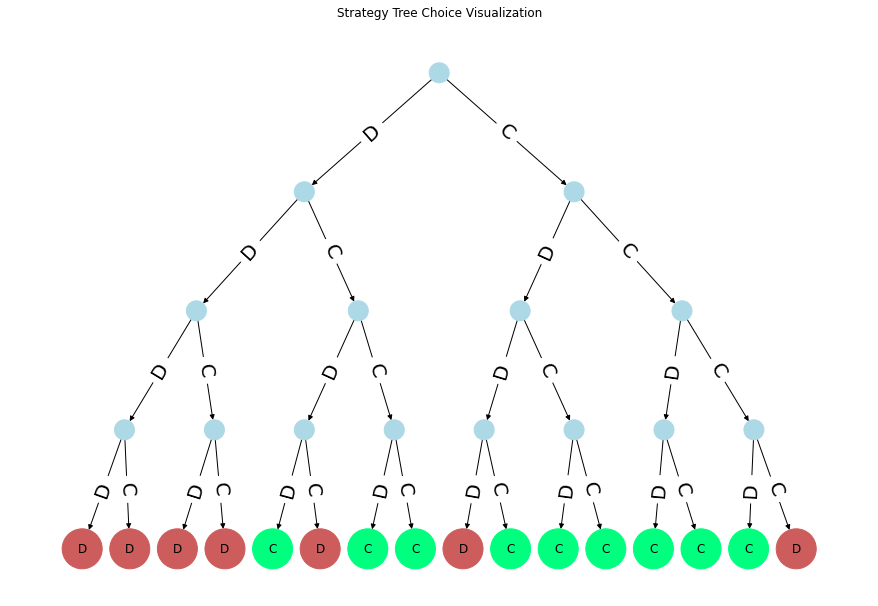

Best Strategy = [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0] 
Fitness = 3.71


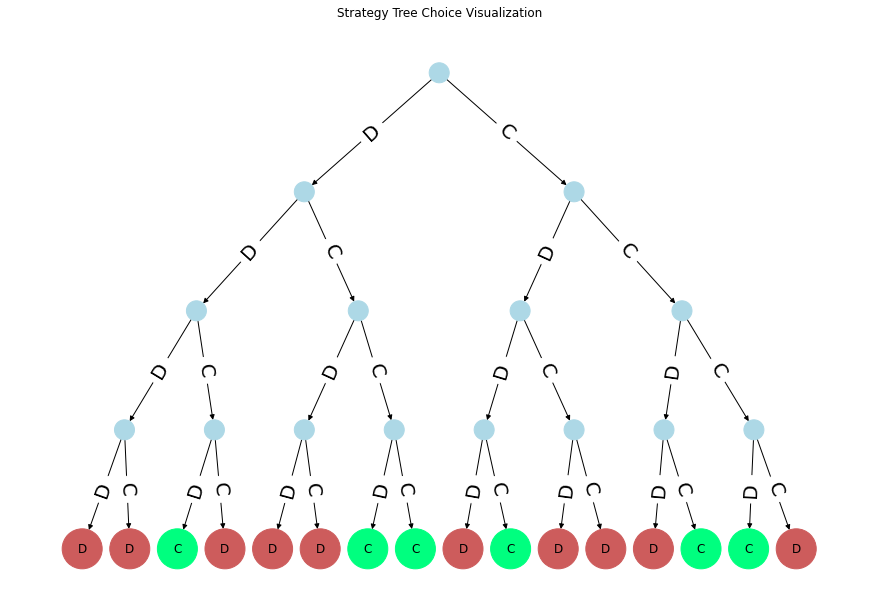

Best Strategy = [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 3.65


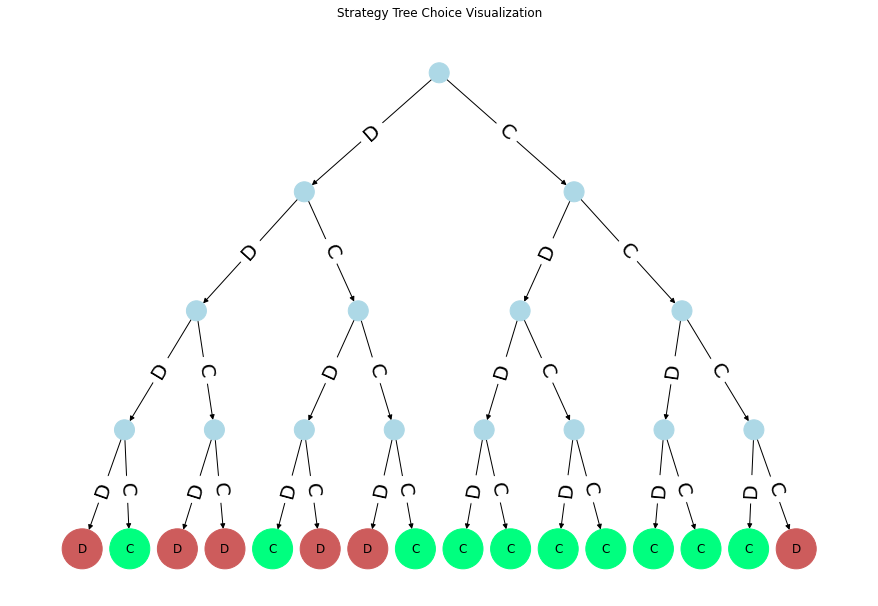

Best Strategy = [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0] 
Fitness = 3.53


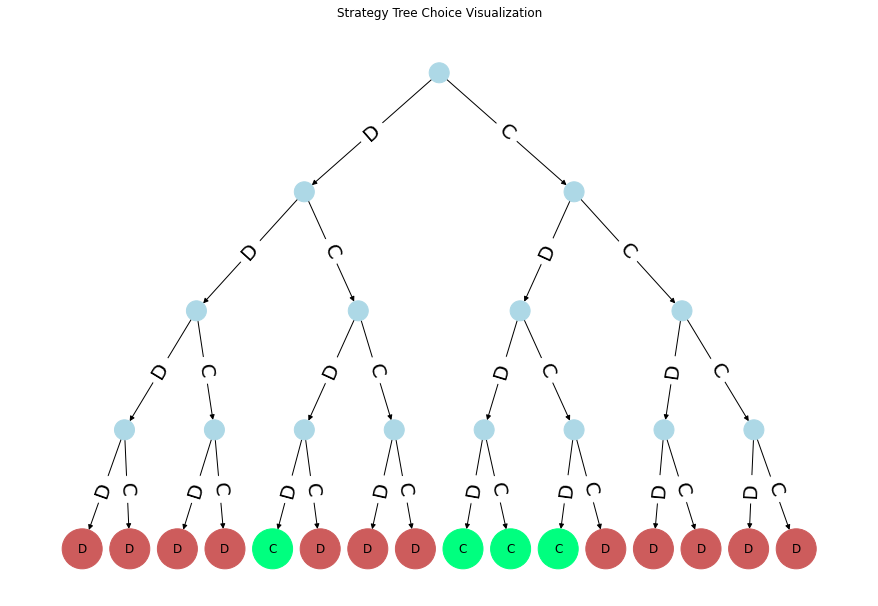

Best Strategy = [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0] 
Fitness = 3.6450000000000005


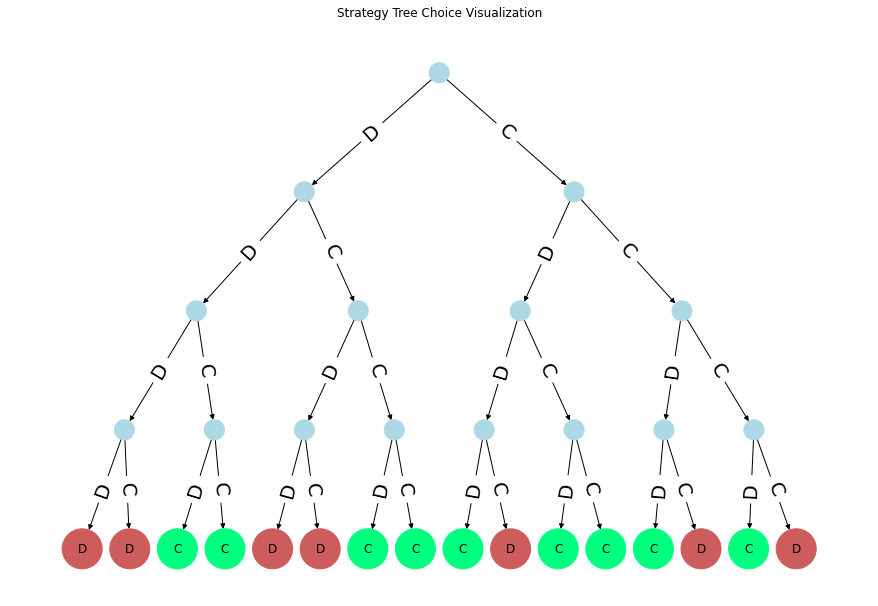

Best Strategy = [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 3.655


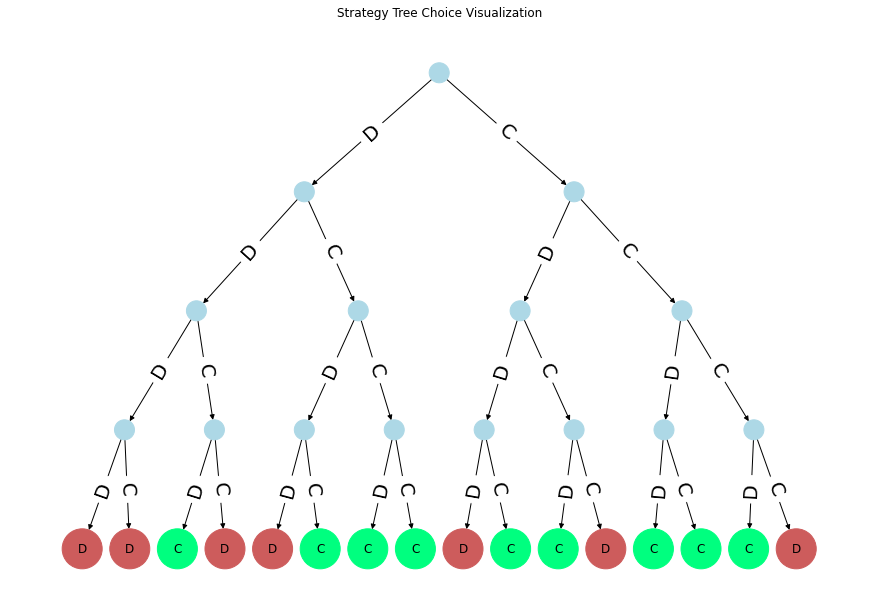

In [236]:
for best_result in results_c:
    best_strategy = best_result['strategy']
    print("Best Strategy =", best_strategy, "\nFitness =", fitness_c(best_strategy, 40))
    binary_tree_plot(best_strategy)

In [220]:
"""
DEFECTIVE POPULATION

GRID SEARCH ALL HYPERPARAMETER COMBINATIONS 
""" 

results_d = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness_d)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness_d(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results_d.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [1, 0, 0, 1, 1, 1, 0, 1, 0] 
Fitness = 2.07 
Time Taken =  5 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [0, 0, 1, 0, 1, 1, 0, 0, 0] 
Fitness = 1.97 
Time Taken =  4 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.125 
Time Taken =  4 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function inv

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.0100000000000002 
Time Taken =  10 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 2.12 
Time Taken =  16 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 2.1 
Time Taken =  27 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 

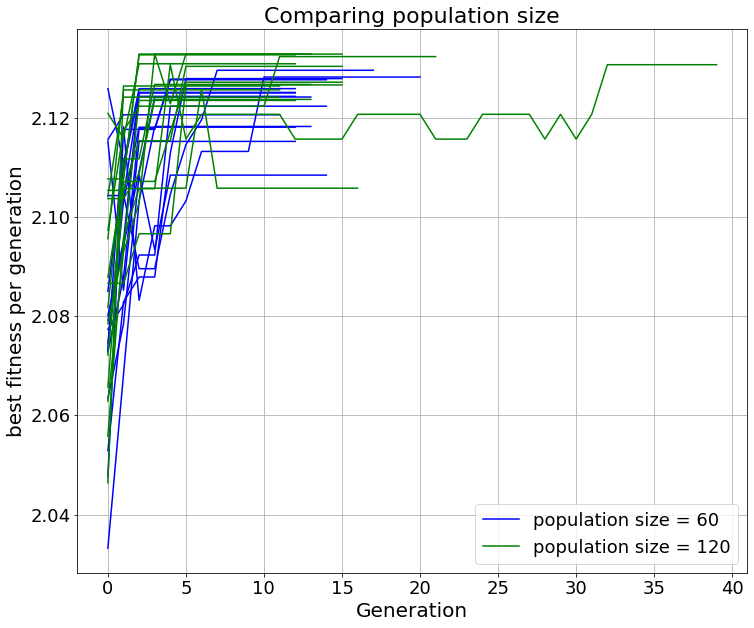

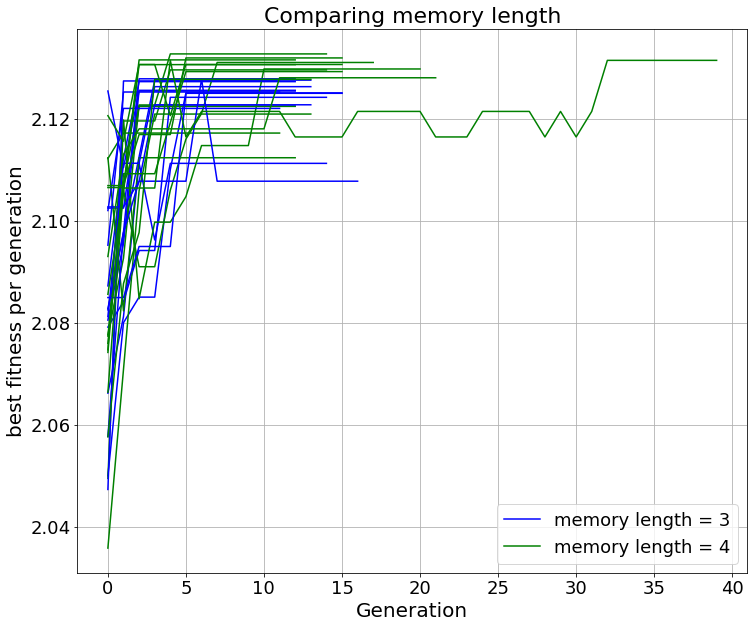

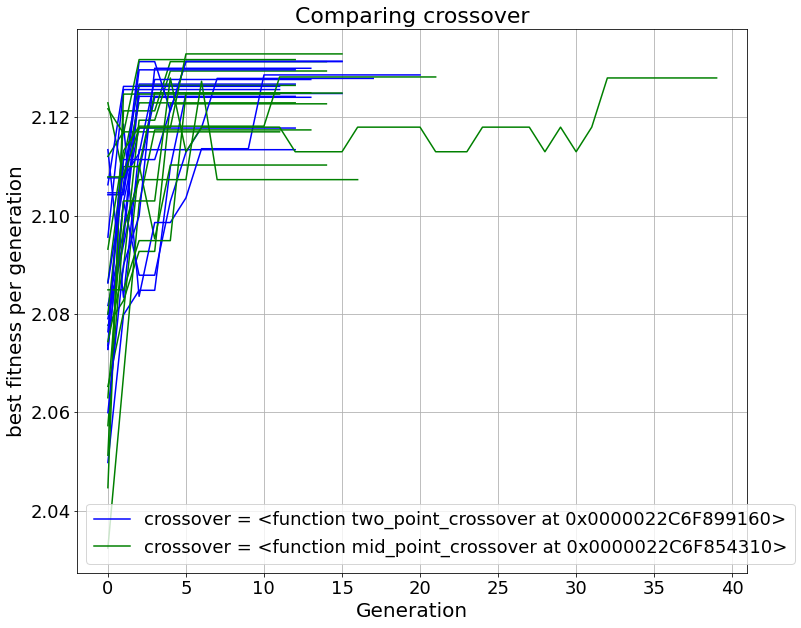

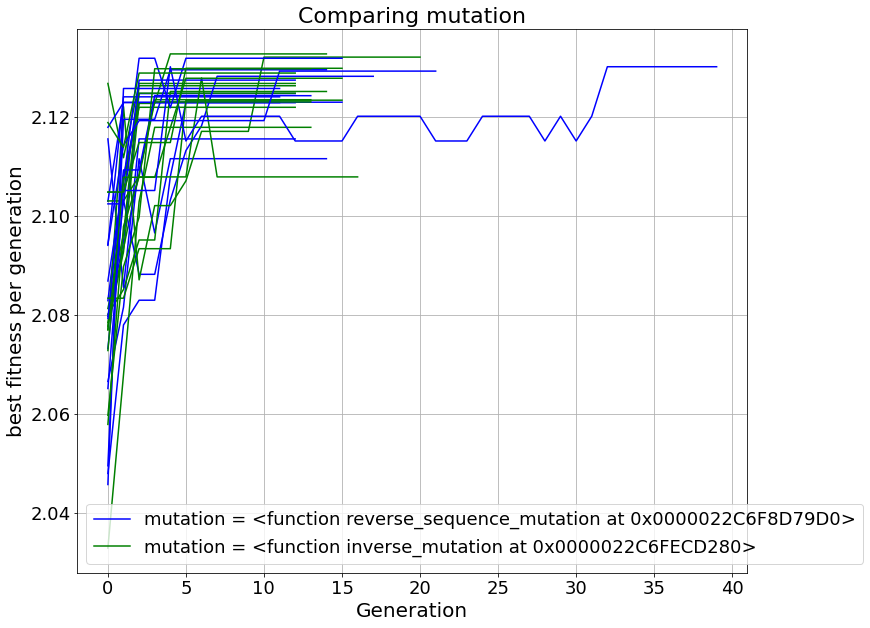

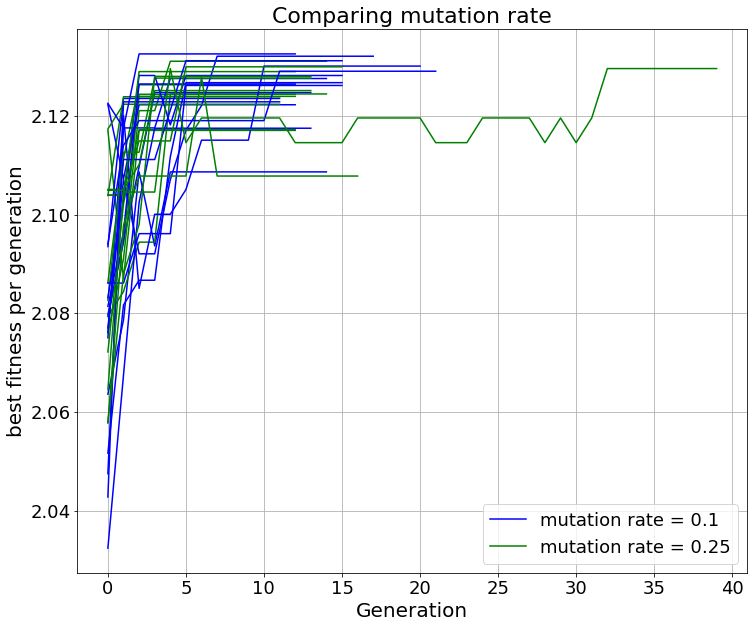

In [221]:
"""
Plotting best population fitness over generations for defective population
""" 

plot(results_d, 'population size', 'best fitness per generation', 0.003)
plot(results_d, 'memory length', 'best fitness per generation', 0.003)
plot(results_d, 'crossover', 'best fitness per generation', 0.003)
plot(results_d, 'mutation', 'best fitness per generation', 0.003)
plot(results_d, 'mutation rate', 'best fitness per generation', 0.003)

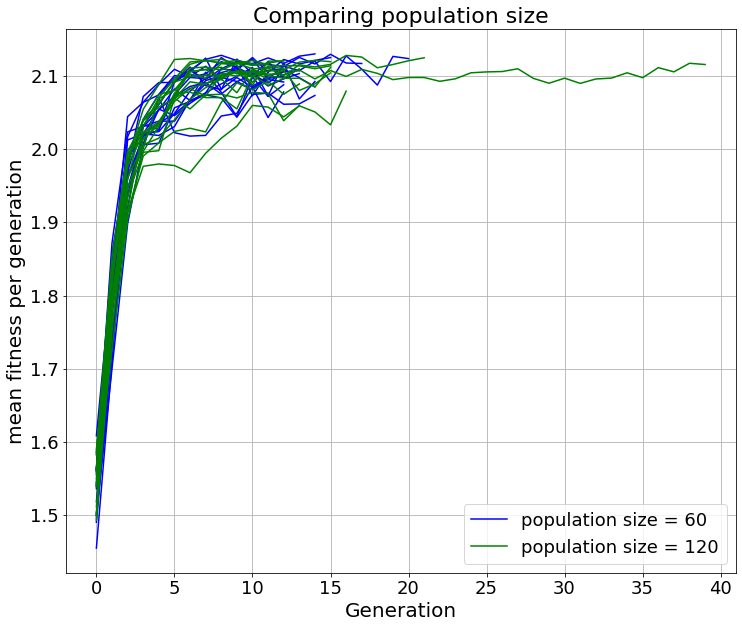

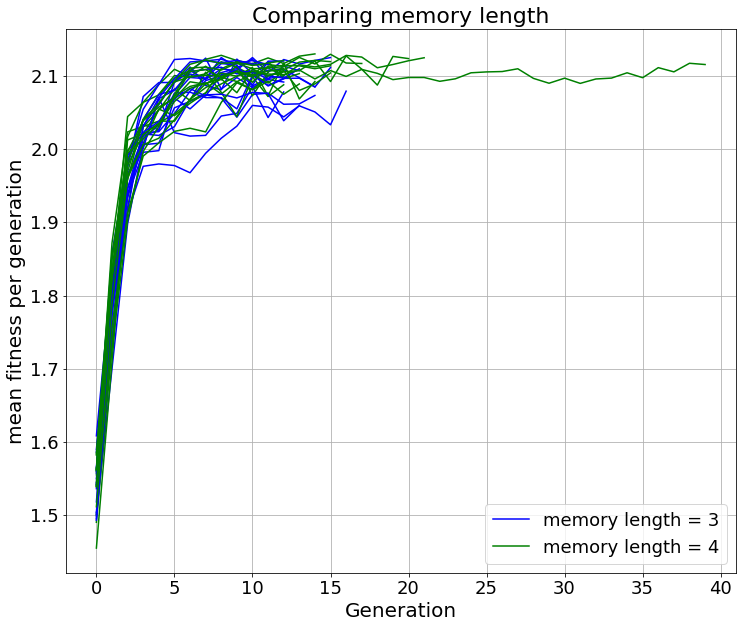

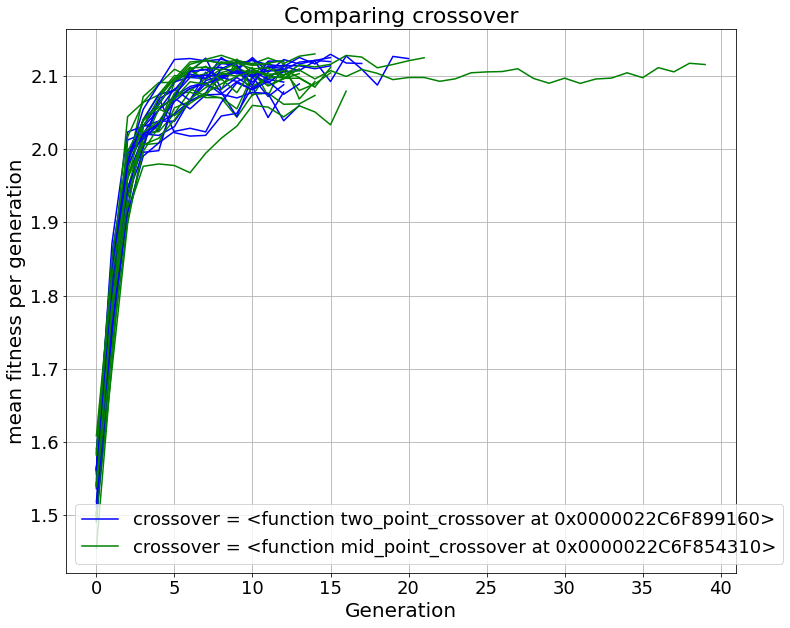

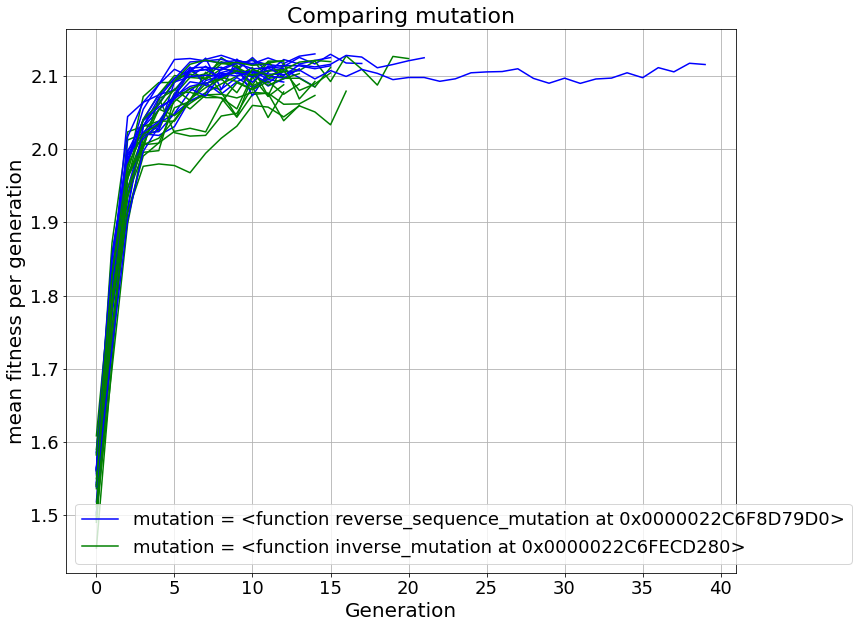

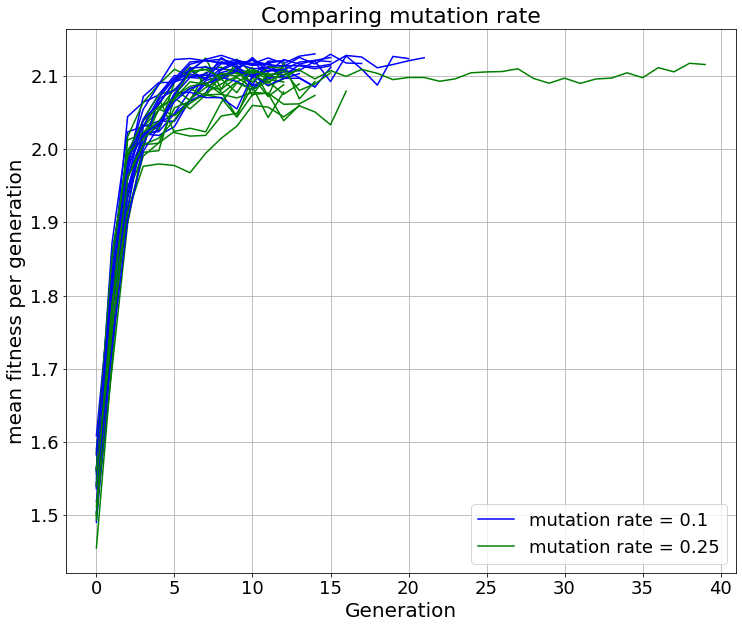

In [222]:
"""
Plotting mean population fitness over generations for defective population
""" 

plot(results_d, 'population size', 'mean fitness per generation', 0)
plot(results_d, 'memory length', 'mean fitness per generation', 0)
plot(results_d, 'crossover', 'mean fitness per generation', 0)
plot(results_d, 'mutation', 'mean fitness per generation', 0)
plot(results_d, 'mutation rate', 'mean fitness per generation', 0)

Best Strategy = [1, 0, 0, 1, 1, 1, 0, 1, 0] 
Fitness = 2.07


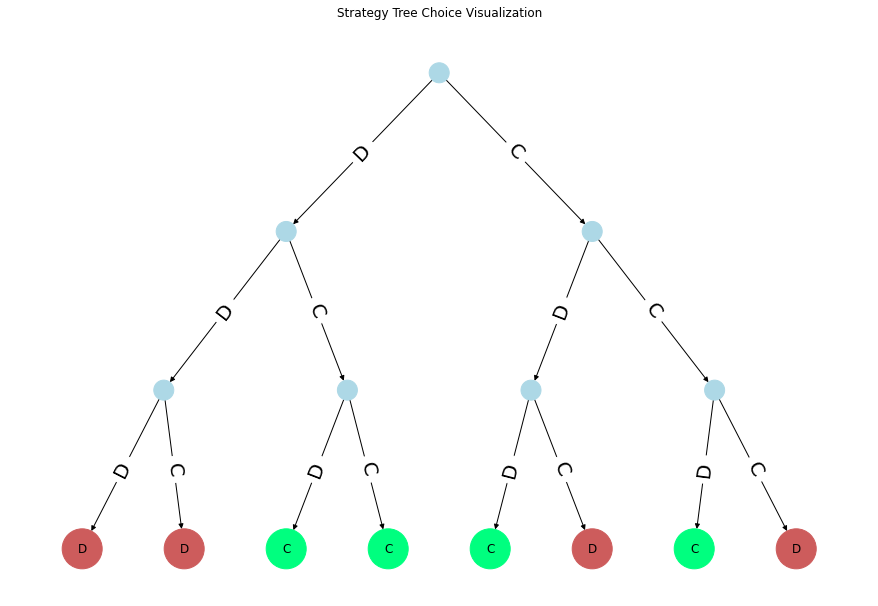

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 0, 0] 
Fitness = 1.97


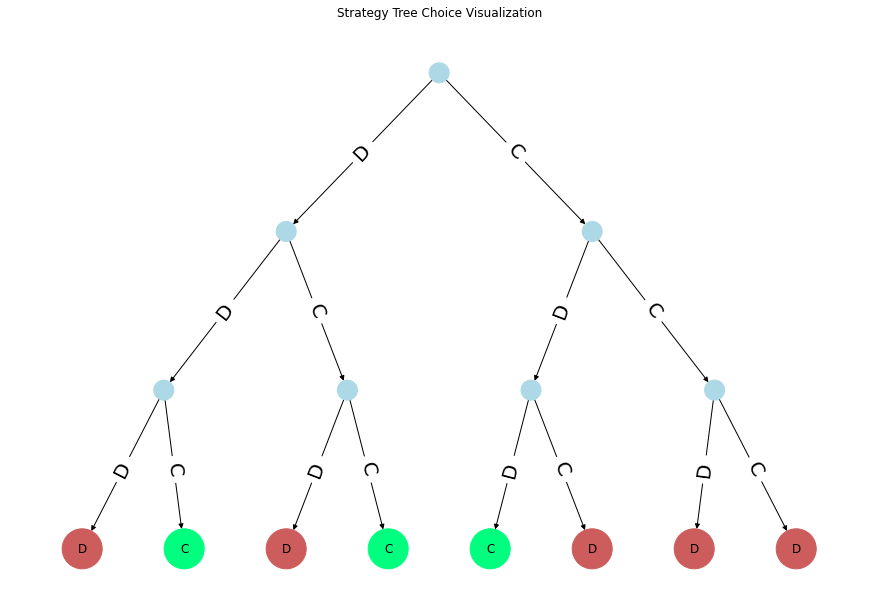

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.125


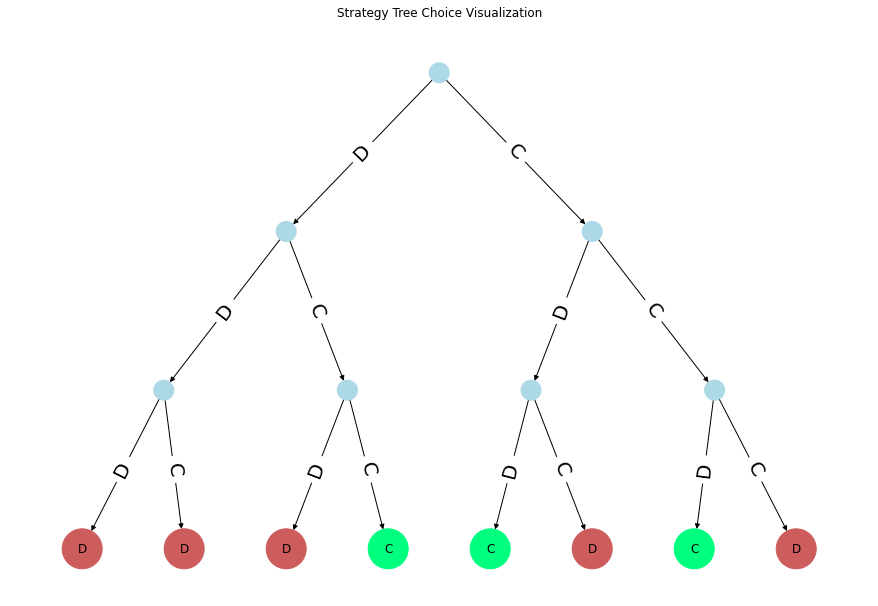

Best Strategy = [1, 0, 1, 0, 1, 1, 0, 0, 0] 
Fitness = 1.9600000000000002


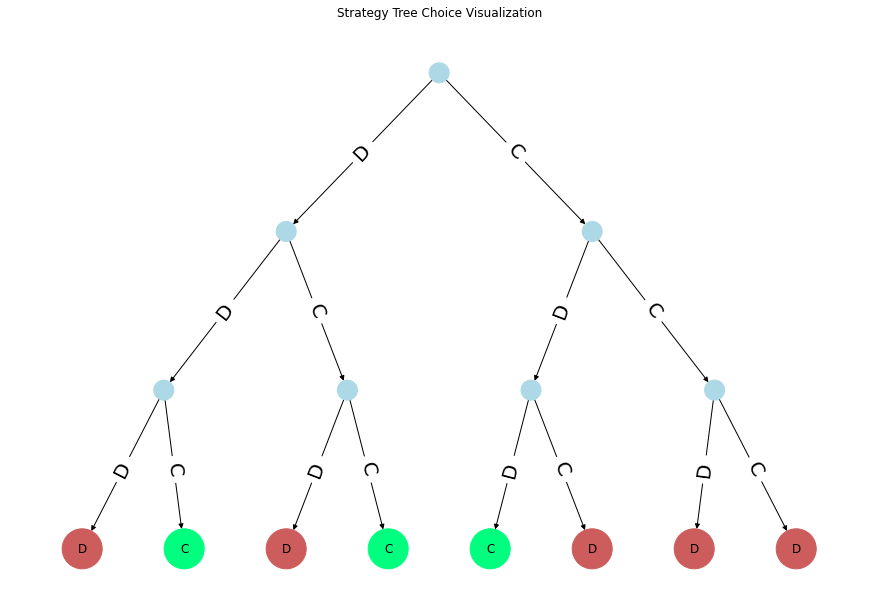

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 1, 0] 
Fitness = 2.0949999999999998


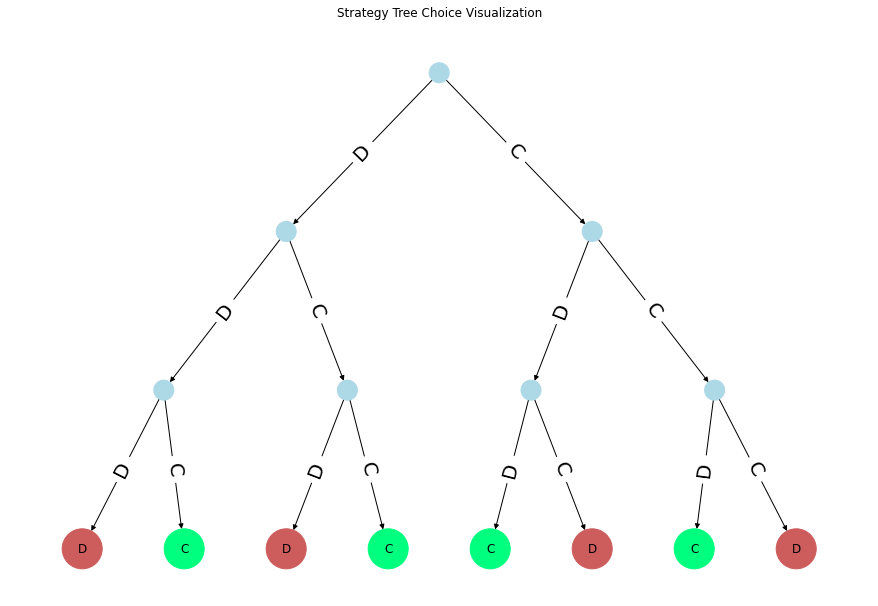

Best Strategy = [1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 2.035


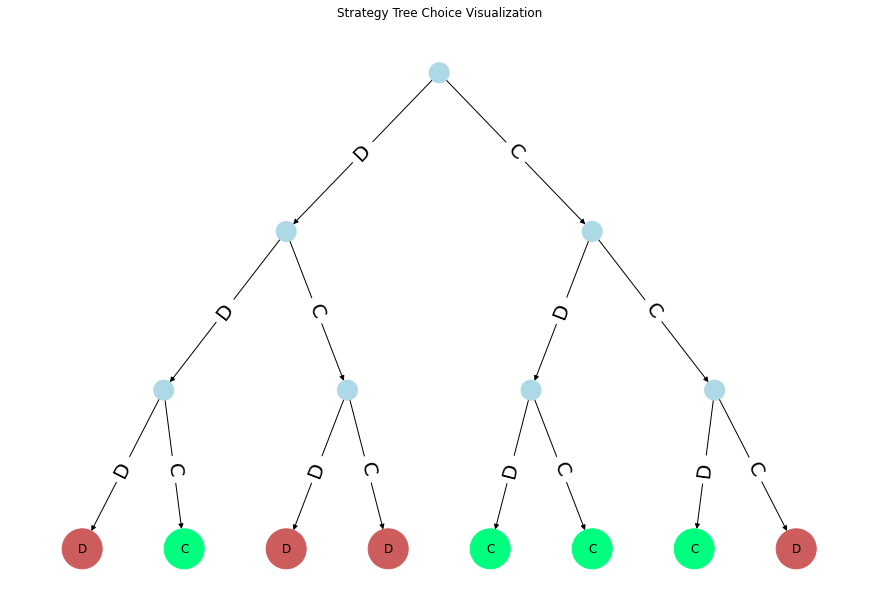

Best Strategy = [0, 1, 0, 1, 0, 0, 0, 0, 0] 
Fitness = 1.4300000000000002


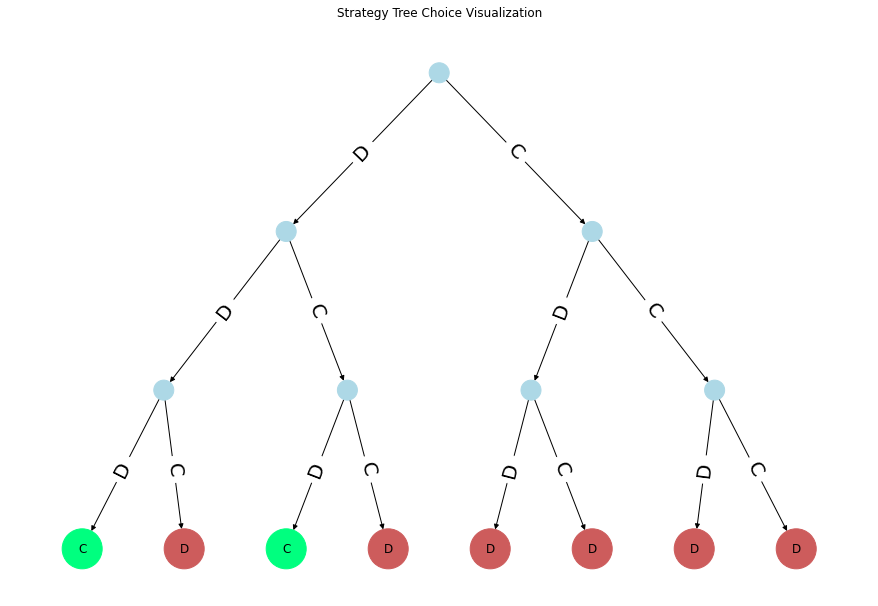

Best Strategy = [0, 0, 1, 0, 1, 1, 1, 1, 0] 
Fitness = 2.055


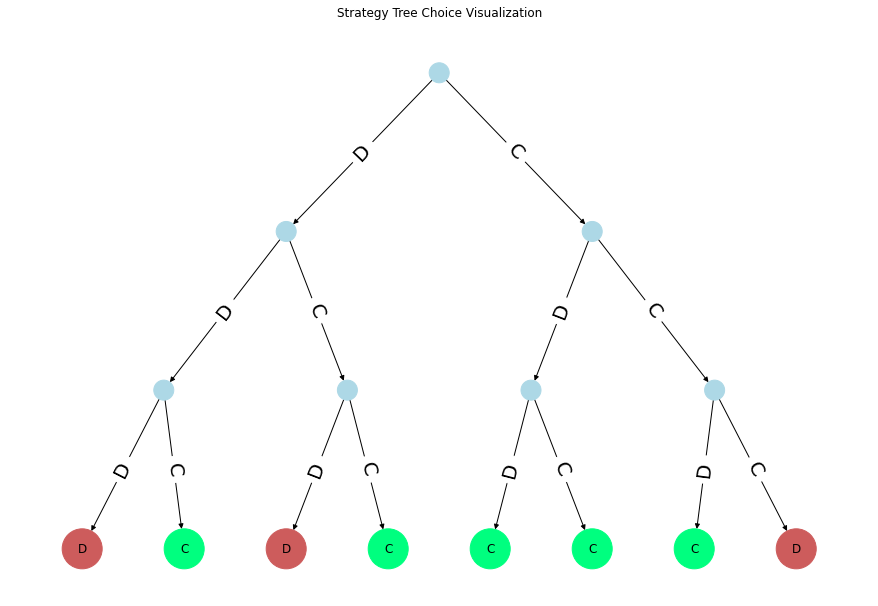

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 2.1149999999999998


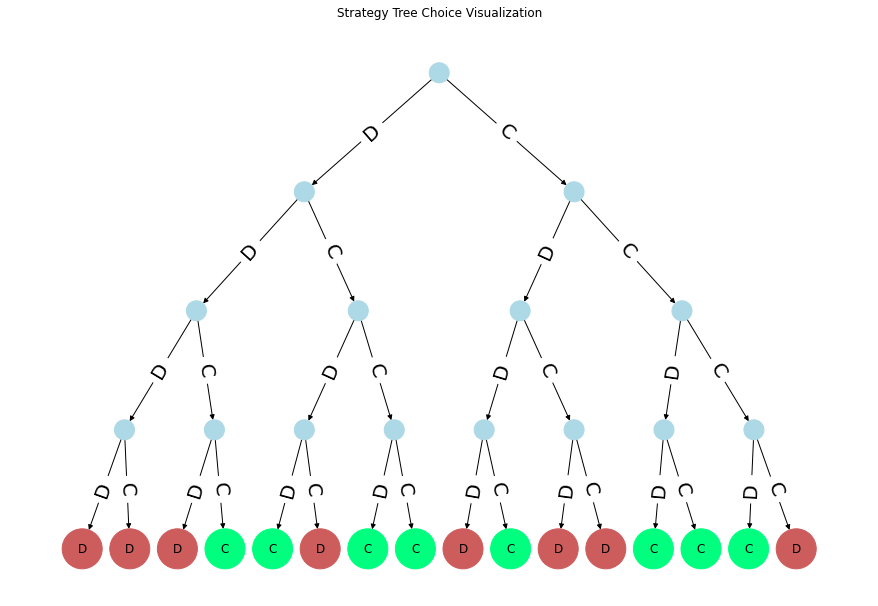

Best Strategy = [0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0] 
Fitness = 1.9600000000000002


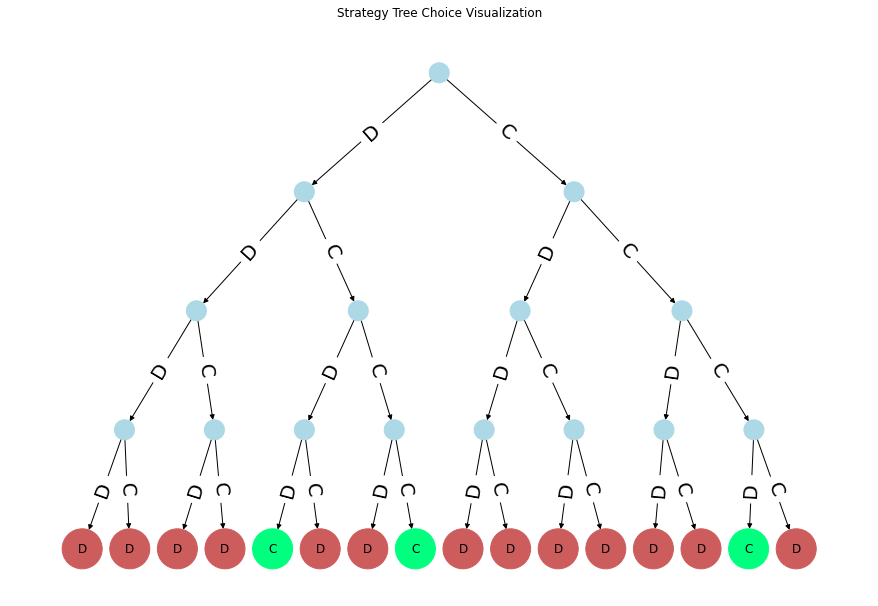

Best Strategy = [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 2.1


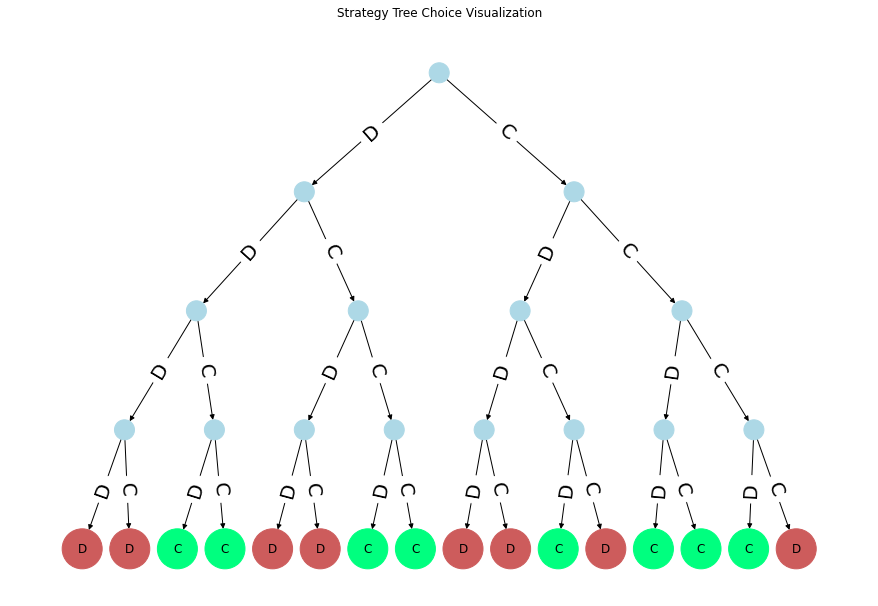

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0] 
Fitness = 2.12


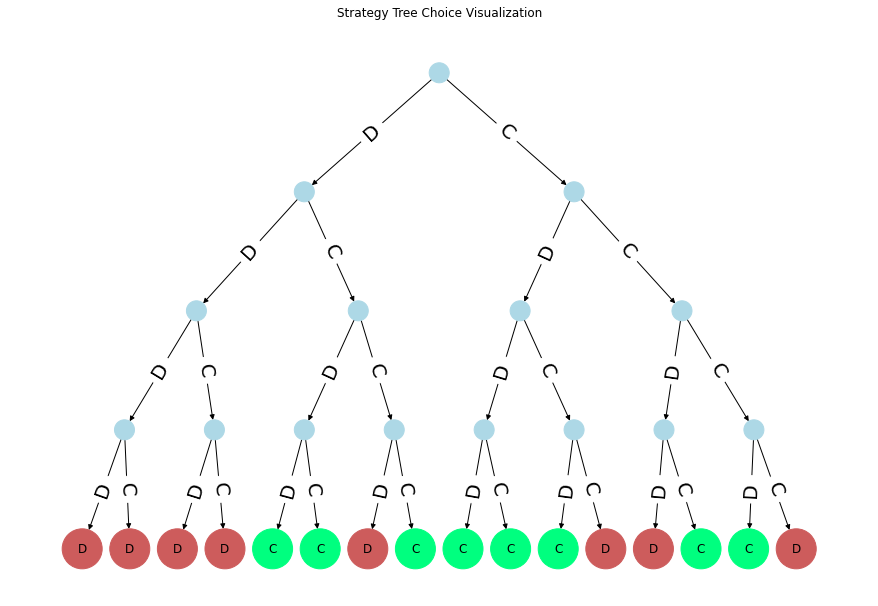

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 2.12


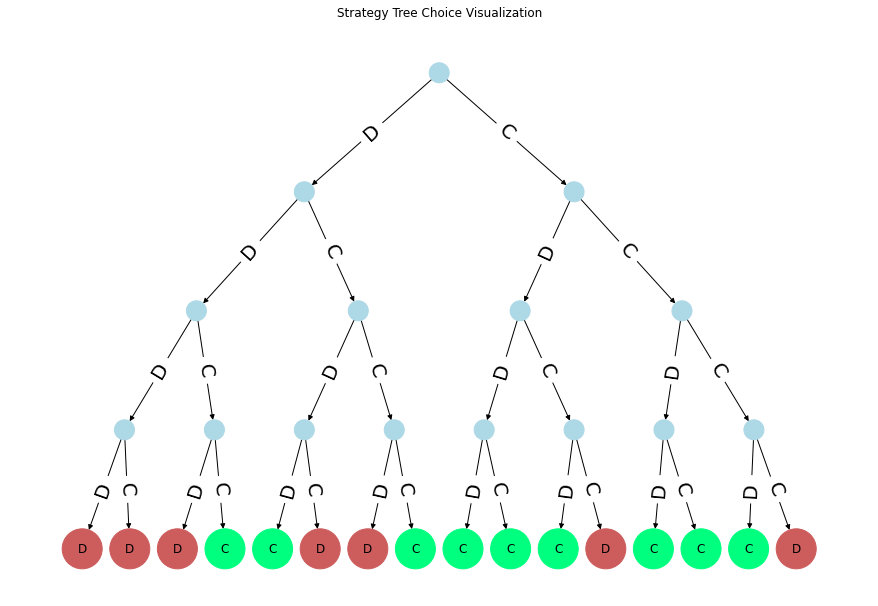

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0] 
Fitness = 2.075


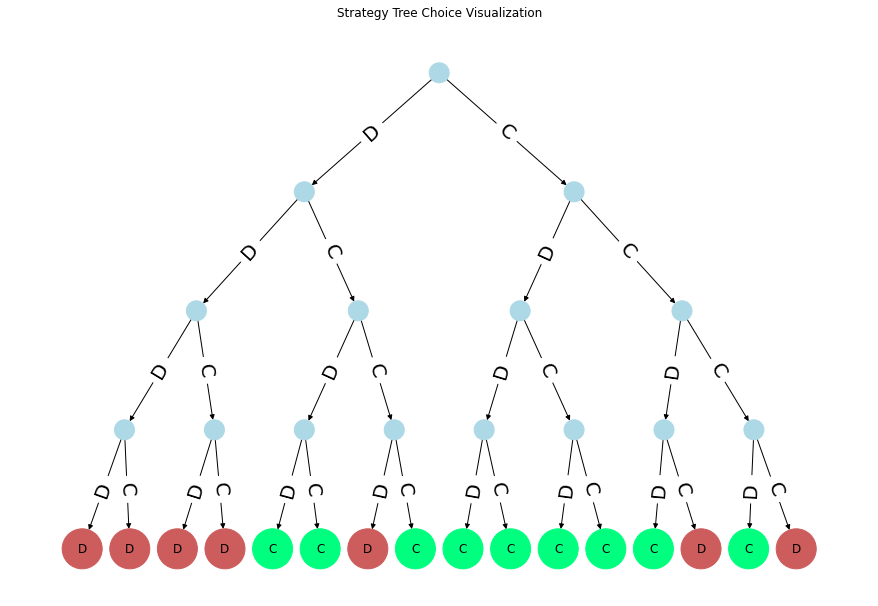

Best Strategy = [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0] 
Fitness = 2.0149999999999997


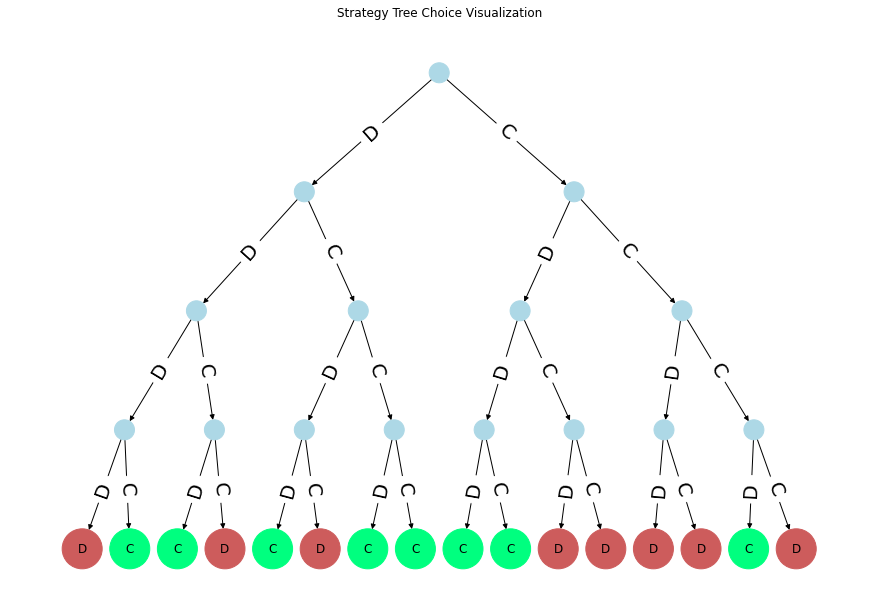

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 2.075


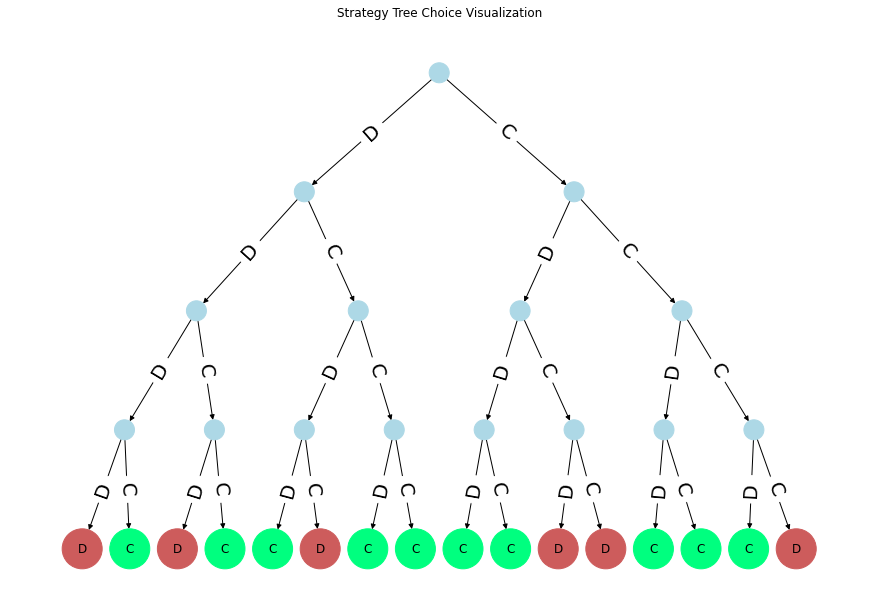

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 0, 0] 
Fitness = 1.97


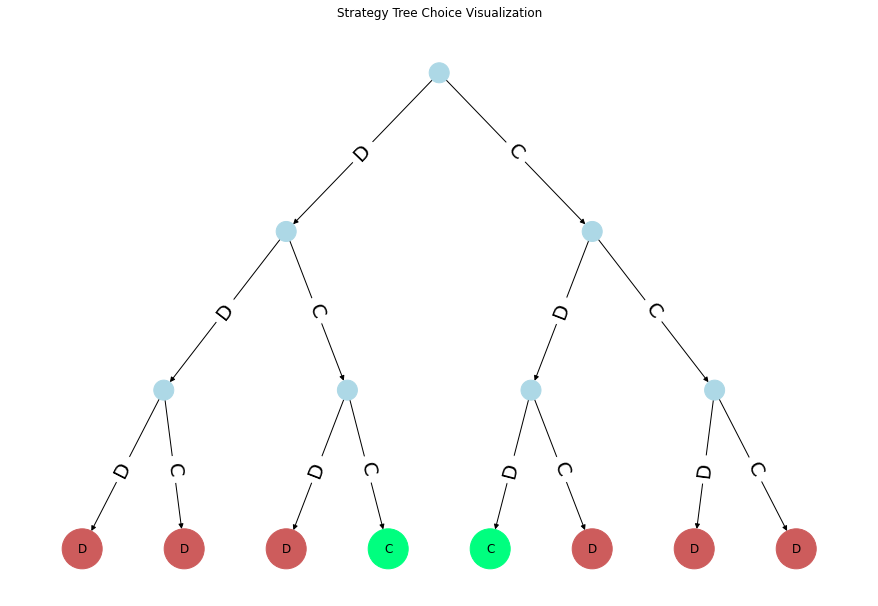

Best Strategy = [0, 0, 1, 0, 0, 1, 0, 1, 0] 
Fitness = 1.98


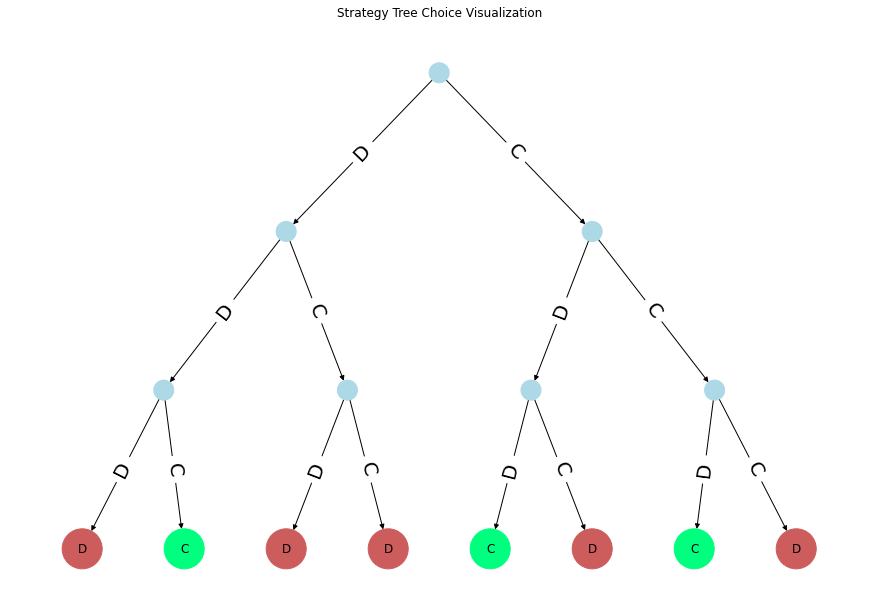

Best Strategy = [0, 0, 1, 0, 1, 0, 1, 1, 0] 
Fitness = 2.05


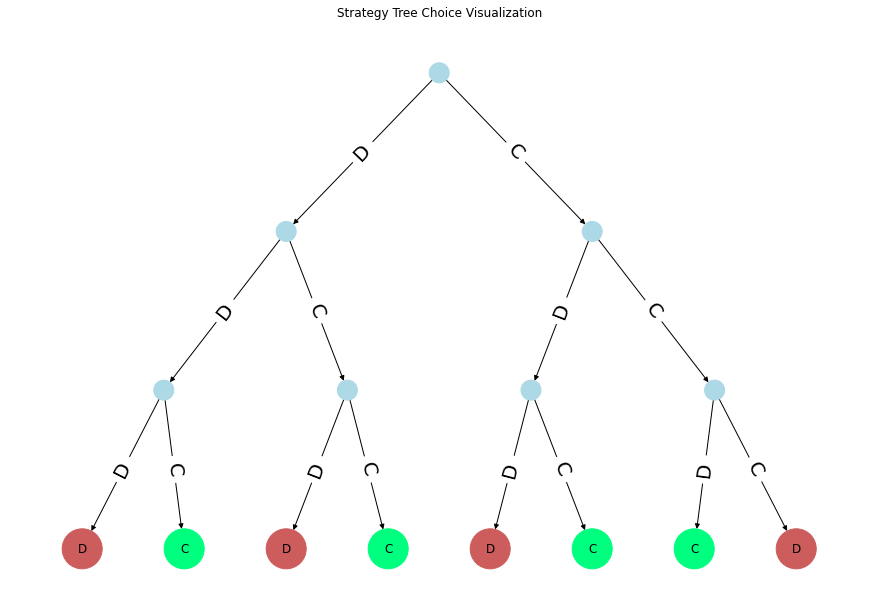

Best Strategy = [1, 0, 0, 1, 1, 1, 0, 1, 0] 
Fitness = 2.07


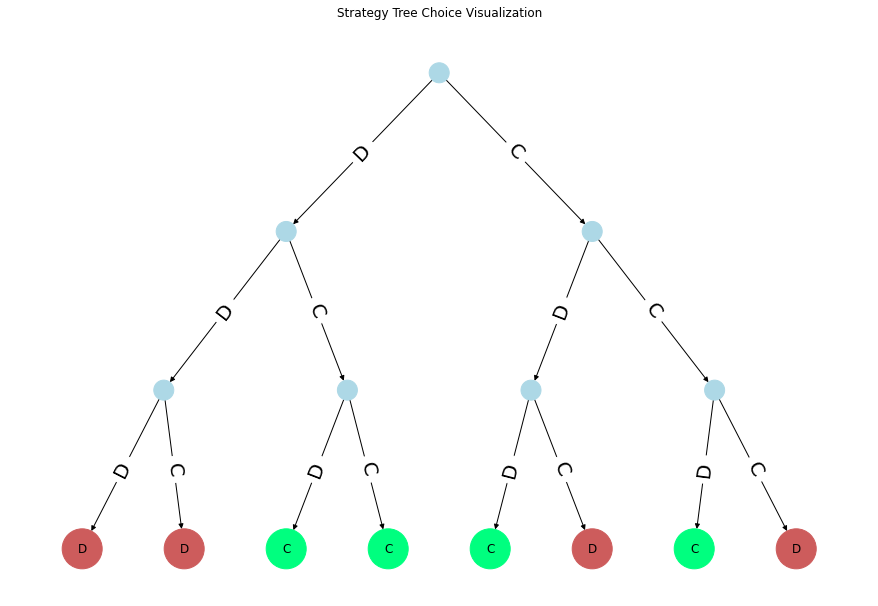

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.125


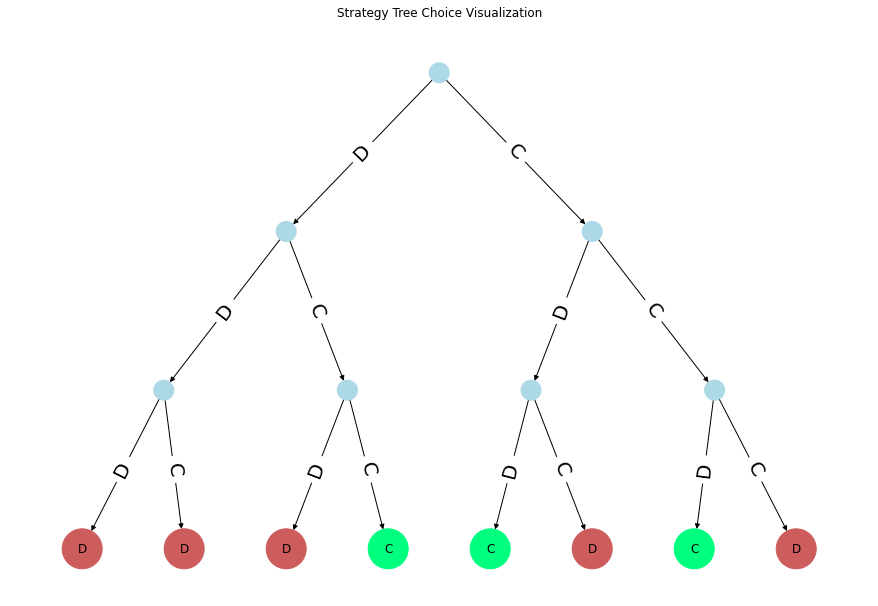

Best Strategy = [0, 0, 0, 1, 1, 1, 1, 1, 0] 
Fitness = 2.08


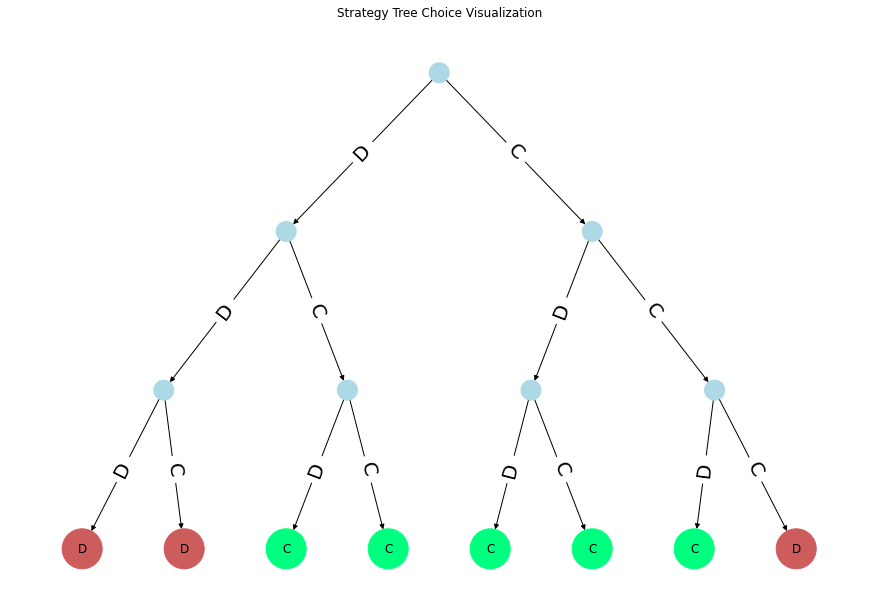

Best Strategy = [1, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.085


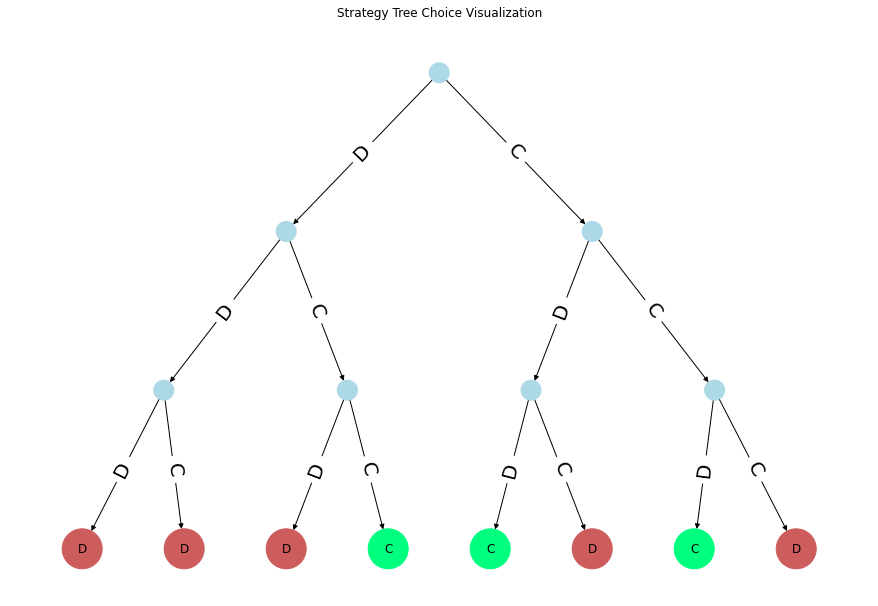

Best Strategy = [1, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 2.07


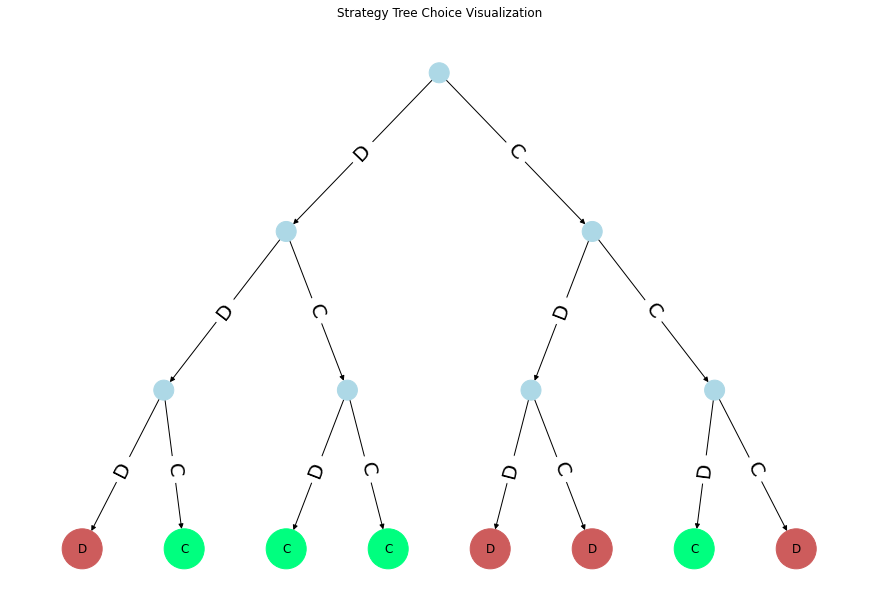

Best Strategy = [1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0] 
Fitness = 2.02


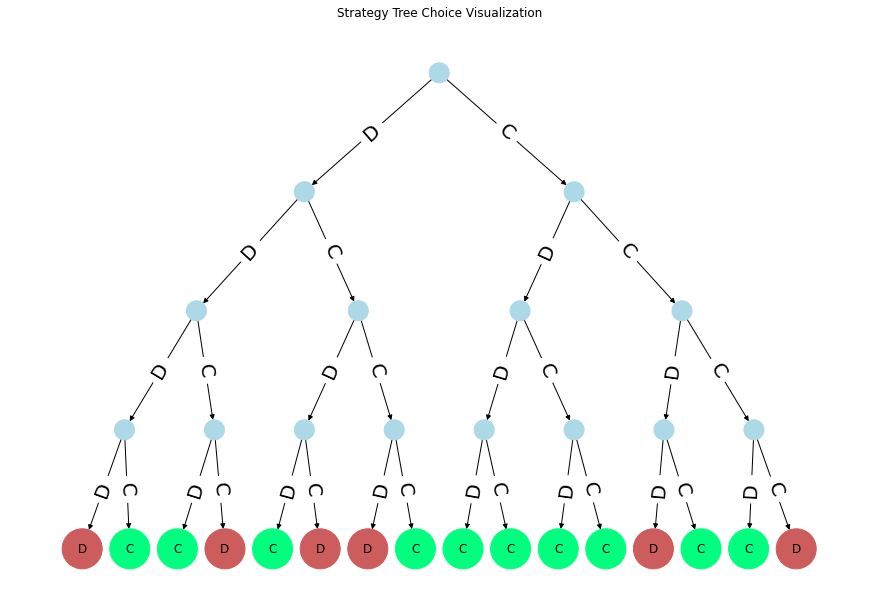

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 2.13


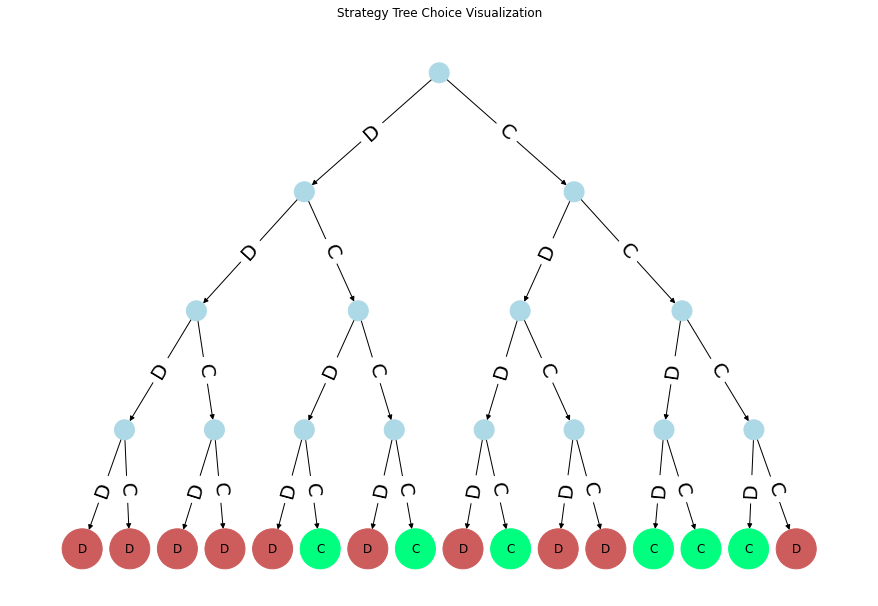

Best Strategy = [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 2.1


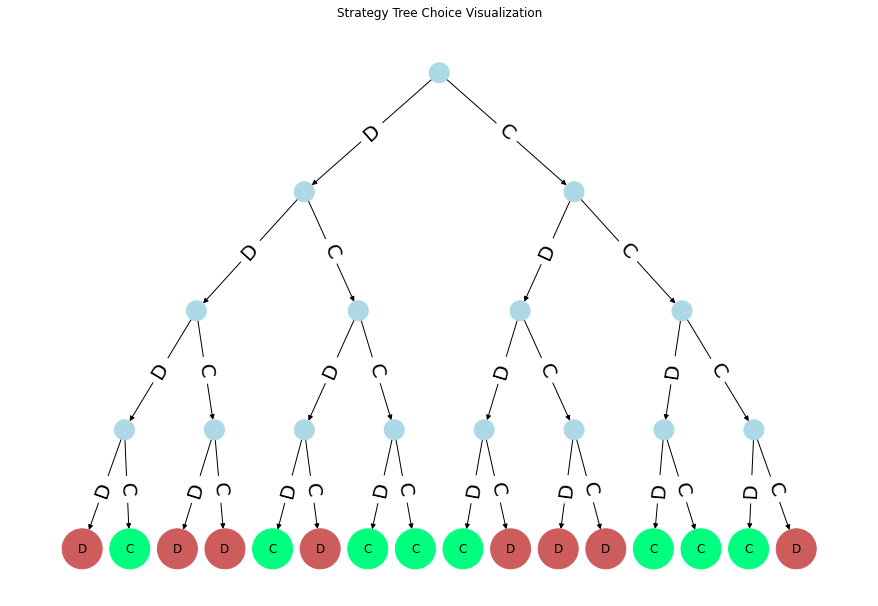

Best Strategy = [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.0100000000000002


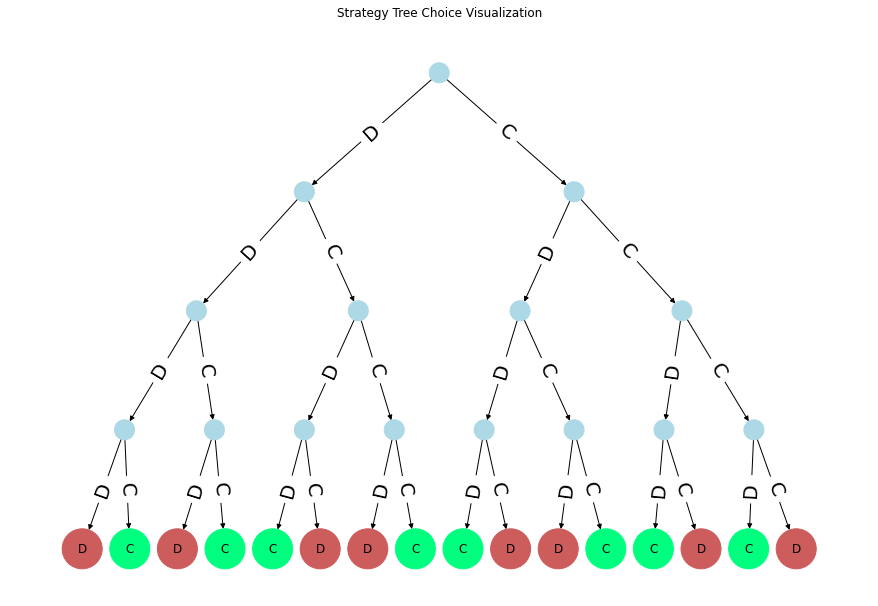

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 2.12


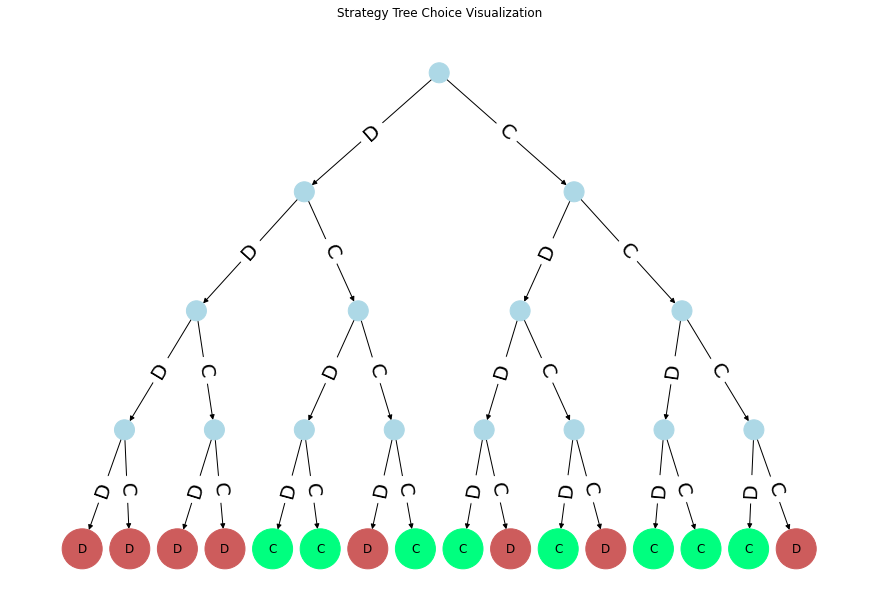

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 2.1


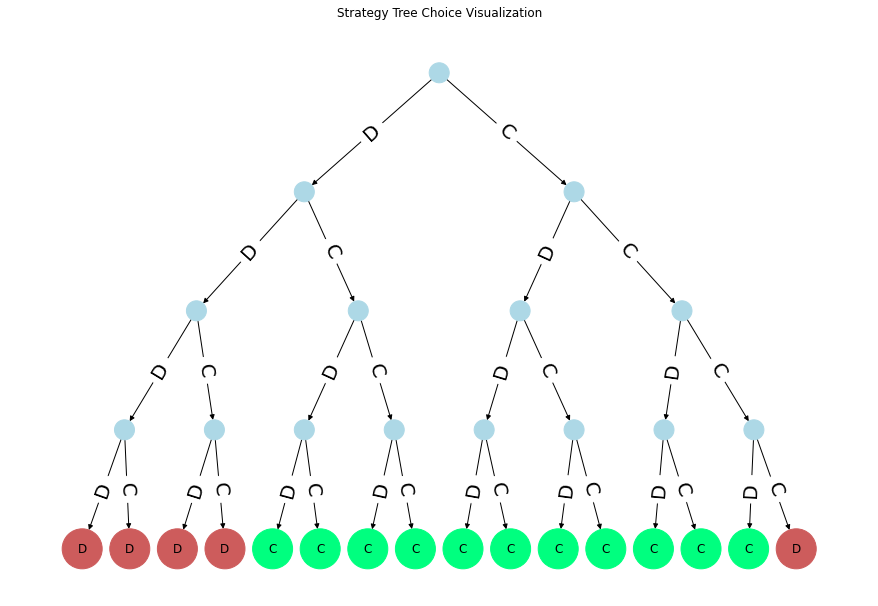

Best Strategy = [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 2.1149999999999998


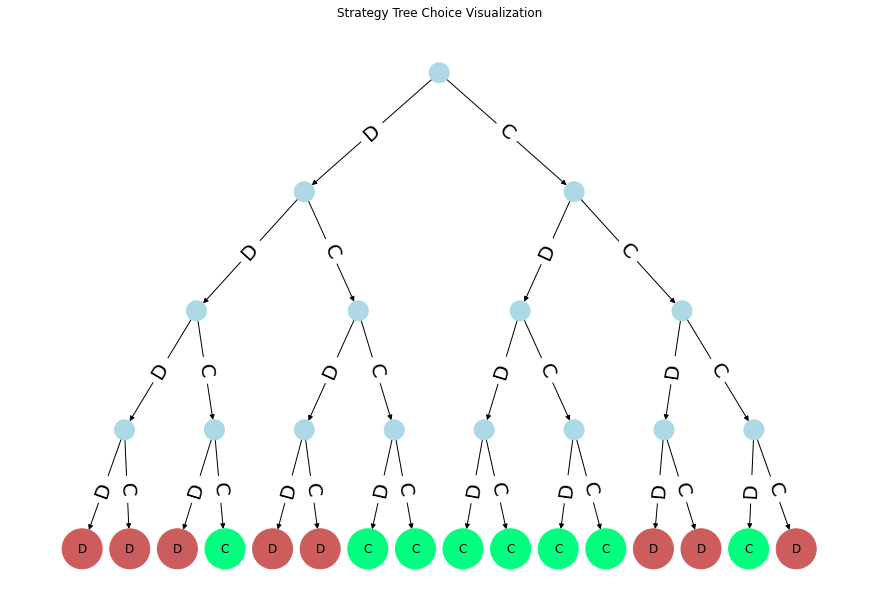

Best Strategy = [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0] 
Fitness = 2.055


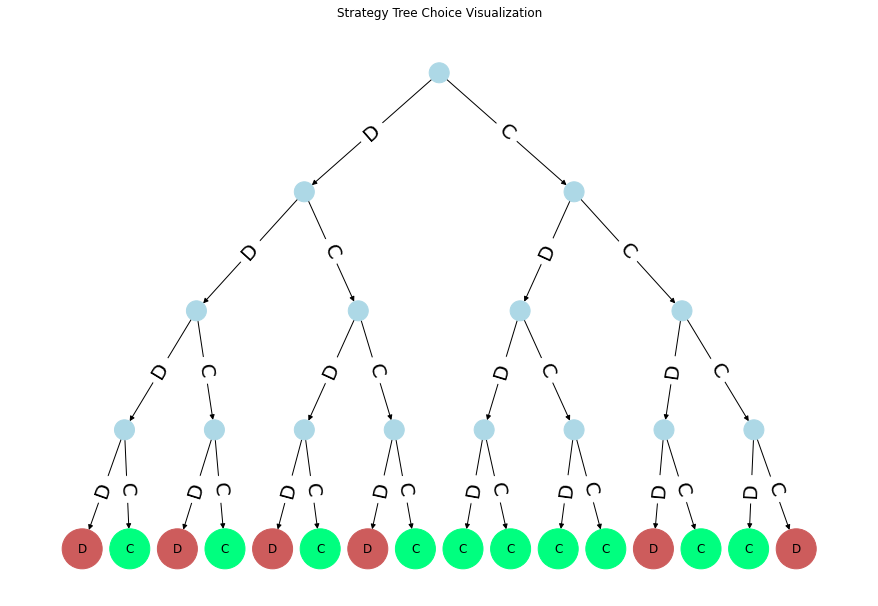

In [238]:
for best_result in results_d:
    best_strategy = best_result['strategy']
    print("Best Strategy =", best_strategy, "\nFitness =", fitness_d(best_strategy, 40))
    binary_tree_plot(best_strategy)

In [245]:
"""
TIT FOR TAT POPULATION

GRID SEARCH ALL HYPERPARAMETER COMBINATIONS 
""" 

results_t = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness_t)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness_t(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results_t.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 1, 1, 0, 1, 1, 0] 
Fitness = 3.565 
Time Taken =  3 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 1, 0, 0] 
Fitness = 3.525 
Time Taken =  7 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685 
Time Taken =  4 seconds

Population = 60 
Memory = 3 
Crossover Operator = <function two_point_crossover at 0x0000022C6F899160> 
Mutation Operator = <function i

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0] 
Fitness = 3.4450000000000003 
Time Taken =  11 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 3.66 
Time Taken =  15 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function reverse_sequence_mutation at 0x0000022C6F8D79D0> 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 3.655 
Time Taken =  10 seconds

Population = 120 
Memory = 4 
Crossover Operator = <function mid_point_crossover at 0x0000022C6F854310> 
Mutation Operator = <function inverse_mutation at 0x0000022C6FECD280> 
Mutation Rate = 0.1
Best Strategy = [1, 0, 1, 0, 1, 1, 1, 1, 1, 0

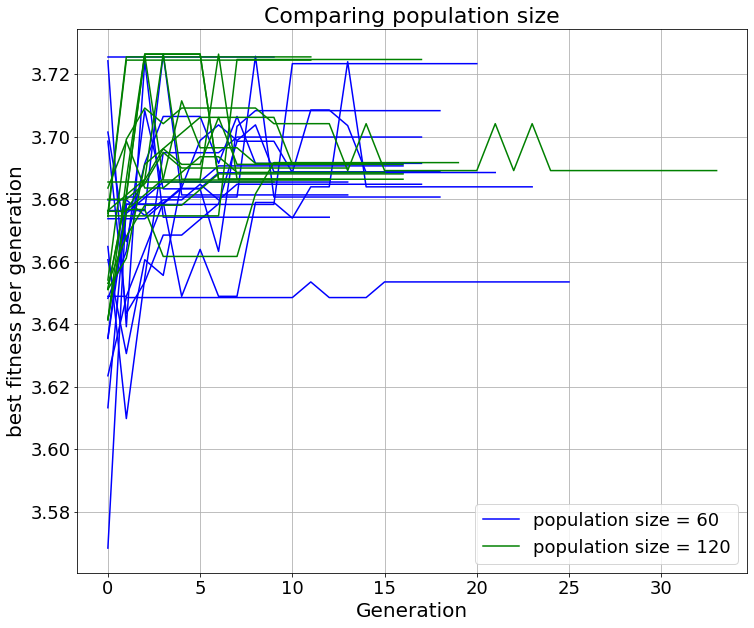

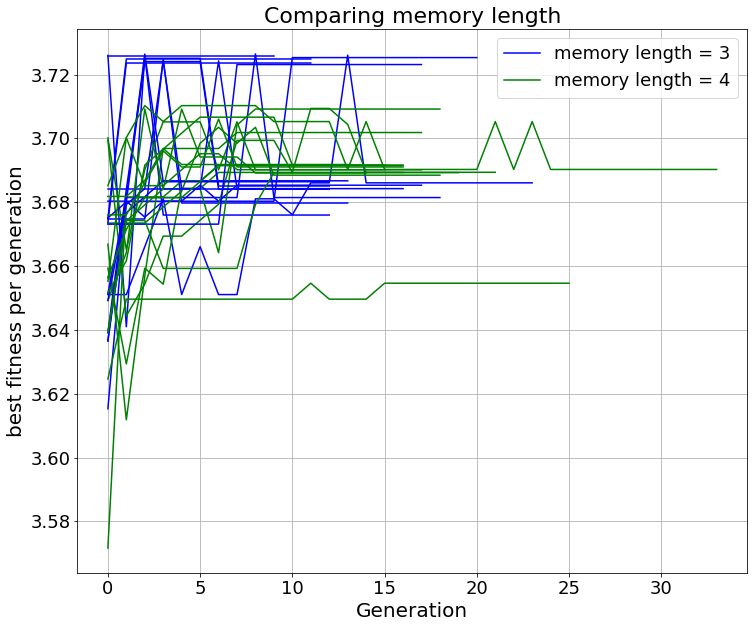

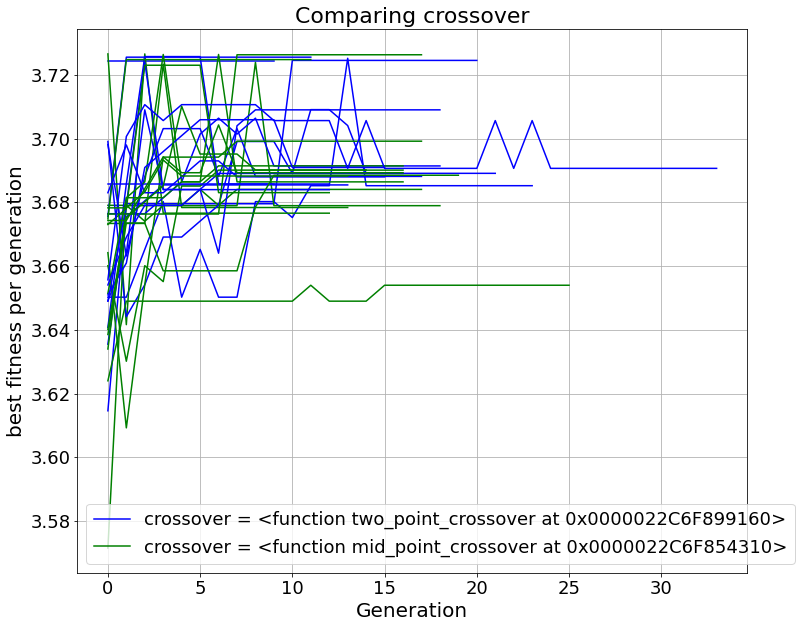

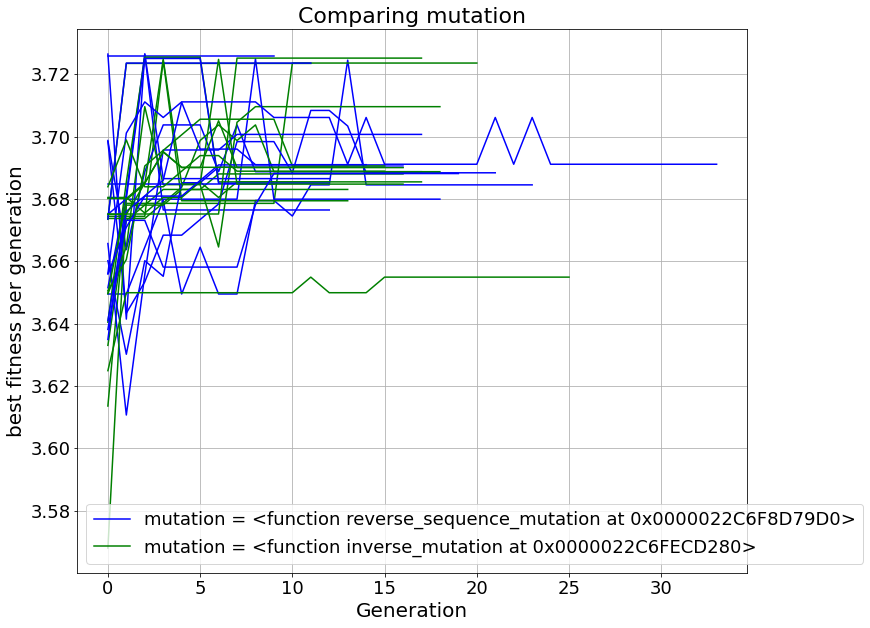

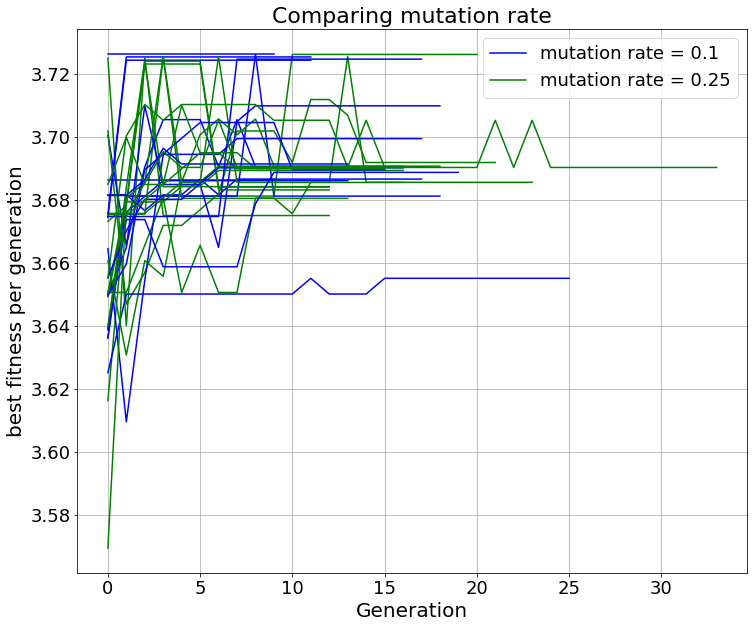

In [246]:
"""
Plotting best population fitness over generations for tit for tat population
""" 

plot(results_t, 'population size', 'best fitness per generation', 0.002)
plot(results_t, 'memory length', 'best fitness per generation', 0.002)
plot(results_t, 'crossover', 'best fitness per generation', 0.002)
plot(results_t, 'mutation', 'best fitness per generation', 0.002)
plot(results_t, 'mutation rate', 'best fitness per generation', 0.002)

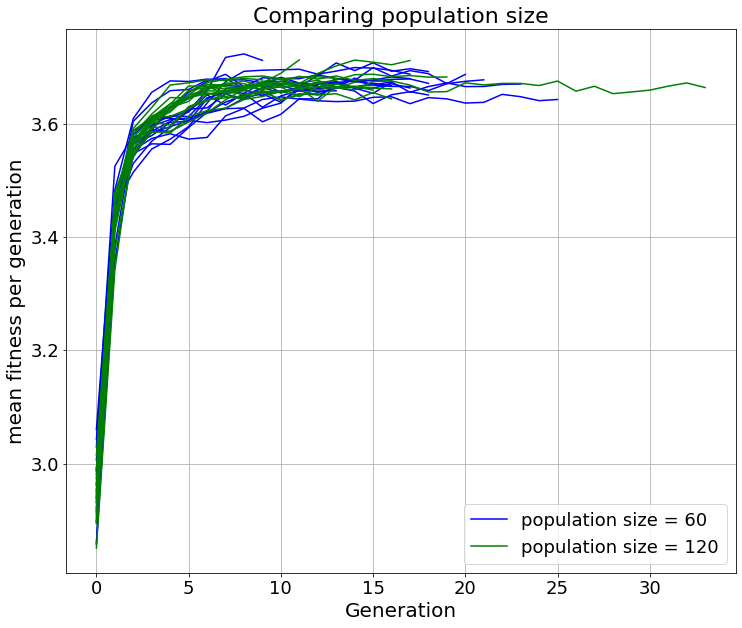

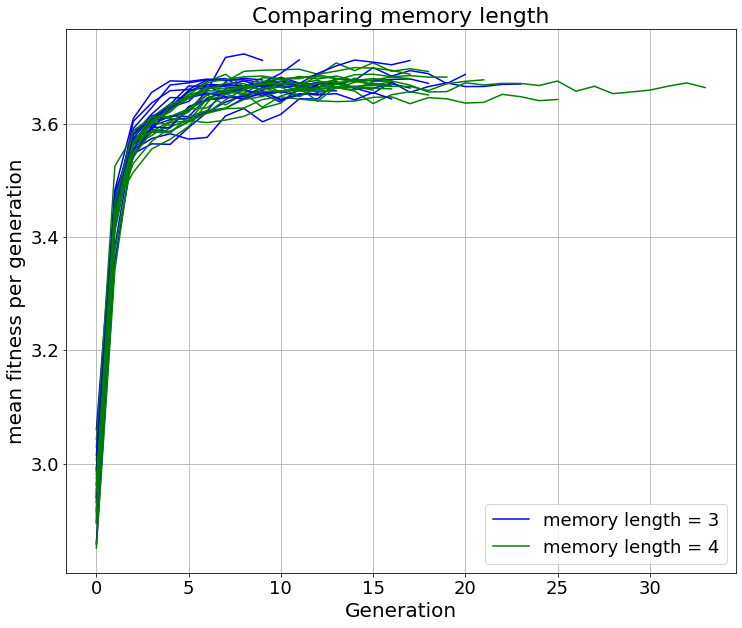

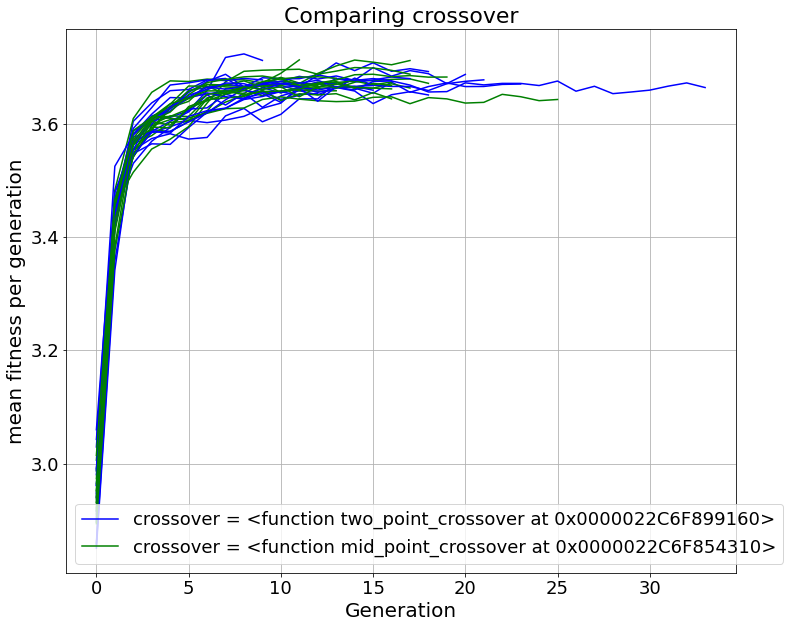

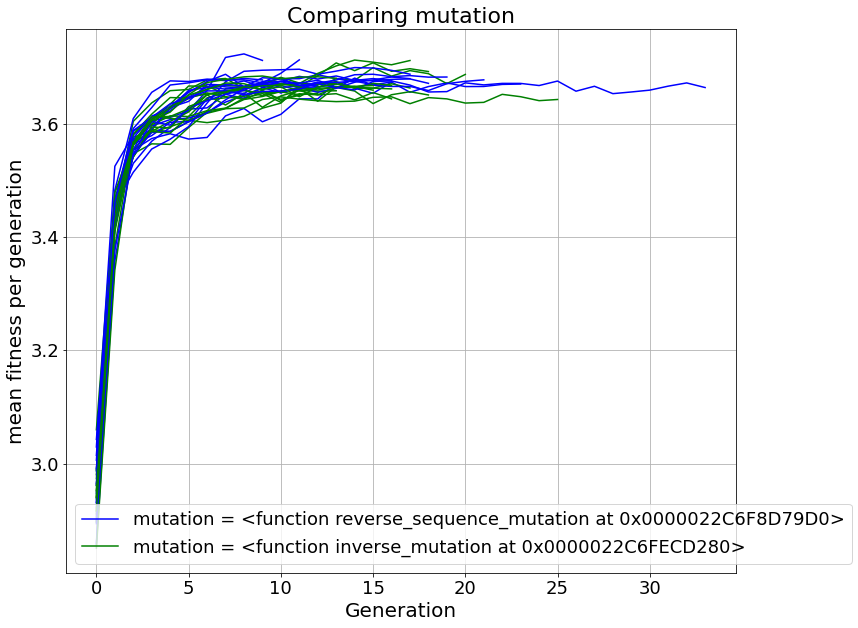

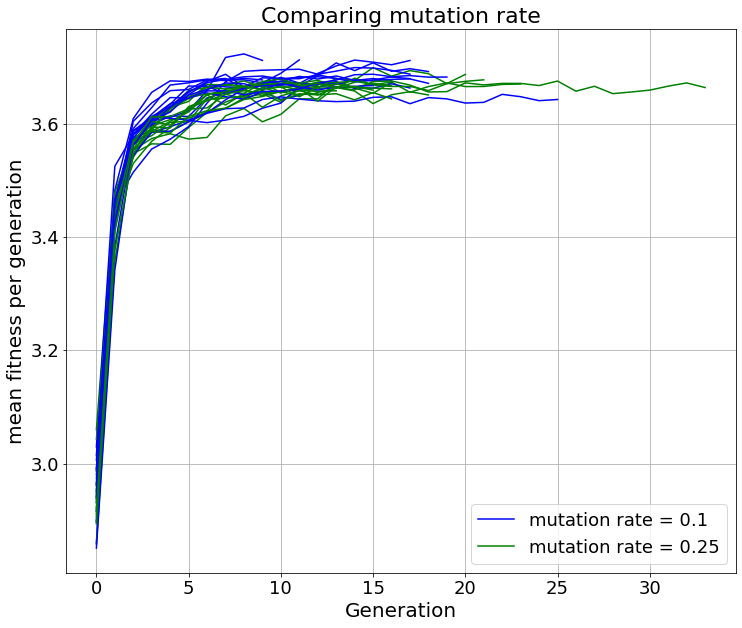

In [247]:
"""
Plotting mean population fitness over generations for tit for tat population
""" 

plot(results_t, 'population size', 'mean fitness per generation', 0)
plot(results_t, 'memory length', 'mean fitness per generation', 0)
plot(results_t, 'crossover', 'mean fitness per generation', 0)
plot(results_t, 'mutation', 'mean fitness per generation', 0)
plot(results_t, 'mutation rate', 'mean fitness per generation', 0)

Best Strategy = [0, 0, 0, 1, 1, 0, 1, 1, 0] 
Fitness = 3.565


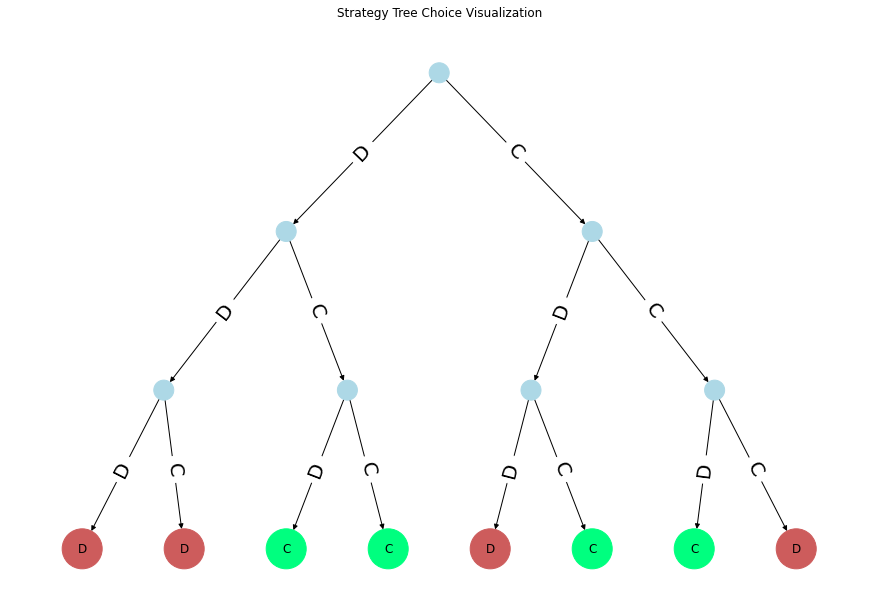

Best Strategy = [0, 0, 0, 0, 1, 1, 1, 0, 0] 
Fitness = 3.525


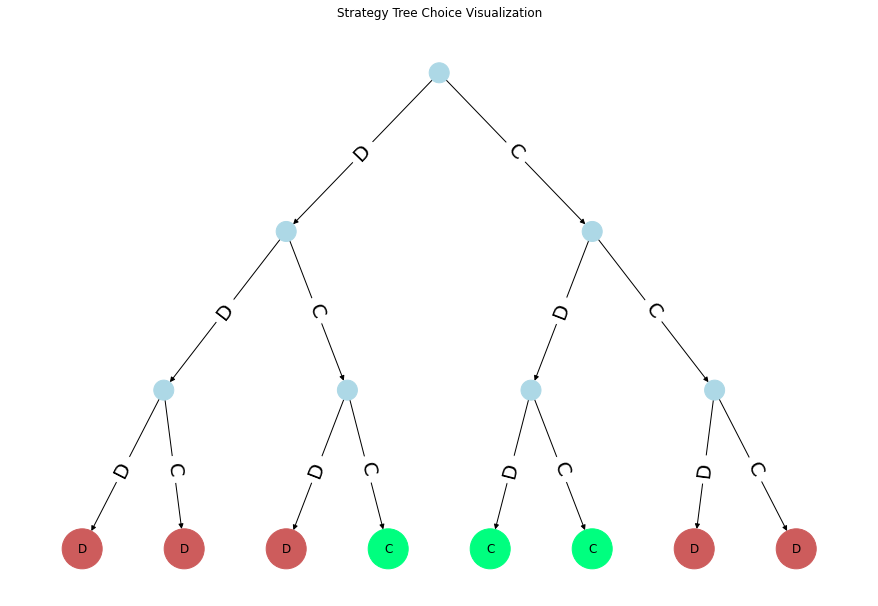

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 3.685


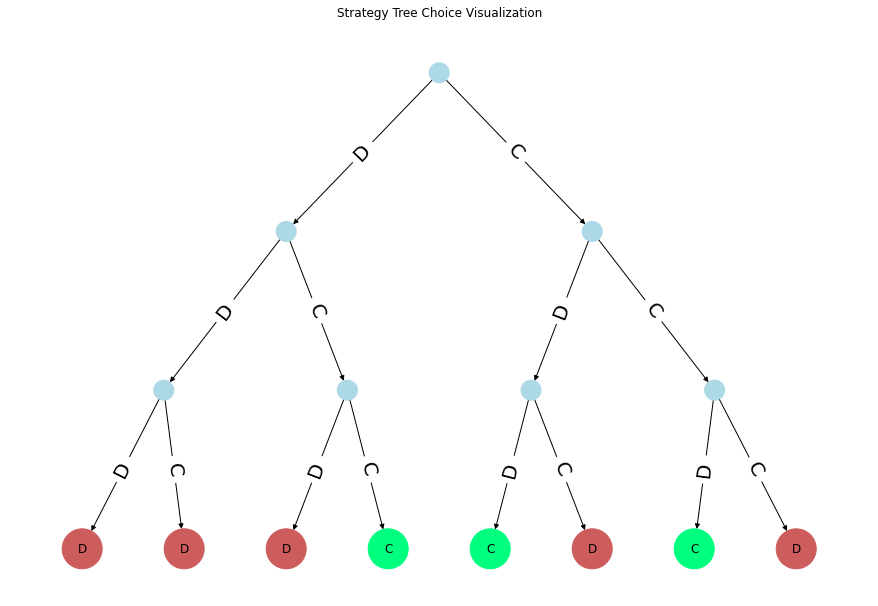

Best Strategy = [1, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 3.68


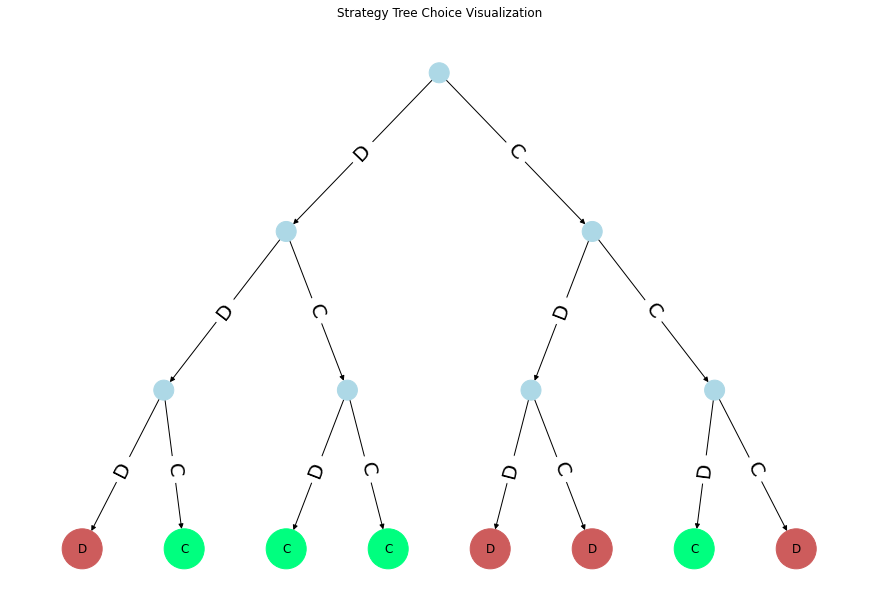

Best Strategy = [0, 0, 0, 1, 1, 1, 0, 1, 0] 
Fitness = 3.68


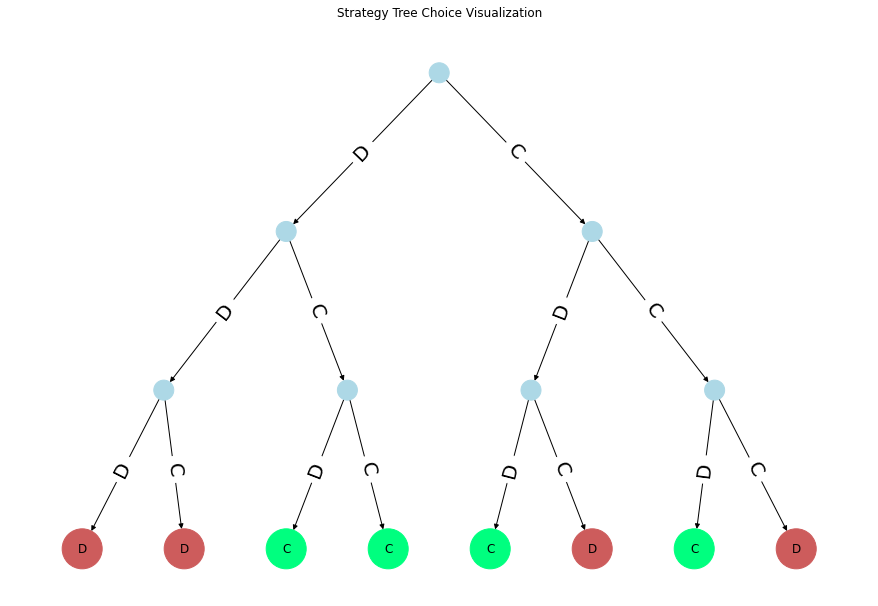

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 0, 0] 
Fitness = 3.39


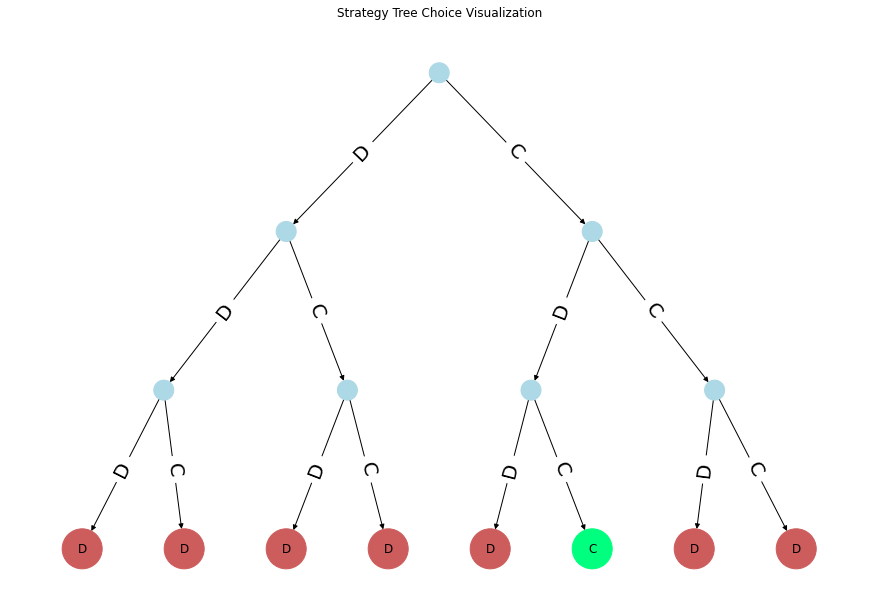

Best Strategy = [0, 0, 0, 1, 1, 1, 1, 1, 0] 
Fitness = 3.65


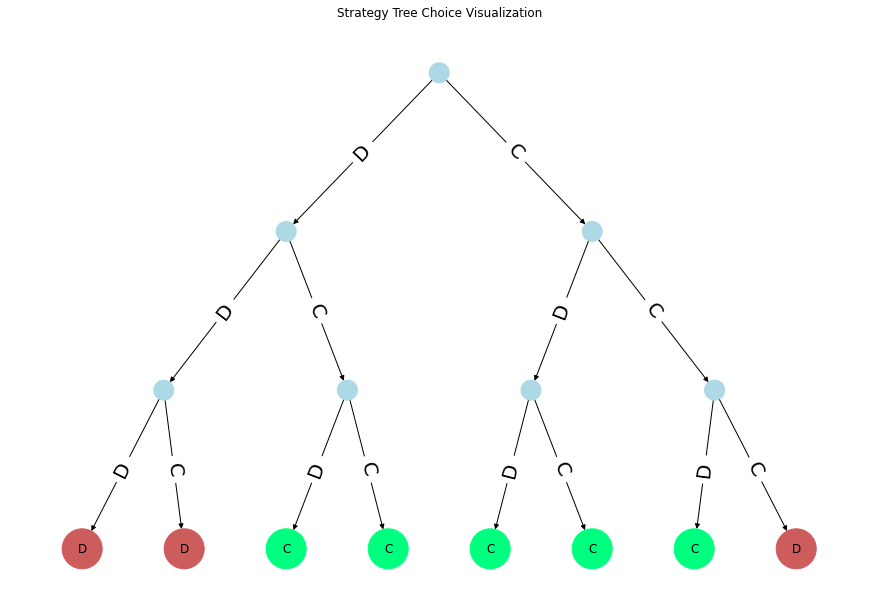

Best Strategy = [0, 0, 0, 0, 1, 0, 1, 1, 0] 
Fitness = 3.42


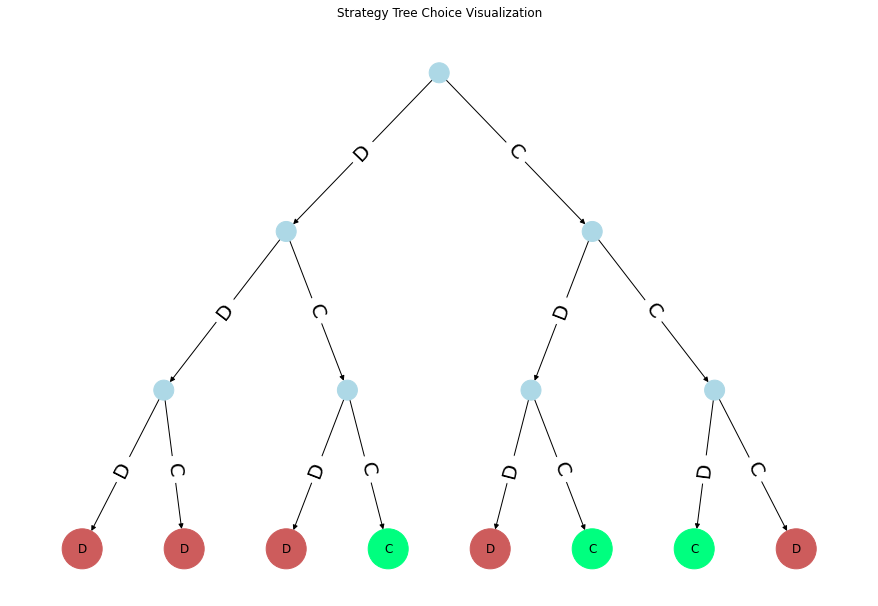

Best Strategy = [1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 3.615


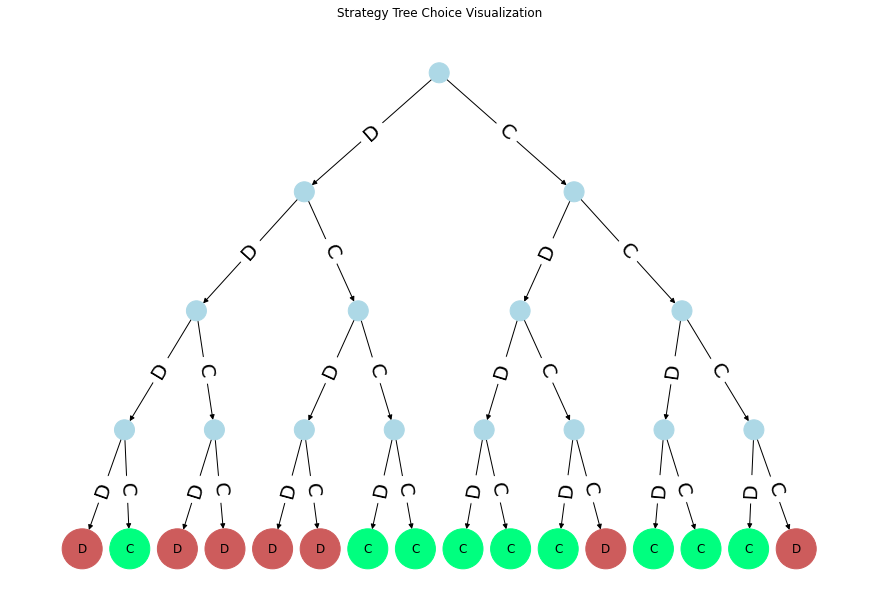

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 3.69


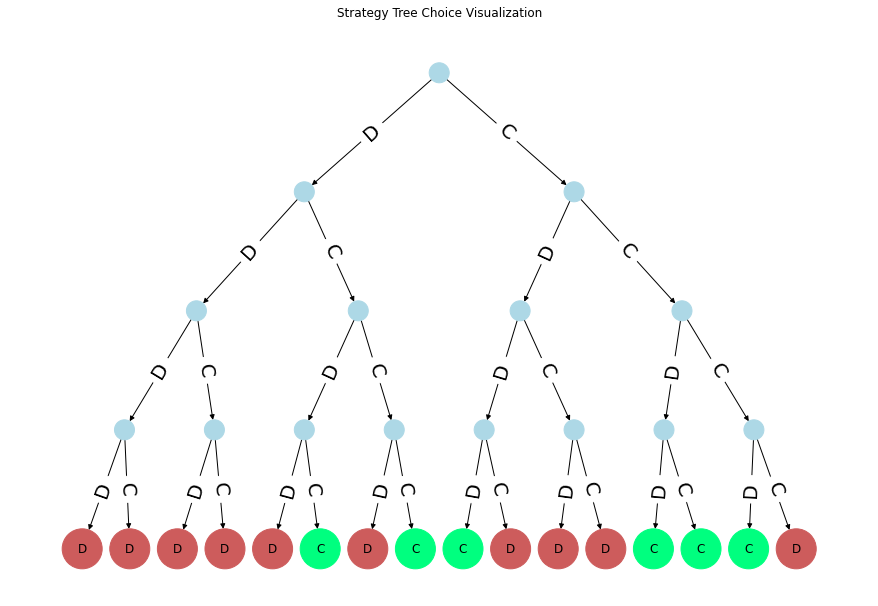

Best Strategy = [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0] 
Fitness = 3.55


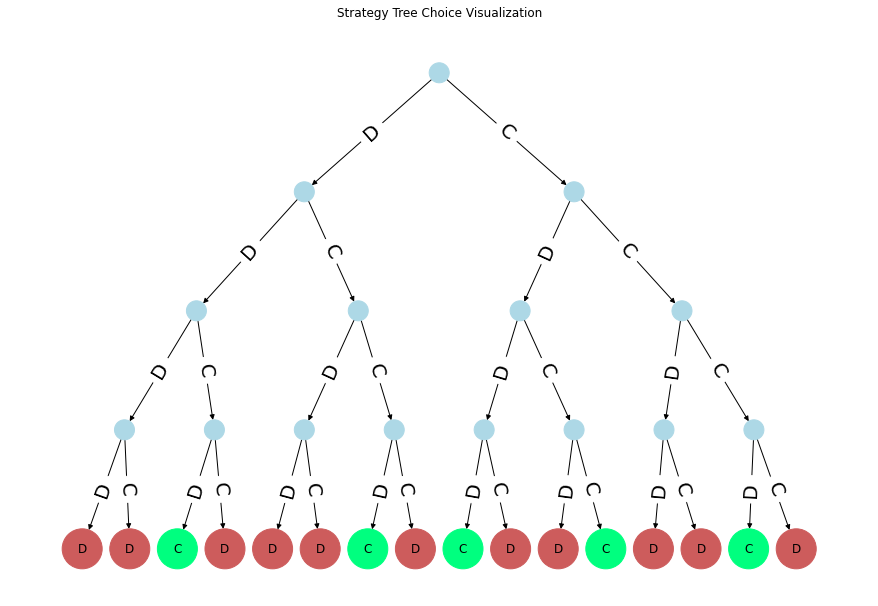

Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0] 
Fitness = 3.625


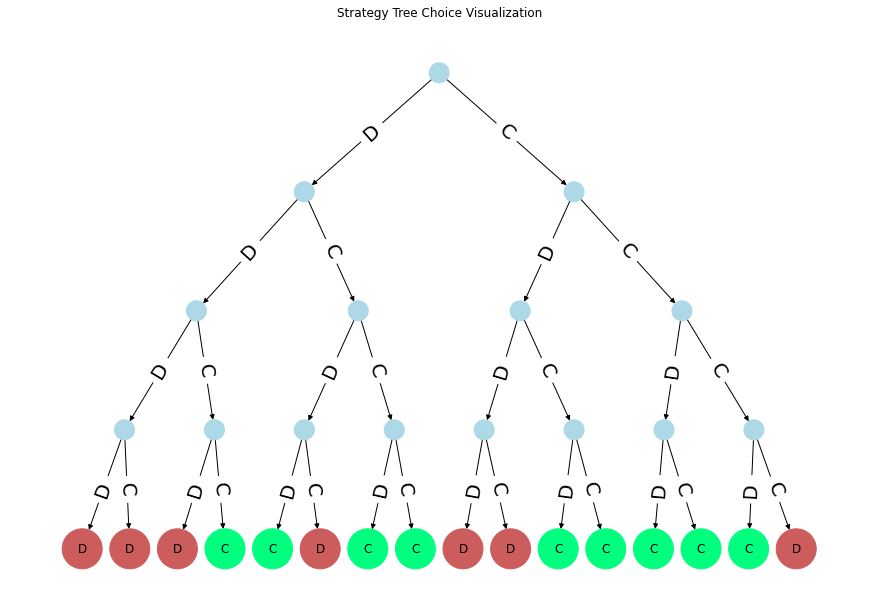

Best Strategy = [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0] 
Fitness = 3.695


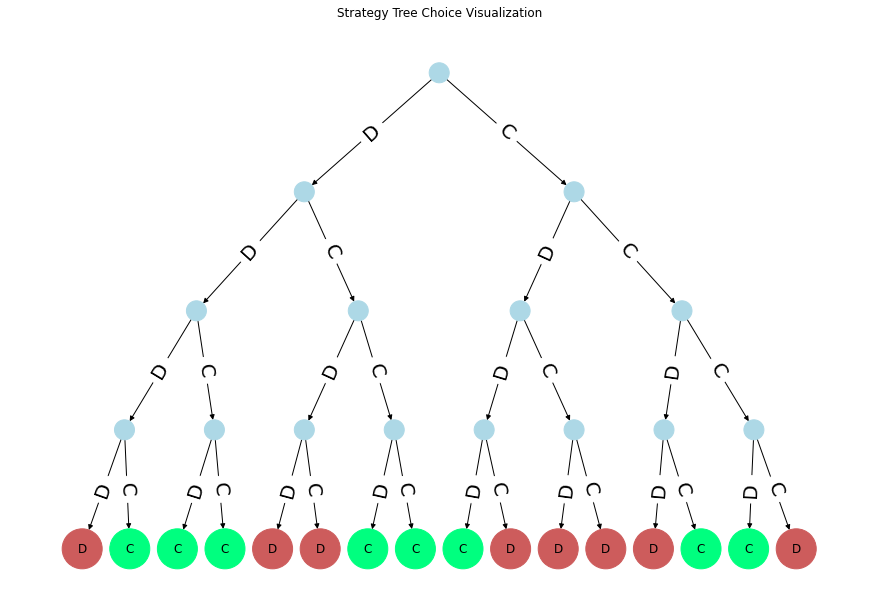

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0] 
Fitness = 3.65


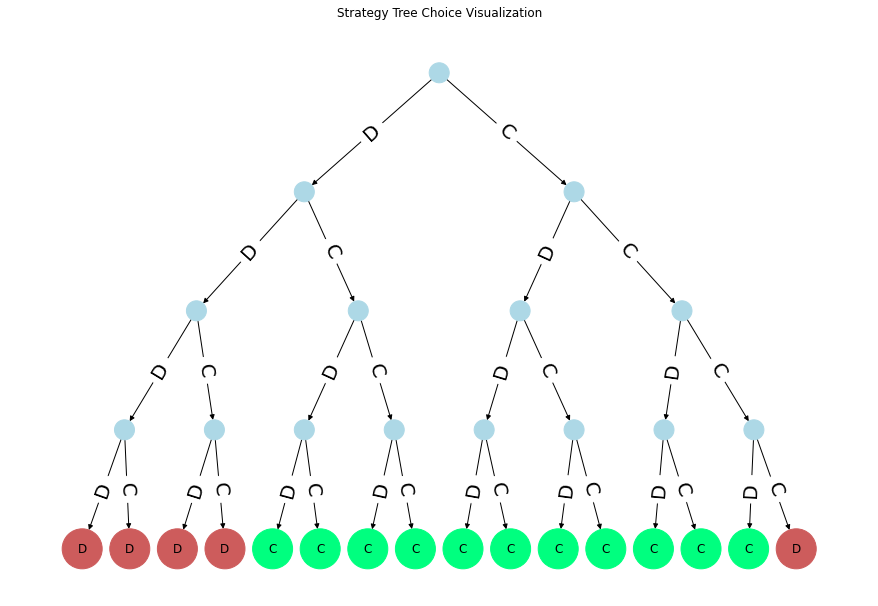

Best Strategy = [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 3.65


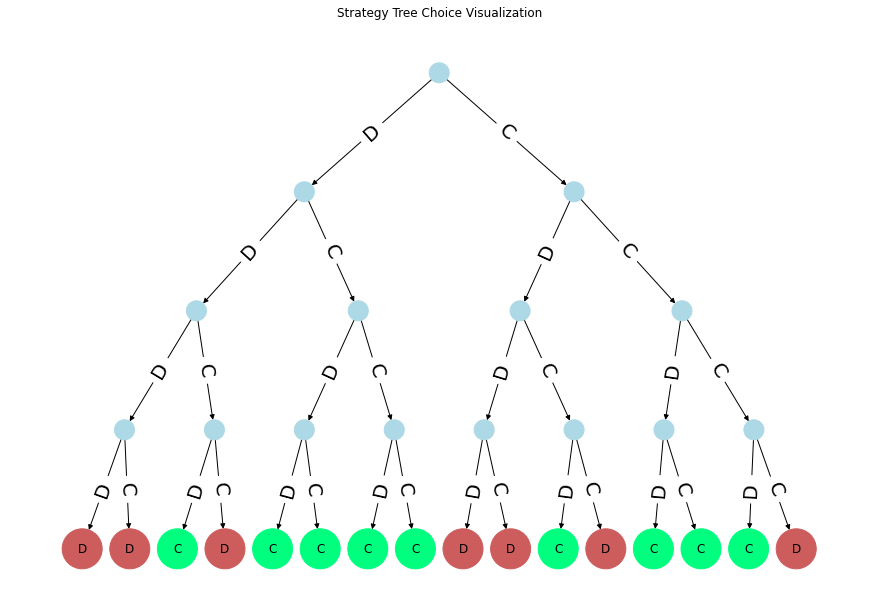

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 3.685


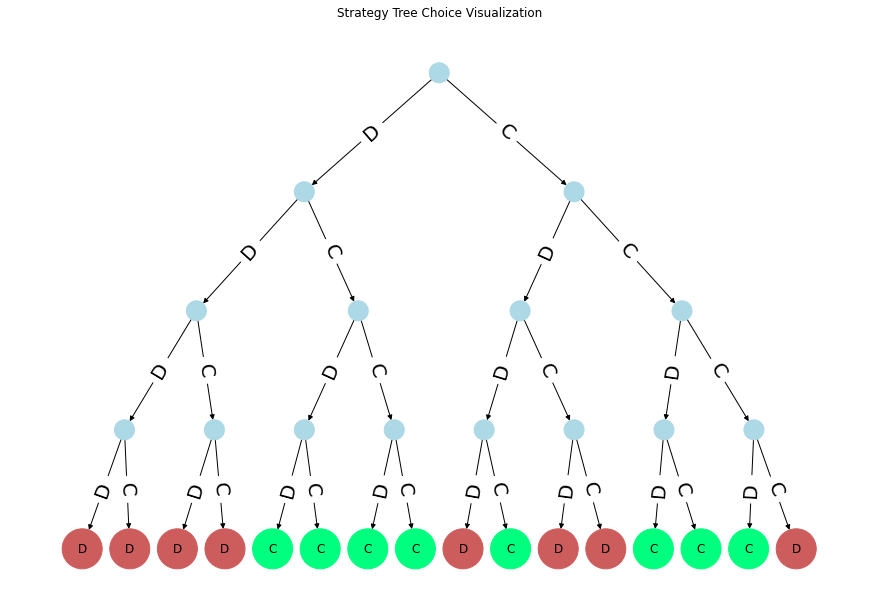

Best Strategy = [0, 0, 0, 0, 1, 1, 1, 1, 0] 
Fitness = 3.655


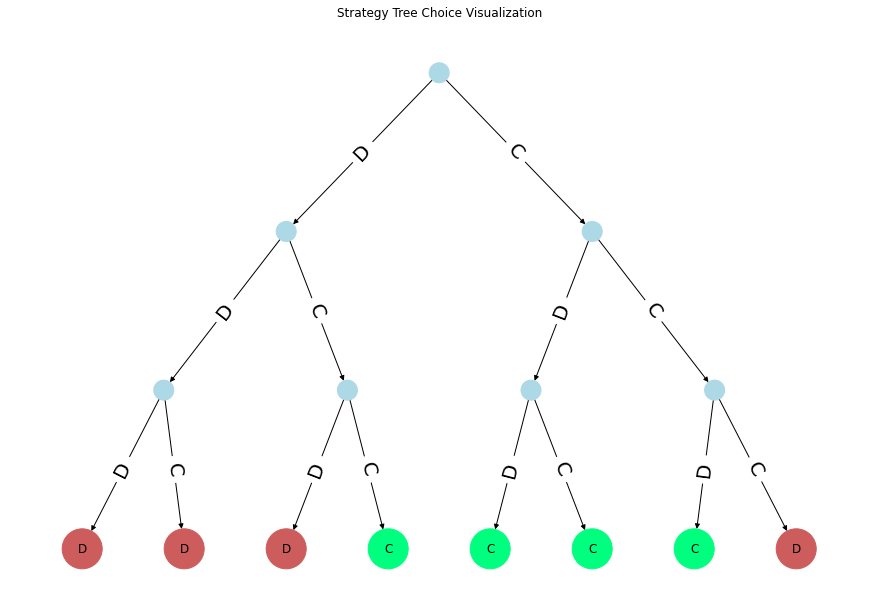

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 1, 0] 
Fitness = 3.64


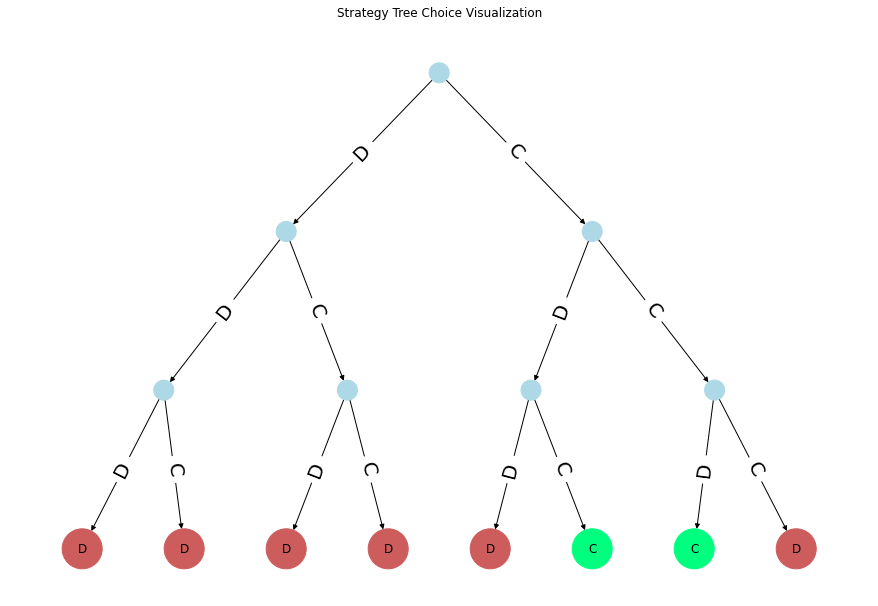

Best Strategy = [0, 0, 1, 1, 1, 1, 0, 1, 0] 
Fitness = 3.675


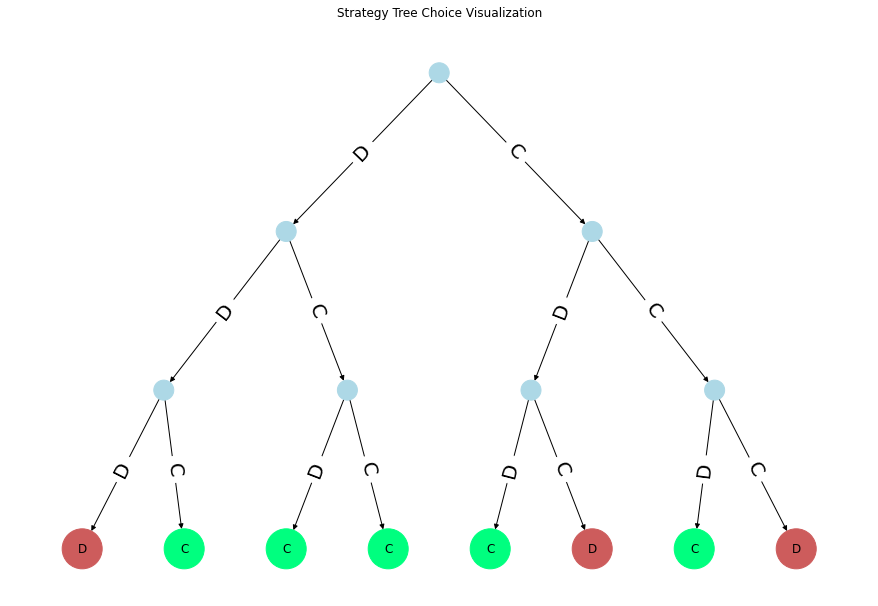

Best Strategy = [1, 0, 1, 1, 1, 0, 1, 1, 0] 
Fitness = 3.595


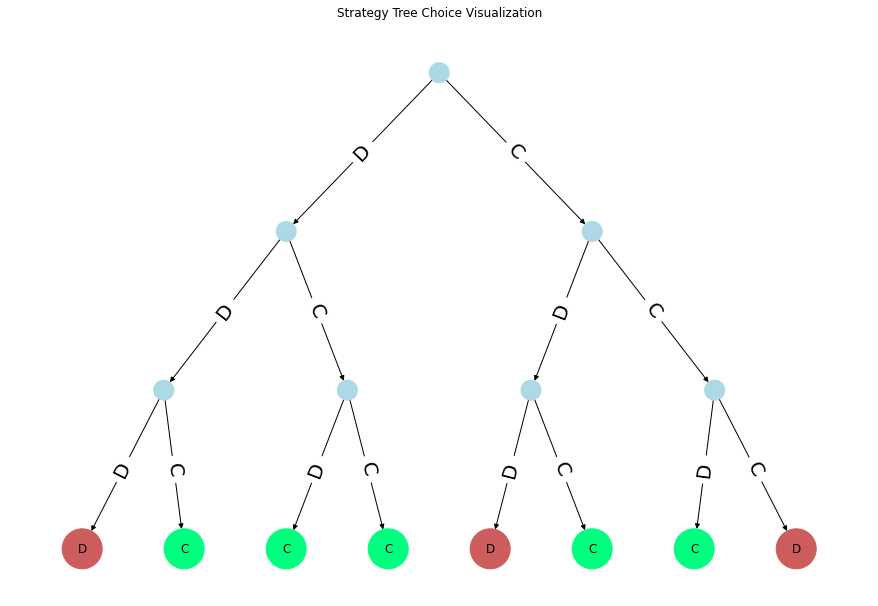

Best Strategy = [0, 0, 0, 1, 0, 0, 1, 1, 0] 
Fitness = 3.555


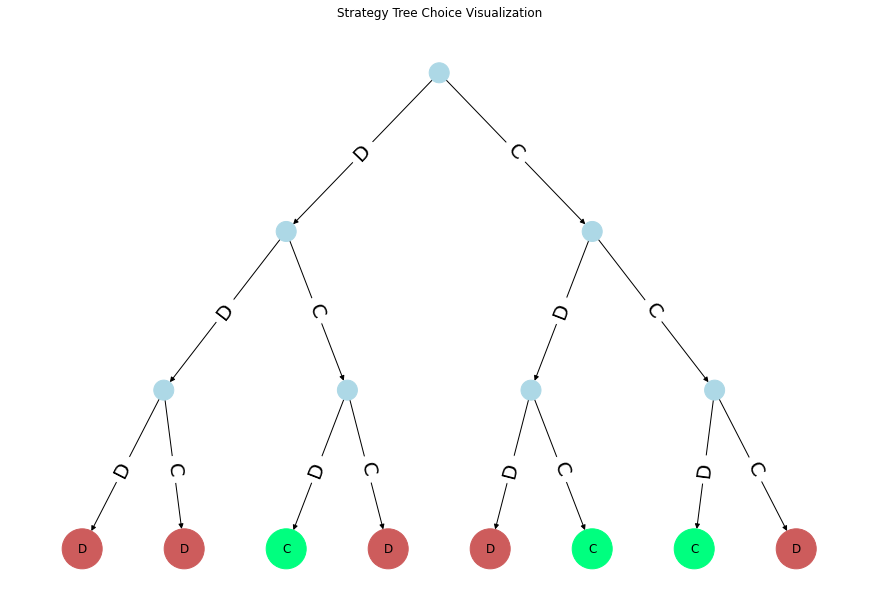

Best Strategy = [0, 0, 0, 0, 1, 0, 1, 0, 0] 
Fitness = 3.405


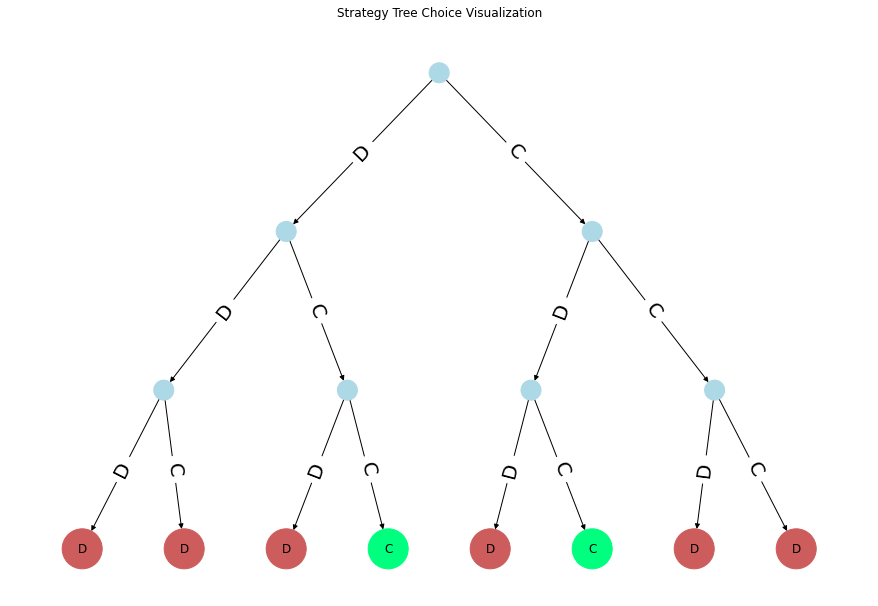

Best Strategy = [0, 0, 1, 1, 1, 1, 0, 1, 0] 
Fitness = 3.675


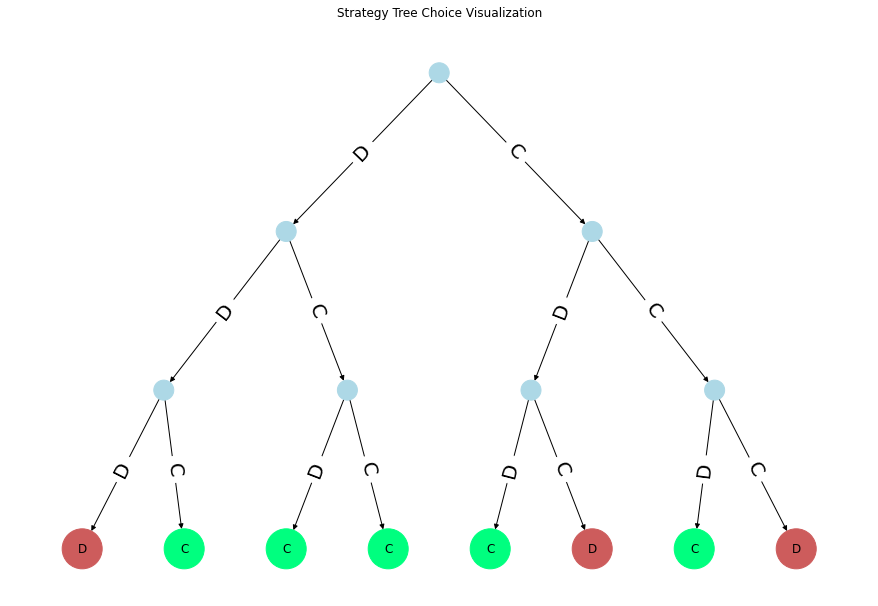

Best Strategy = [1, 0, 0, 1, 1, 1, 0, 1, 0] 
Fitness = 3.63


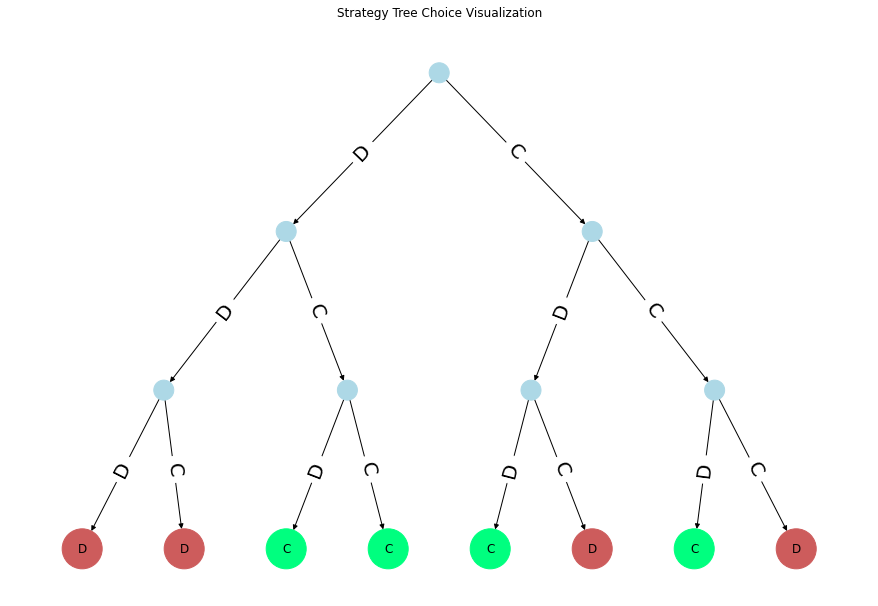

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0] 
Fitness = 3.69


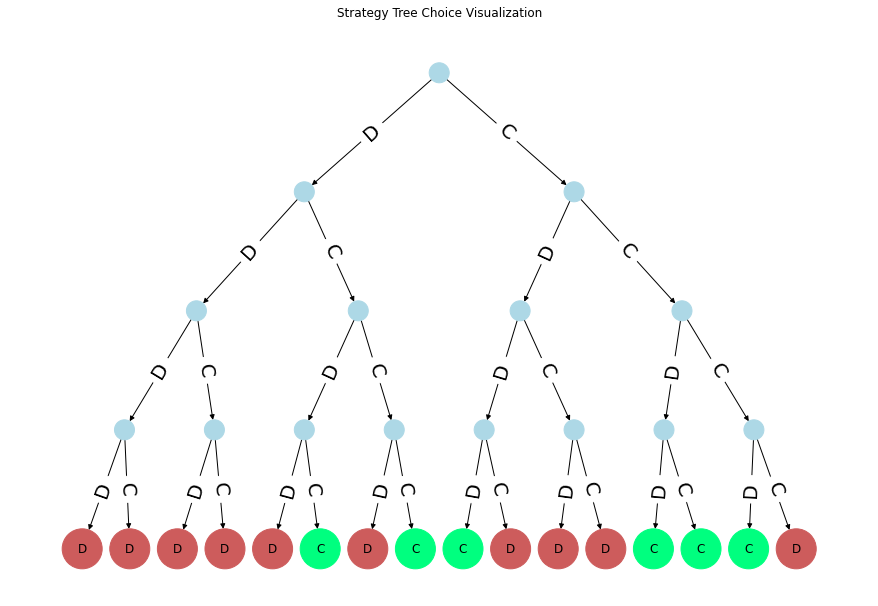

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0] 
Fitness = 3.66


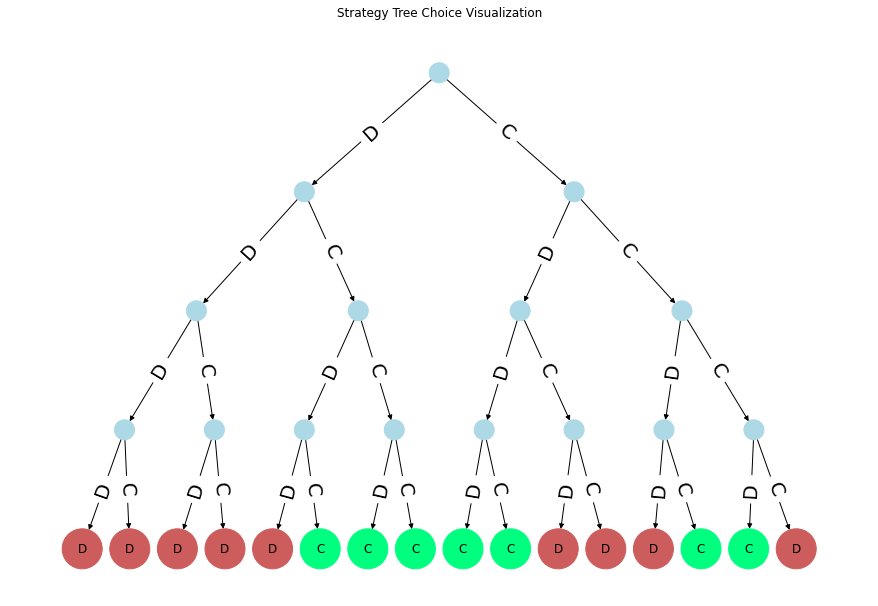

Best Strategy = [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0] 
Fitness = 3.655


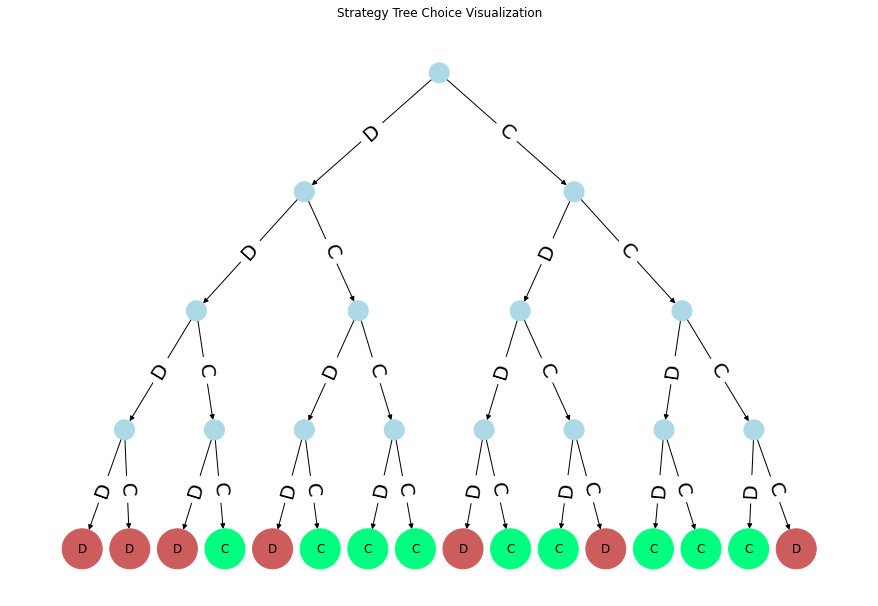

Best Strategy = [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0] 
Fitness = 3.445


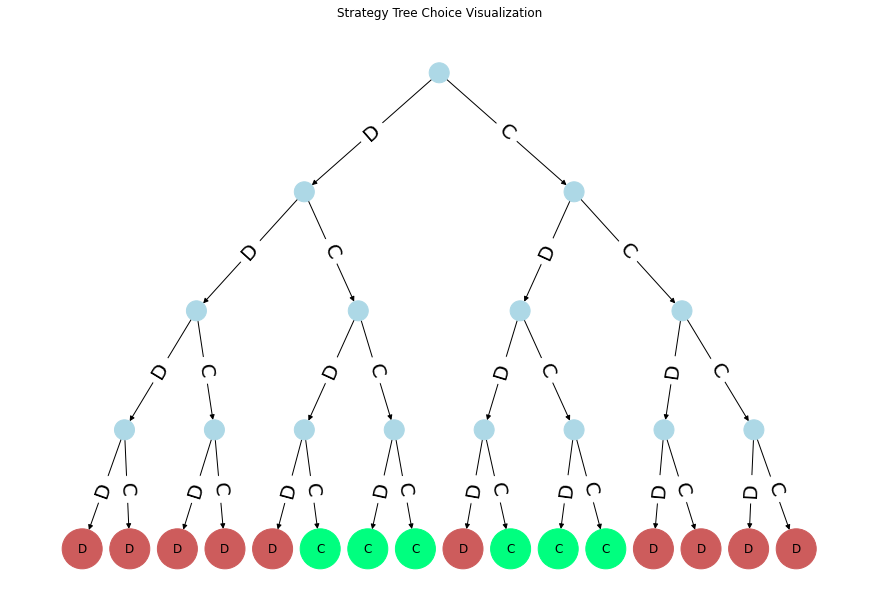

Best Strategy = [0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0] 
Fitness = 3.66


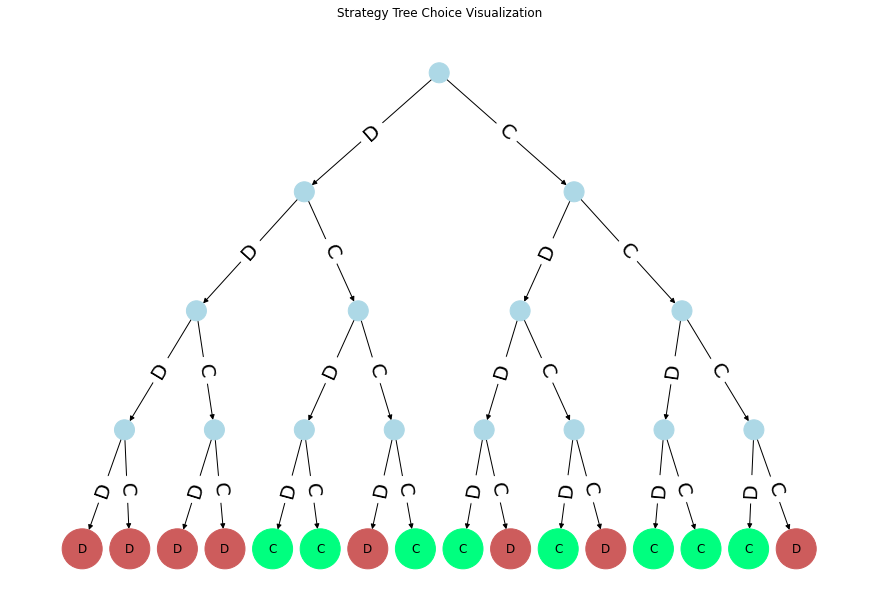

Best Strategy = [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 3.655


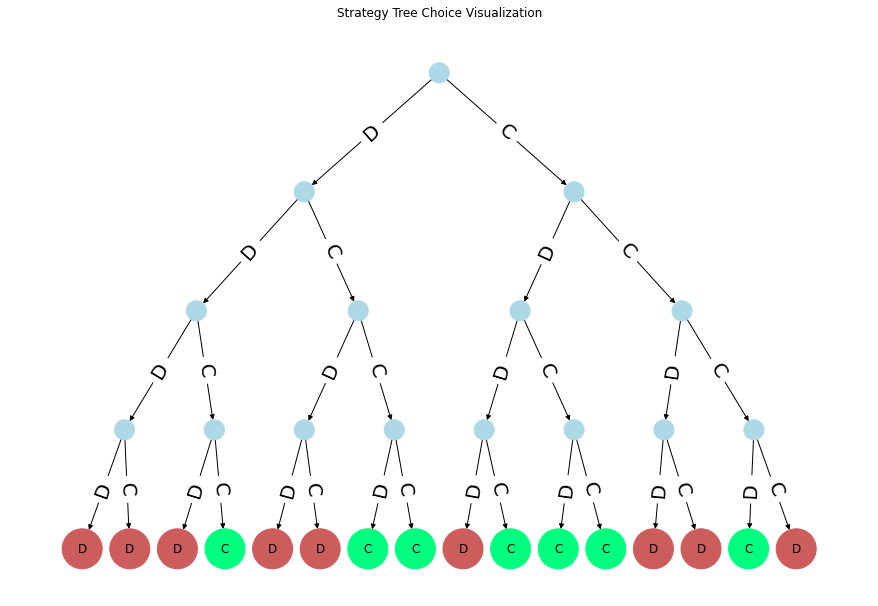

Best Strategy = [1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 3.64


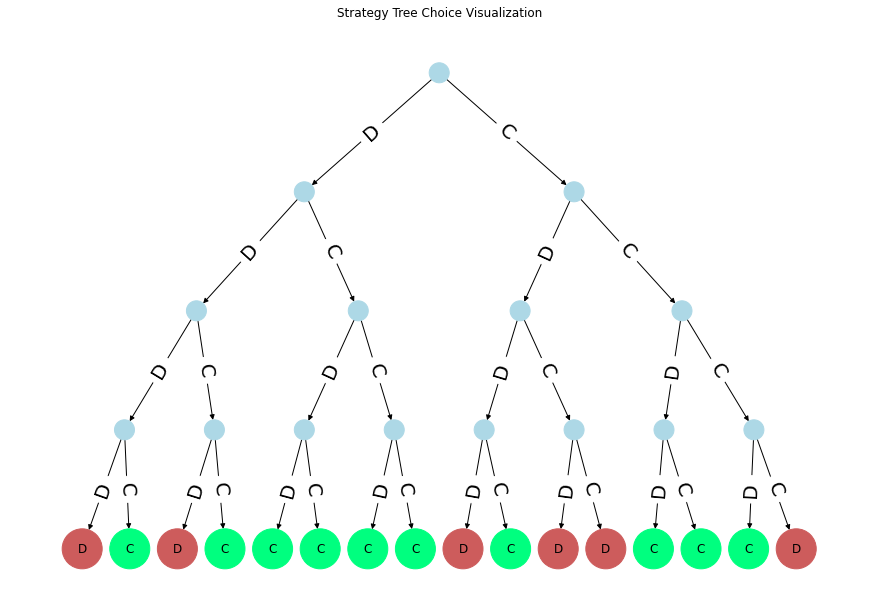

Best Strategy = [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0] 
Fitness = 3.675


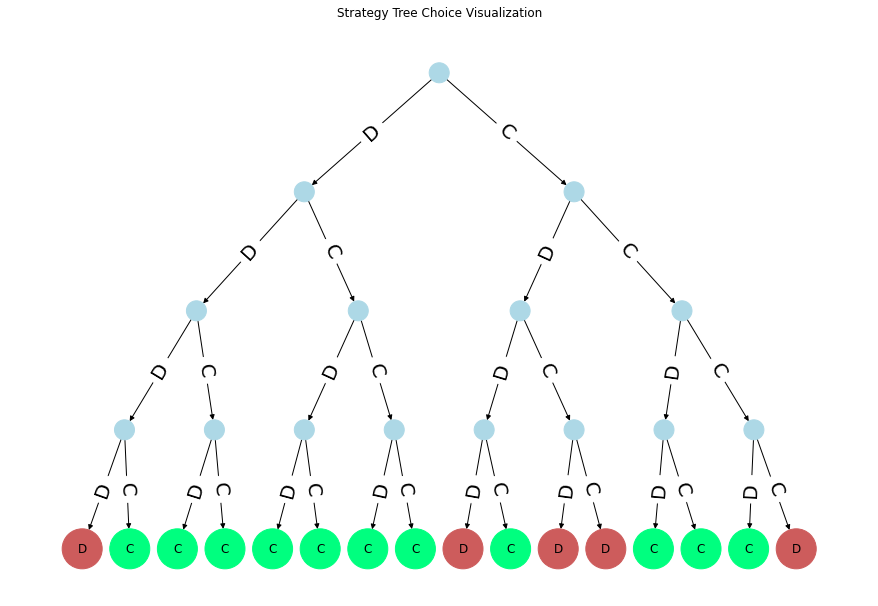

In [255]:
for best_result in results_t:
    best_strategy = best_result['strategy']
    print("Best Strategy =", best_strategy, "\nFitness =", round(fitness_t(best_strategy, 40), 4))
    binary_tree_plot(best_strategy)

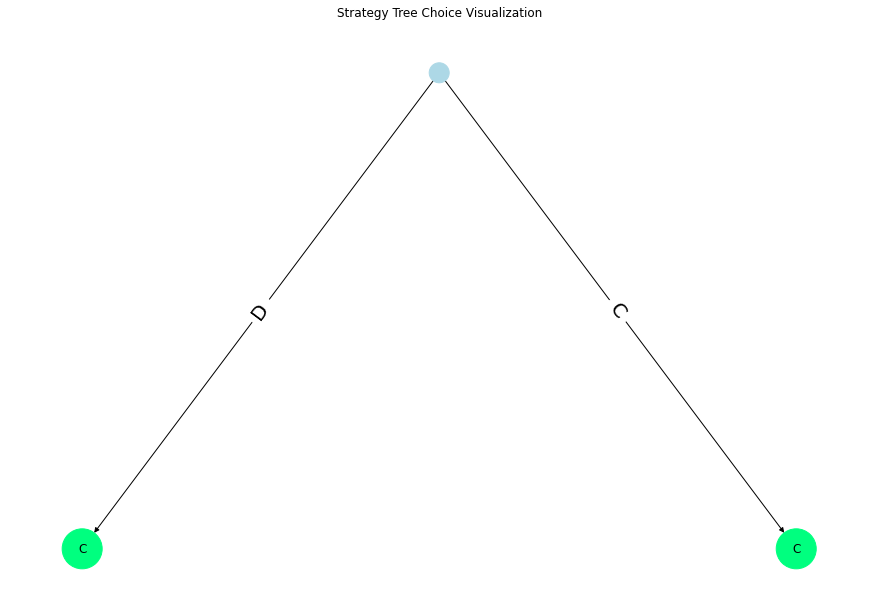

In [228]:
binary_tree_plot(always_cooperates)

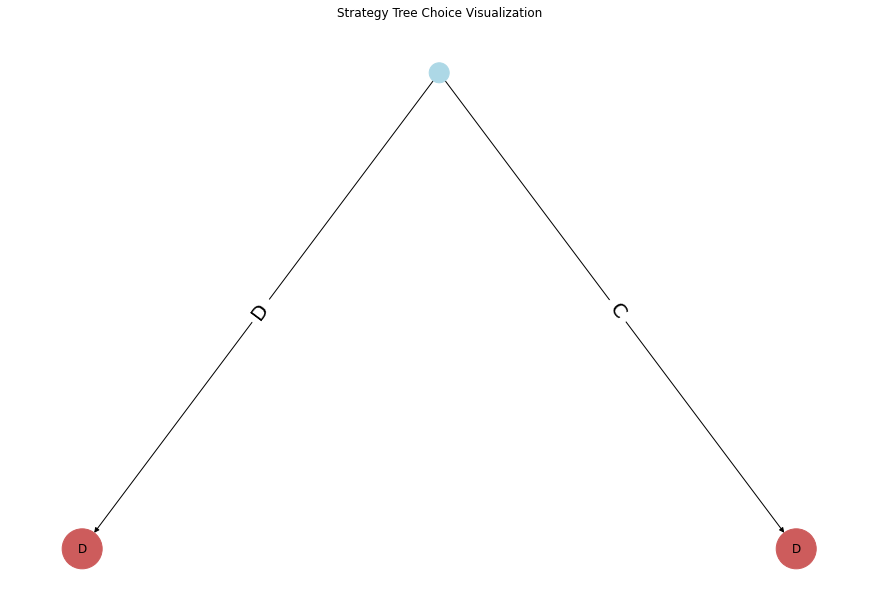

In [229]:
binary_tree_plot(always_defects)

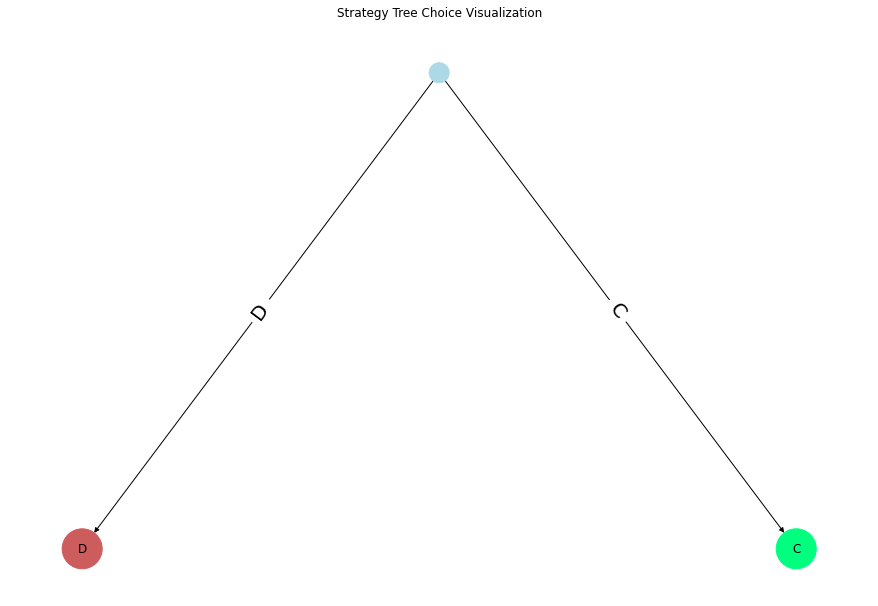

In [230]:
binary_tree_plot(tit_for_tat)

In [269]:
optimal_b = [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]
optimal_c = [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0]
optimal_d = [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]
optimal_t = [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0]

print(round(fitness(optimal_b, 40), 3))
print(round(fitness_c(optimal_b, 40), 3))
print(round(fitness_d(optimal_b, 40), 3))
print(round(fitness_t(optimal_b, 40), 3))

print(round(fitness(optimal_c, 40), 3))
print(round(fitness_c(optimal_c, 40), 3))
print(round(fitness_d(optimal_c, 40), 3))
print(round(fitness_t(optimal_c, 40), 3))

print(round(fitness(optimal_d, 40), 3))
print(round(fitness_c(optimal_d, 40), 3))
print(round(fitness_d(optimal_d, 40), 3))
print(round(fitness_t(optimal_d, 40), 3))

print(round(fitness(optimal_t, 40), 3))
print(round(fitness_c(optimal_t, 40), 3))
print(round(fitness_d(optimal_t, 40), 3))
print(round(fitness_t(optimal_t, 40), 3))

2.867
3.66
2.12
3.66
2.858
3.695
2.085
3.695
2.883
3.69
2.13
3.69
2.858
3.695
2.085
3.695
